In [1]:
import pandas as pd
import numpy as np
from collections import Counter
import os
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
import io
from PIL import Image
import scipy.stats as stats
from mippiNetbuild_att import *

In [2]:
os.getcwd()

'e:\\qw_projects\\mippi\\src\\via_att'

In [2]:
df = pd.read_csv(r'../../data/psymukb/after_predict_via_att/psymukb_biogrid_processed_via_att.csv')
df_pred = pd.read_csv(r'../../data/psymukb/after_predict_via_att/after_predicted_brief_via_att.csv')
master_table = pd.read_csv(r'../../data/psymukb/processed_psymukb.csv')

C:\Users\Administrator\AppData\Local\Temp\ipykernel_448\1884287138.py:1: DtypeWarning: Columns (9,10,11,15,21,22,23,28,29,32,46,47,58,59,61,70,71,73,74,78,80,82,90,91,93,94,96,105,106,110,111,124,125,144,145,146,148,149,150,151,152,153,154,155) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(r'../../data/psymukb/after_predict_via_att/psymukb_biogrid_processed_via_att.csv')
C:\Users\Administrator\AppData\Local\Temp\ipykernel_448\1884287138.py:3: DtypeWarning: Columns (14,16,152) have mixed types. Specify dtype option on import or set low_memory=False.
  master_table = pd.read_csv(r'../../data/psymukb/processed_psymukb.csv')


In [18]:
print('{}\n{}\n{}'.format(df.shape, df_pred.shape, master_table.shape))

(204440, 170)
(204440, 16)
(13721, 183)


In [19]:
master_table['var_abbr'] = master_table['refseq_mrna'] + '_' + master_table['protein_ori'] + master_table['protein_pos'].astype(str) + master_table['protein_mut']

## merge df_pred and df into one table

In [20]:
pd.set_option('display.max_columns', None)
df

,Unnamed: 0.1,1000G_AFR,1000G_ALL,1000G_AMR,1000G_EAS,1000G_EUR,1000G_SAS,AAChange.refGene,Alt,CADD_phred,CADD_raw,CADD_raw_rankscore,CG46,COSMIC_DIS,COSMIC_ID,Chr,ClinVar_DB,ClinVar_DBID,ClinVar_DIS,ClinVar_ID,ClinVar_SIG,DANN_rankscore,DANN_score,DeepSea_Score,DisorderCategory,ESP6500si_AA,ESP6500si_ALL,ESP6500si_EA,Eigen-PC-raw,Eigen-raw,Eigen_coding_or_noncoding,End,EntrezID,ExAC_AFR,ExAC_AMR,ExAC_EAS,ExAC_FIN,ExAC_Freq,ExAC_NFE,ExAC_OTH,ExAC_SAS,ExonicFunc.refGene,FATHMM_converted_rankscore,FATHMM_pred,FATHMM_score,Func.refGene,GERP++_RS,GERP++_RS_rankscore,GTEx_V6_gene,GTEx_V6_tissue,GWAS_BETA,GWAS_DIS,GWAS_OR,GWAS_P,GWAS_PUBMED,GWAS_SNP,Gene.refGene,GeneDetail.refGene,GenoCanyon_score,GenoCanyon_score_rankscore,HI_Rank,Haploinsufficiency_Score,Interpro_domain,LRT_converted_rankscore,LRT_pred,LRT_score,M-CAP_pred,M-CAP_rankscore,M-CAP_score,MetaLR_pred,MetaLR_rankscore,MetaLR_score,MetaSVM_pred,MetaSVM_rankscore,MetaSVM_score,MutationAssessor_pred,MutationAssessor_score,MutationAssessor_score_rankscore,MutationTaster_converted_rankscore,MutationTaster_pred,MutationTaster_score,NCI60,NumControls,NumProbands,Official Symbol Interactor A,Official Symbol Interactor B,PROVEAN_converted_rankscore,PROVEAN_pred,PROVEAN_score,Polyphen2_HDIV_pred,Polyphen2_HDIV_rankscore,Polyphen2_HDIV_score,Polyphen2_HVAR_pred,Polyphen2_HVAR_rankscore,Polyphen2_HVAR_score,PrimaryPhenotype,PubmedID,Ref,SIFT_converted_rankscore,SIFT_pred,SIFT_score,SWISS-PROT Accessions Interactor A,SWISS-PROT Accessions Interactor B,SampleID,SequenceType,SiPhy_29way_logOdds,SiPhy_29way_logOdds_rankscore,Start,StudyName,Unnamed: 0,VEST3_rankscore,VEST3_score,Validation,Variant,cDNA_var,cytoBand,dbSNP,enh_chr,enh_end,enh_id,enh_start,enh_target_geneid,exon_id,fathmm-MKL_coding_pred,fathmm-MKL_coding_rankscore,fathmm-MKL_coding_score,gene_symbol,gnomAD_exome_AFR,gnomAD_exome_ALL,gnomAD_exome_AMR,gnomAD_exome_ASJ,gnomAD_exome_EAS,gnomAD_exome_FIN,gnomAD_exome_NFE,gnomAD_exome_OTH,gnomAD_exome_SAS,gnomAD_genome_AFR,gnomAD_genome_ALL,gnomAD_genome_AMR,gnomAD_genome_ASJ,gnomAD_genome_EAS,gnomAD_genome_FIN,gnomAD_genome_NFE,gnomAD_genome_OTH,integrated_confidence_value,integrated_fitCons_score,integrated_fitCons_score_rankscore,pep_len,phastCons100way_vertebrate,phastCons100way_vertebrate_rankscore,phastCons20way_mammalian,phastCons20way_mammalian_rankscore,phyloP100way_vertebrate,phyloP100way_vertebrate_rankscore,phyloP20way_mammalian,phyloP20way_mammalian_rankscore,pro_chr,pro_end,pro_gene_symbol,pro_id,pro_start,pro_target_geneid,protein_mut,protein_ori,protein_pos,protein_var,refseq_mrna,sex,source,var_abbr
0,0,.,.,.,.,.,.,DYNC1H1:NM_001376:exon61:c.A11465C:p.H3822P,C,26.4,5.578,0.759,.,.,.,14,MedGen:OMIM,C3281202:614563,Mental_retardation\x2c_autosomal_dominant_13,RCV000022930.3,Pathogenic,0.432,0.986,0.0028925,psychiatric disorder,.,.,.,0.881,0.926,c,102505753,1778,.,.,.,.,.,.,.,.,nonsynonymous SNV,0.52,T,0.68,exonic,5.82,0.927,.,.,.,.,.,.,.,.,DYNC1H1,.,1.0,0.747,28.69%,0.285436253,.,0.843,D,0,D,0.864,0.195,T,0.726,0.365,T,0.783,-0.177,M,2.88,0.837,0.81,D,1,.,0,10,DYNC1H1,PAFAH1B1,0.969,D,-8.26,D,0.899,1,D,0.807,0.994,Intellectual disability (ID),21076407,A,0.721,D,0.002,Q14204,P43034,21076407_1,exome,16.173,0.816,102505753,Vissers 2010,0,0.992,0.988,validated,A>C,c.A11465C,14q32.31,rs387906739,14,102505975,GH14I102503,102503571,122416|23186|9895|51550|55778|106866981,exon61,D,0.977,0.996,DYNC1H1,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,0,0.707,0.73,4646.0,1.0,0.715,0.962,0.444,9.325,0.96,1.199,0.96,.,.,.,.,.,.,P,H,3822,p.H3822P,NM_001376,M,.,NM_001376_H3822P
1,1,.,.,.,.,.,.,DYNC1H1:NM_001376:exon61:c.A11465C:p.H3822P,C,26.4,5.578,0.759,.,.,.,14,MedGen:OMIM,C3281202:614563,Mental_retardation\x2c_autosomal_dominant_13,RCV000022930.3,Pathogenic,0.432,0.986,0.0028925,psychiatric disorder,.,.,.,0.881,0.926,c,102505753,1778,.,.,.,.,.,.,.,.,nonsynonymous SNV,0.52,T,0.68,exonic,5.82,0.927,.,.,.,.,.,.,.,.,DYNC1H1,.,1.0,0.747,28.69%,0.285436253,.,0.843,D,0,D,0.864,0.195,T,0.726,0.3

In [21]:
df_pred

,Unnamed: 0,refseq_mrna,var_abbr,SWISS-PROT Accessions Interactor B,protein_pos,uniprotAC,pred_class,score_class0,score_class1,score_class2,score_class3,pred_re_class,re_score_class0,re_score_class1,re_score_class2,re_score_class3
0,0,NM_001376,NM_001376_H3822P,P43034,3822,P43034,0,0.546749,0.041238,0.406565,0.005448,2,0.363300,0.015069,0.534088,0.087543
1,1,NM_001376,NM_001376_H3822P,Q9GZM8,3822,Q9GZM8,0,0.535689,0.001547,0.462284,0.000480,2,0.302540,0.000559,0.695747,0.001154
2,2,NM_001376,NM_001376_H3822P,Q9BVA0,3822,Q9BVA0,2,0.255954,0.118368,0.623477,0.002202,2,0.097984,0.012408,0.765094,0.124514
3,3,NM_001376,NM_001376_H3822P,O75449,3822,O75449,2,0.206518,0.002881,0.789948,0.000653,2,0.044889,0.000497,0.953703,0.000912
4,4,NM_001376,NM_001376_H3822P,P49810,3822,P49810,2,0.316107,0.252670,0.388427,0.042796,2,0.220401,0.067626,0.478315,0.233658
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
204435,204435,NM_031407,NM_031407_A402V,Q15910,402,Q15910,2,0.410155,0.067559,0.434491,0.087795,2,0.398624,0.148396,0.408693,0.044287
204436,204436,NM_031407,NM_031407_A402V,Q16576,402,Q16576,0,0.348061,0.133307,0.235147,0.283486,0,0.380944,0.265167,0.270345,0.083543
204437,204437,NM_031407,NM_031407_A402V,P11142,402,P11142,3,0.030320,0.285020,0.203443,0.481218,1,0.036840,0.523226,0.263639,0.176295
204438,204438,NM_031407,NM_031407_A402V,P00533,402,P00533,3,0.252783,0.226797,0.196561,0.323858,1,0.265208,0.359797,0.270044,0.104952


In [22]:
df_plus = pd.concat([df, df_pred], axis=1)

In [23]:
df_plus = df_plus.loc[:, ~df_plus.columns.duplicated()]

In [24]:
df_plus.shape

(204440, 181)

In [25]:
df_plus.reset_index(drop=True, inplace=True)
master_table.reset_index(drop=True, inplace=True)

In [26]:
df_plus

,Unnamed: 0.1,1000G_AFR,1000G_ALL,1000G_AMR,1000G_EAS,1000G_EUR,1000G_SAS,AAChange.refGene,Alt,CADD_phred,CADD_raw,CADD_raw_rankscore,CG46,COSMIC_DIS,COSMIC_ID,Chr,ClinVar_DB,ClinVar_DBID,ClinVar_DIS,ClinVar_ID,ClinVar_SIG,DANN_rankscore,DANN_score,DeepSea_Score,DisorderCategory,ESP6500si_AA,ESP6500si_ALL,ESP6500si_EA,Eigen-PC-raw,Eigen-raw,Eigen_coding_or_noncoding,End,EntrezID,ExAC_AFR,ExAC_AMR,ExAC_EAS,ExAC_FIN,ExAC_Freq,ExAC_NFE,ExAC_OTH,ExAC_SAS,ExonicFunc.refGene,FATHMM_converted_rankscore,FATHMM_pred,FATHMM_score,Func.refGene,GERP++_RS,GERP++_RS_rankscore,GTEx_V6_gene,GTEx_V6_tissue,GWAS_BETA,GWAS_DIS,GWAS_OR,GWAS_P,GWAS_PUBMED,GWAS_SNP,Gene.refGene,GeneDetail.refGene,GenoCanyon_score,GenoCanyon_score_rankscore,HI_Rank,Haploinsufficiency_Score,Interpro_domain,LRT_converted_rankscore,LRT_pred,LRT_score,M-CAP_pred,M-CAP_rankscore,M-CAP_score,MetaLR_pred,MetaLR_rankscore,MetaLR_score,MetaSVM_pred,MetaSVM_rankscore,MetaSVM_score,MutationAssessor_pred,MutationAssessor_score,MutationAssessor_score_rankscore,MutationTaster_converted_rankscore,MutationTaster_pred,MutationTaster_score,NCI60,NumControls,NumProbands,Official Symbol Interactor A,Official Symbol Interactor B,PROVEAN_converted_rankscore,PROVEAN_pred,PROVEAN_score,Polyphen2_HDIV_pred,Polyphen2_HDIV_rankscore,Polyphen2_HDIV_score,Polyphen2_HVAR_pred,Polyphen2_HVAR_rankscore,Polyphen2_HVAR_score,PrimaryPhenotype,PubmedID,Ref,SIFT_converted_rankscore,SIFT_pred,SIFT_score,SWISS-PROT Accessions Interactor A,SWISS-PROT Accessions Interactor B,SampleID,SequenceType,SiPhy_29way_logOdds,SiPhy_29way_logOdds_rankscore,Start,StudyName,Unnamed: 0,VEST3_rankscore,VEST3_score,Validation,Variant,cDNA_var,cytoBand,dbSNP,enh_chr,enh_end,enh_id,enh_start,enh_target_geneid,exon_id,fathmm-MKL_coding_pred,fathmm-MKL_coding_rankscore,fathmm-MKL_coding_score,gene_symbol,gnomAD_exome_AFR,gnomAD_exome_ALL,gnomAD_exome_AMR,gnomAD_exome_ASJ,gnomAD_exome_EAS,gnomAD_exome_FIN,gnomAD_exome_NFE,gnomAD_exome_OTH,gnomAD_exome_SAS,gnomAD_genome_AFR,gnomAD_genome_ALL,gnomAD_genome_AMR,gnomAD_genome_ASJ,gnomAD_genome_EAS,gnomAD_genome_FIN,gnomAD_genome_NFE,gnomAD_genome_OTH,integrated_confidence_value,integrated_fitCons_score,integrated_fitCons_score_rankscore,pep_len,phastCons100way_vertebrate,phastCons100way_vertebrate_rankscore,phastCons20way_mammalian,phastCons20way_mammalian_rankscore,phyloP100way_vertebrate,phyloP100way_vertebrate_rankscore,phyloP20way_mammalian,phyloP20way_mammalian_rankscore,pro_chr,pro_end,pro_gene_symbol,pro_id,pro_start,pro_target_geneid,protein_mut,protein_ori,protein_pos,protein_var,refseq_mrna,sex,source,var_abbr,uniprotAC,pred_class,score_class0,score_class1,score_class2,score_class3,pred_re_class,re_score_class0,re_score_class1,re_score_class2,re_score_class3
0,0,.,.,.,.,.,.,DYNC1H1:NM_001376:exon61:c.A11465C:p.H3822P,C,26.4,5.578,0.759,.,.,.,14,MedGen:OMIM,C3281202:614563,Mental_retardation\x2c_autosomal_dominant_13,RCV000022930.3,Pathogenic,0.432,0.986,0.0028925,psychiatric disorder,.,.,.,0.881,0.926,c,102505753,1778,.,.,.,.,.,.,.,.,nonsynonymous SNV,0.52,T,0.68,exonic,5.82,0.927,.,.,.,.,.,.,.,.,DYNC1H1,.,1.0,0.747,28.69%,0.285436253,.,0.843,D,0,D,0.864,0.195,T,0.726,0.365,T,0.783,-0.177,M,2.88,0.837,0.81,D,1,.,0,10,DYNC1H1,PAFAH1B1,0.969,D,-8.26,D,0.899,1,D,0.807,0.994,Intellectual disability (ID),21076407,A,0.721,D,0.002,Q14204,P43034,21076407_1,exome,16.173,0.816,102505753,Vissers 2010,0,0.992,0.988,validated,A>C,c.A11465C,14q32.31,rs387906739,14,102505975,GH14I102503,102503571,122416|23186|9895|51550|55778|106866981,exon61,D,0.977,0.996,DYNC1H1,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,0,0.707,0.73,4646.0,1.0,0.715,0.962,0.444,9.325,0.96,1.199,0.96,.,.,.,.,.,.,P,H,3822,p.H3822P,NM_001376,M,.,NM_001376_H3822P,P43034,0,0.546749,0.041238,0.406565,0.005448,2,0.363300,0.015069,0.534088,0.087543
1,1,.,.,.,.,.,.,DYNC1H1:NM_001376:exon61:c.A11465C:p.H3822P,C,26.4,5.578,0.759,.,.,.,14,MedGen:OMIM,C3281202:614563,Mental_retardation\x2c_autosomal_dominant_13,RCV000022930.3,Pathogenic,

In [35]:
DDtable = df_plus[df_plus["PrimaryPhenotype"] == 'Developmental Delay (DD)']
print(DDtable.shape)

# remove error value of SIFT score : '.'
new_df_plus = DDtable[~(DDtable['CADD_phred'] == '.')]
new_df_plus[['CADD_phred']] = new_df_plus[['CADD_phred']].astype(float)
new_df_plus = new_df_plus[~(new_df_plus['CADD_phred'] <= 30)]
print(new_df_plus.shape)

mutation_list = DDtable['AAChange.refGene'].unique().tolist()
print(len(mutation_list))

(52655, 181)
(13237, 181)
3051


C:\Users\Administrator\AppData\Local\Temp\ipykernel_448\3298330047.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df_plus[['CADD_phred']] = new_df_plus[['CADD_phred']].astype(float)


cosine similarity distribution

In [59]:

from sklearn.metrics.pairwise import cosine_similarity
import json
type_list = ["no effect","increasing","disrupting","decreasing"]
mutation_list = df_plus['AAChange.refGene'].unique().tolist()
print(len(mutation_list)) # 11937

cos_dis_list = []
cos_dis_dict = {}
# initial the Cosine Similarity dictionary
for i in range(101):
    if(i == 100):
        break
    #cos_dis_dict[str(round(float(i/10),1)) + " - " + str(round(float((i + 1)/10),1))] = 0
    cos_dis_dict[i] = 0

'''
new_matrix = pd.concat([df_plus[df_plus['AAChange.refGene'] == "DYNC1H1:NM_001376:exon61:c.A11465C:p.H3822P"]["score_class0"],
                        df_plus[df_plus['AAChange.refGene'] == "DYNC1H1:NM_001376:exon61:c.A11465C:p.H3822P"]["score_class1"]],axis=1).reset_index(drop=True).values
#new_matrix = np.array([[1,4,2,3],[5,2,30,6],[1,4,1,2]])
'''

for mutation in mutation_list: # for each mutated protein
    # four scores of MIPPI of all partner proteins
    score_table = pd.concat([df_plus[df_plus['AAChange.refGene'] == mutation]["score_class0"],
                             df_plus[df_plus['AAChange.refGene'] == mutation]["score_class1"],
                             df_plus[df_plus['AAChange.refGene'] == mutation]["score_class2"],
                             df_plus[df_plus['AAChange.refGene'] == mutation]["score_class3"]], axis=1).reset_index(drop=True).values
    # Calculate the Cosine Similarity between partner protein pairs (of the same mutated protein)
    #print(score_table.shape)

    s = np.triu(cosine_similarity(score_table))
    for i in s:
        for j in i:
            similarity = round(j,15) # float16
            if(similarity != 0 and similarity != 1): 
                cos_dis_list.append(j)
                if(int(similarity/0.01) == 100):
                    cos_dis_dict[99] += 1
                else:
                    cos_dis_dict[int(similarity/0.01)] += 1

print(cos_dis_dict)
#print(len(cos_dis_list)) # 8135859, 8m46s

with open('Cosine_Similarity.json', 'w') as fp:
    json.dump(cos_dis_dict, fp)

cos_dis = np.array(cos_dis_list)
np.save("Cosine_Similarity.npy", cos_dis)





11937
{0: 36, 1: 294, 2: 610, 3: 1062, 4: 1344, 5: 1740, 6: 1812, 7: 2073, 8: 2151, 9: 2597, 10: 2883, 11: 3603, 12: 3773, 13: 3960, 14: 4086, 15: 4501, 16: 4827, 17: 5090, 18: 5175, 19: 5655, 20: 6211, 21: 6294, 22: 6905, 23: 7160, 24: 7997, 25: 7973, 26: 8739, 27: 9759, 28: 10310, 29: 10406, 30: 10515, 31: 11363, 32: 11604, 33: 12879, 34: 13441, 35: 14570, 36: 14652, 37: 15657, 38: 15901, 39: 16841, 40: 18050, 41: 18700, 42: 19252, 43: 20080, 44: 21278, 45: 22144, 46: 22442, 47: 24299, 48: 24944, 49: 26946, 50: 26889, 51: 29200, 52: 29848, 53: 31569, 54: 33090, 55: 34337, 56: 34837, 57: 37712, 58: 38954, 59: 41356, 60: 43205, 61: 45817, 62: 47118, 63: 49470, 64: 52551, 65: 54527, 66: 56462, 67: 58605, 68: 62386, 69: 65795, 70: 68405, 71: 72674, 72: 75384, 73: 79598, 74: 83785, 75: 88239, 76: 92811, 77: 97933, 78: 105322, 79: 110620, 80: 117434, 81: 125165, 82: 131742, 83: 141365, 84: 151844, 85: 162292, 86: 172630, 87: 185542, 88: 200106, 89: 214219, 90: 235617, 91: 258179, 92: 28294

In [64]:
import numpy as np
cos_dis = np.load("Cosine_Similarity.npy")
print(np.mean(cos_dis))
print(np.median(cos_dis))

0.8444025673857605
0.9094706294569642


{'0': 36, '1': 294, '2': 610, '3': 1062, '4': 1344, '5': 1740, '6': 1812, '7': 2073, '8': 2151, '9': 2597, '10': 2883, '11': 3603, '12': 3773, '13': 3960, '14': 4086, '15': 4501, '16': 4827, '17': 5090, '18': 5175, '19': 5655, '20': 6211, '21': 6294, '22': 6905, '23': 7160, '24': 7997, '25': 7973, '26': 8739, '27': 9759, '28': 10310, '29': 10406, '30': 10515, '31': 11363, '32': 11604, '33': 12879, '34': 13441, '35': 14570, '36': 14652, '37': 15657, '38': 15901, '39': 16841, '40': 18050, '41': 18700, '42': 19252, '43': 20080, '44': 21278, '45': 22144, '46': 22442, '47': 24299, '48': 24944, '49': 26946, '50': 26889, '51': 29200, '52': 29848, '53': 31569, '54': 33090, '55': 34337, '56': 34837, '57': 37712, '58': 38954, '59': 41356, '60': 43205, '61': 45817, '62': 47118, '63': 49470, '64': 52551, '65': 54527, '66': 56462, '67': 58605, '68': 62386, '69': 65795, '70': 68405, '71': 72674, '72': 75384, '73': 79598, '74': 83785, '75': 88239, '76': 92811, '77': 97933, '78': 105322, '79': 110620,

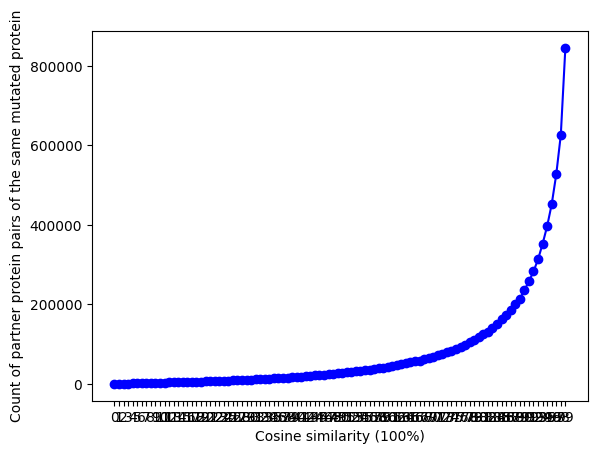

In [58]:
import json
with open('Cosine_Similarity.json', 'r') as fp:
    cs_data = json.load(fp)
print(cs_data)

import matplotlib.pyplot as plt
x = []
y = []
for key in cs_data.keys():
    x.append(key)
    y.append(cs_data[key])
plt.plot(x, y, 'o-', color = 'b')
plt.xlabel("Cosine similarity (100%) of four prediction scores of MIPPI")
plt.ylabel("Count of partner protein pairs of the same mutated protein")
plt.show()

In [65]:
df_plus

,Unnamed: 0.1,1000G_AFR,1000G_ALL,1000G_AMR,1000G_EAS,1000G_EUR,1000G_SAS,AAChange.refGene,Alt,CADD_phred,CADD_raw,CADD_raw_rankscore,CG46,COSMIC_DIS,COSMIC_ID,Chr,ClinVar_DB,ClinVar_DBID,ClinVar_DIS,ClinVar_ID,ClinVar_SIG,DANN_rankscore,DANN_score,DeepSea_Score,DisorderCategory,ESP6500si_AA,ESP6500si_ALL,ESP6500si_EA,Eigen-PC-raw,Eigen-raw,Eigen_coding_or_noncoding,End,EntrezID,ExAC_AFR,ExAC_AMR,ExAC_EAS,ExAC_FIN,ExAC_Freq,ExAC_NFE,ExAC_OTH,ExAC_SAS,ExonicFunc.refGene,FATHMM_converted_rankscore,FATHMM_pred,FATHMM_score,Func.refGene,GERP++_RS,GERP++_RS_rankscore,GTEx_V6_gene,GTEx_V6_tissue,GWAS_BETA,GWAS_DIS,GWAS_OR,GWAS_P,GWAS_PUBMED,GWAS_SNP,Gene.refGene,GeneDetail.refGene,GenoCanyon_score,GenoCanyon_score_rankscore,HI_Rank,Haploinsufficiency_Score,Interpro_domain,LRT_converted_rankscore,LRT_pred,LRT_score,M-CAP_pred,M-CAP_rankscore,M-CAP_score,MetaLR_pred,MetaLR_rankscore,MetaLR_score,MetaSVM_pred,MetaSVM_rankscore,MetaSVM_score,MutationAssessor_pred,MutationAssessor_score,MutationAssessor_score_rankscore,MutationTaster_converted_rankscore,MutationTaster_pred,MutationTaster_score,NCI60,NumControls,NumProbands,Official Symbol Interactor A,Official Symbol Interactor B,PROVEAN_converted_rankscore,PROVEAN_pred,PROVEAN_score,Polyphen2_HDIV_pred,Polyphen2_HDIV_rankscore,Polyphen2_HDIV_score,Polyphen2_HVAR_pred,Polyphen2_HVAR_rankscore,Polyphen2_HVAR_score,PrimaryPhenotype,PubmedID,Ref,SIFT_converted_rankscore,SIFT_pred,SIFT_score,SWISS-PROT Accessions Interactor A,SWISS-PROT Accessions Interactor B,SampleID,SequenceType,SiPhy_29way_logOdds,SiPhy_29way_logOdds_rankscore,Start,StudyName,Unnamed: 0,VEST3_rankscore,VEST3_score,Validation,Variant,cDNA_var,cytoBand,dbSNP,enh_chr,enh_end,enh_id,enh_start,enh_target_geneid,exon_id,fathmm-MKL_coding_pred,fathmm-MKL_coding_rankscore,fathmm-MKL_coding_score,gene_symbol,gnomAD_exome_AFR,gnomAD_exome_ALL,gnomAD_exome_AMR,gnomAD_exome_ASJ,gnomAD_exome_EAS,gnomAD_exome_FIN,gnomAD_exome_NFE,gnomAD_exome_OTH,gnomAD_exome_SAS,gnomAD_genome_AFR,gnomAD_genome_ALL,gnomAD_genome_AMR,gnomAD_genome_ASJ,gnomAD_genome_EAS,gnomAD_genome_FIN,gnomAD_genome_NFE,gnomAD_genome_OTH,integrated_confidence_value,integrated_fitCons_score,integrated_fitCons_score_rankscore,pep_len,phastCons100way_vertebrate,phastCons100way_vertebrate_rankscore,phastCons20way_mammalian,phastCons20way_mammalian_rankscore,phyloP100way_vertebrate,phyloP100way_vertebrate_rankscore,phyloP20way_mammalian,phyloP20way_mammalian_rankscore,pro_chr,pro_end,pro_gene_symbol,pro_id,pro_start,pro_target_geneid,protein_mut,protein_ori,protein_pos,protein_var,refseq_mrna,sex,source,var_abbr,uniprotAC,pred_class,score_class0,score_class1,score_class2,score_class3,pred_re_class,re_score_class0,re_score_class1,re_score_class2,re_score_class3
0,0,.,.,.,.,.,.,DYNC1H1:NM_001376:exon61:c.A11465C:p.H3822P,C,26.4,5.578,0.759,.,.,.,14,MedGen:OMIM,C3281202:614563,Mental_retardation\x2c_autosomal_dominant_13,RCV000022930.3,Pathogenic,0.432,0.986,0.0028925,psychiatric disorder,.,.,.,0.881,0.926,c,102505753,1778,.,.,.,.,.,.,.,.,nonsynonymous SNV,0.52,T,0.68,exonic,5.82,0.927,.,.,.,.,.,.,.,.,DYNC1H1,.,1.0,0.747,28.69%,0.285436253,.,0.843,D,0,D,0.864,0.195,T,0.726,0.365,T,0.783,-0.177,M,2.88,0.837,0.81,D,1,.,0,10,DYNC1H1,PAFAH1B1,0.969,D,-8.26,D,0.899,1,D,0.807,0.994,Intellectual disability (ID),21076407,A,0.721,D,0.002,Q14204,P43034,21076407_1,exome,16.173,0.816,102505753,Vissers 2010,0,0.992,0.988,validated,A>C,c.A11465C,14q32.31,rs387906739,14,102505975,GH14I102503,102503571,122416|23186|9895|51550|55778|106866981,exon61,D,0.977,0.996,DYNC1H1,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,0,0.707,0.73,4646.0,1.0,0.715,0.962,0.444,9.325,0.96,1.199,0.96,.,.,.,.,.,.,P,H,3822,p.H3822P,NM_001376,M,.,NM_001376_H3822P,P43034,0,0.546749,0.041238,0.406565,0.005448,2,0.363300,0.015069,0.534088,0.087543
1,1,.,.,.,.,.,.,DYNC1H1:NM_001376:exon61:c.A11465C:p.H3822P,C,26.4,5.578,0.759,.,.,.,14,MedGen:OMIM,C3281202:614563,Mental_retardation\x2c_autosomal_dominant_13,RCV000022930.3,Pathogenic,

different SIFT score & cosine similarity distribution

In [78]:
from sklearn.metrics.pairwise import cosine_similarity
import json
type_list = ["no effect","increasing","disrupting","decreasing"]
mutation_list = df_plus['AAChange.refGene'].unique().tolist()
print(len(mutation_list)) # 11937

cos_dis_list = []
cos_dis_dict = {}
# initial the Cosine Similarity dictionary
for i in range(101):
    if(i == 100):
        break
    #cos_dis_dict[str(round(float(i/10),1)) + " - " + str(round(float((i + 1)/10),1))] = 0
    cos_dis_dict[i] = 0

'''
new_matrix = pd.concat([df_plus[df_plus['AAChange.refGene'] == "DYNC1H1:NM_001376:exon61:c.A11465C:p.H3822P"]["score_class0"],
                        df_plus[df_plus['AAChange.refGene'] == "DYNC1H1:NM_001376:exon61:c.A11465C:p.H3822P"]["score_class1"]],axis=1).reset_index(drop=True).values
#new_matrix = np.array([[1,4,2,3],[5,2,30,6],[1,4,1,2]])
'''

# remove error value of SIFT score : '.'
new_df_plus = df_plus[~(df_plus['SIFT_score'] == '.')]
new_df_plus[['SIFT_score']] = new_df_plus[['SIFT_score']].astype(float)
new_df_plus = new_df_plus[~(new_df_plus['SIFT_score'] > 0.05)]
#print(new_df_plus)

for mutation in mutation_list: # for each mutated protein
    # four scores of MIPPI of all partner proteins
    score_table = pd.concat([new_df_plus[new_df_plus['AAChange.refGene'] == mutation]["score_class0"],
                             new_df_plus[new_df_plus['AAChange.refGene'] == mutation]["score_class1"],
                             new_df_plus[new_df_plus['AAChange.refGene'] == mutation]["score_class2"],
                             new_df_plus[new_df_plus['AAChange.refGene'] == mutation]["score_class3"]], axis=1).reset_index(drop=True).values
    # Calculate the Cosine Similarity between partner protein pairs (of the same mutated protein)
    #print(score_table.shape)
    try:
        s = np.triu(cosine_similarity(score_table))
        for i in s:
            for j in i:
                similarity = round(j,15) # float16
                if(similarity != 0 and similarity != 1): 
                    cos_dis_list.append(j)
                    if(int(similarity/0.01) == 100):
                        cos_dis_dict[99] += 1
                    else:
                        cos_dis_dict[int(similarity/0.01)] += 1
    except ValueError:
        continue

print(cos_dis_dict)
#print(len(cos_dis_list)) # 8135859, 8m46s

with open('Cosine_Similarity_SIFT_lessthan_0.05.json', 'w') as fp:
    json.dump(cos_dis_dict, fp)

cos_dis = np.array(cos_dis_list)
np.save("Cosine_Similarity_SIFT_lessthan_0.05.npy", cos_dis)



11937


C:\Users\Administrator\AppData\Local\Temp\ipykernel_14144\3310477973.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df_plus[['SIFT_score']] = new_df_plus[['SIFT_score']].astype(float)


{0: 19, 1: 160, 2: 343, 3: 663, 4: 939, 5: 1199, 6: 1224, 7: 1428, 8: 1475, 9: 1848, 10: 1971, 11: 2550, 12: 2705, 13: 2817, 14: 2833, 15: 3165, 16: 3370, 17: 3527, 18: 3700, 19: 3954, 20: 4469, 21: 4478, 22: 4907, 23: 5183, 24: 5760, 25: 5578, 26: 6226, 27: 6900, 28: 7558, 29: 7442, 30: 7284, 31: 7996, 32: 7905, 33: 8977, 34: 9591, 35: 10198, 36: 10264, 37: 11118, 38: 11213, 39: 11756, 40: 12541, 41: 13252, 42: 13605, 43: 14135, 44: 14949, 45: 15628, 46: 15795, 47: 17283, 48: 17418, 49: 19045, 50: 18834, 51: 20700, 52: 20981, 53: 22230, 54: 23379, 55: 24241, 56: 24290, 57: 26906, 58: 27500, 59: 29224, 60: 30313, 61: 32529, 62: 33173, 63: 35025, 64: 36946, 65: 38580, 66: 39780, 67: 41307, 68: 43869, 69: 46903, 70: 48356, 71: 51655, 72: 53368, 73: 56534, 74: 59685, 75: 62852, 76: 65627, 77: 69131, 78: 75463, 79: 78409, 80: 83913, 81: 89179, 82: 93396, 83: 100225, 84: 108547, 85: 115658, 86: 122740, 87: 131498, 88: 141859, 89: 151253, 90: 166823, 91: 182383, 92: 199394, 93: 220507, 94: 2

In [83]:
import numpy as np
cos_dis = np.load("Cosine_Similarity_SIFT_lessthan_0.05.npy")
print(np.mean(cos_dis))
print(np.median(cos_dis))

0.8416254393778378
0.9059545321062905


{'0': 19, '1': 160, '2': 343, '3': 663, '4': 939, '5': 1199, '6': 1224, '7': 1428, '8': 1475, '9': 1848, '10': 1971, '11': 2550, '12': 2705, '13': 2817, '14': 2833, '15': 3165, '16': 3370, '17': 3527, '18': 3700, '19': 3954, '20': 4469, '21': 4478, '22': 4907, '23': 5183, '24': 5760, '25': 5578, '26': 6226, '27': 6900, '28': 7558, '29': 7442, '30': 7284, '31': 7996, '32': 7905, '33': 8977, '34': 9591, '35': 10198, '36': 10264, '37': 11118, '38': 11213, '39': 11756, '40': 12541, '41': 13252, '42': 13605, '43': 14135, '44': 14949, '45': 15628, '46': 15795, '47': 17283, '48': 17418, '49': 19045, '50': 18834, '51': 20700, '52': 20981, '53': 22230, '54': 23379, '55': 24241, '56': 24290, '57': 26906, '58': 27500, '59': 29224, '60': 30313, '61': 32529, '62': 33173, '63': 35025, '64': 36946, '65': 38580, '66': 39780, '67': 41307, '68': 43869, '69': 46903, '70': 48356, '71': 51655, '72': 53368, '73': 56534, '74': 59685, '75': 62852, '76': 65627, '77': 69131, '78': 75463, '79': 78409, '80': 8391

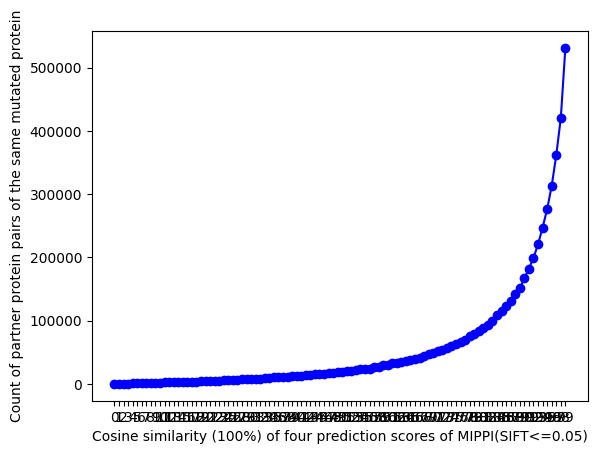

In [85]:
import json
with open('Cosine_Similarity_SIFT_lessthan_0.05.json', 'r') as fp:
    cs_data = json.load(fp)
print(cs_data)

import matplotlib.pyplot as plt
x = []
y = []
for key in cs_data.keys():
    x.append(key)
    y.append(cs_data[key])
plt.plot(x, y, 'o-', color = 'b')
plt.xlabel("Cosine similarity (100%) of four prediction scores of MIPPI(SIFT<=0.05)")
plt.ylabel("Count of partner protein pairs of the same mutated protein")
plt.show()

In [203]:
DDtable = df_plus[df_plus["PrimaryPhenotype"] == 'Developmental Delay (DD)']
from sklearn.metrics.pairwise import cosine_similarity
import json
type_list = ["no effect","increasing","disrupting","decreasing"]

cos_dis_list = []
cos_dis_dict = {}
# initial the Cosine Similarity dictionary
for i in range(11):
    if(i == 10):
        break
    #cos_dis_dict[str(round(float(i/10),1)) + " - " + str(round(float((i + 1)/10),1))] = 0
    cos_dis_dict[i] = 0

'''
new_matrix = pd.concat([df_plus[df_plus['AAChange.refGene'] == "DYNC1H1:NM_001376:exon61:c.A11465C:p.H3822P"]["score_class0"],
                        df_plus[df_plus['AAChange.refGene'] == "DYNC1H1:NM_001376:exon61:c.A11465C:p.H3822P"]["score_class1"]],axis=1).reset_index(drop=True).values
#new_matrix = np.array([[1,4,2,3],[5,2,30,6],[1,4,1,2]])
'''

# remove error value of SIFT score : '.'
new_df_plus = DDtable[~(DDtable['SIFT_score'] == '.')]
new_df_plus[['SIFT_score']] = new_df_plus[['SIFT_score']].astype(float)
new_df_plus = new_df_plus[~(new_df_plus['SIFT_score'] > 0.05)]
#print(new_df_plus)

for mutation in mutation_list: # for each mutated protein
    # four scores of MIPPI of all partner proteins
    score_table = pd.concat([new_df_plus[new_df_plus['AAChange.refGene'] == mutation]["score_class0"],
                             new_df_plus[new_df_plus['AAChange.refGene'] == mutation]["score_class1"],
                             new_df_plus[new_df_plus['AAChange.refGene'] == mutation]["score_class2"],
                             new_df_plus[new_df_plus['AAChange.refGene'] == mutation]["score_class3"]], axis=1).reset_index(drop=True).values
    # Calculate the Cosine Similarity between partner protein pairs (of the same mutated protein)
    #print(score_table.shape)
    try:
        s = np.triu(cosine_similarity(score_table))
        for i in s:
            for j in i:
                similarity = round(j,15) # float16
                if(similarity != 0 and similarity != 1): 
                    cos_dis_list.append(j)
                    if(int(similarity/0.1) == 10):
                        cos_dis_dict[9] += 1
                    else:
                        cos_dis_dict[int(similarity/0.1)] += 1
    except ValueError:
        continue

print(cos_dis_dict)
#print(len(cos_dis_list)) # 8135859, 8m46s

with open('DD_Cosine_Similarity_SIFT_lessthan_0.05.json', 'w') as fp:
    json.dump(cos_dis_dict, fp)

cos_dis = np.array(cos_dis_list)
np.save("DD_Cosine_Similarity_SIFT_lessthan_0.05.npy", cos_dis)

C:\Users\Administrator\AppData\Local\Temp\ipykernel_14144\1945819470.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df_plus[['SIFT_score']] = new_df_plus[['SIFT_score']].astype(float)


{0: 2207, 1: 8694, 2: 16793, 3: 27427, 4: 43918, 5: 66738, 6: 106799, 7: 175554, 8: 315822, 9: 786831}


{'0': 2207, '1': 8694, '2': 16793, '3': 27427, '4': 43918, '5': 66738, '6': 106799, '7': 175554, '8': 315822, '9': 786831}


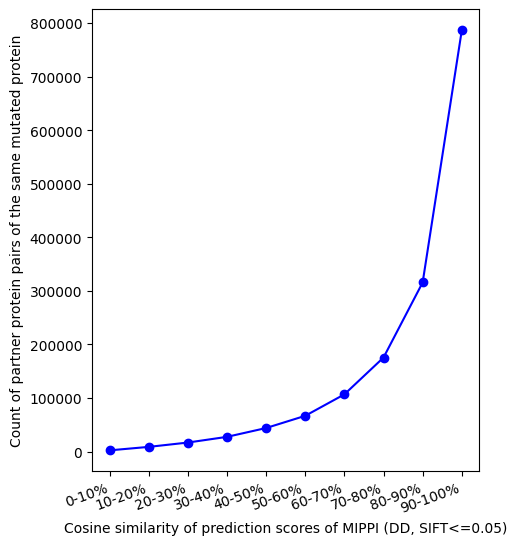

In [218]:
import json
with open('DD_Cosine_Similarity_SIFT_lessthan_0.05.json', 'r') as fp:
    cs_data = json.load(fp)
print(cs_data)

import matplotlib.pyplot as plt
x = []
y = []
for key in cs_data.keys():
    x.append(str(int(key)*10) + "-" + str((int(key)+1)*10) + "%")
    y.append(cs_data[key])
plt.figure(figsize=(5,6))
plt.plot(x, y, 'o-', color = 'b')
plt.xlabel("Cosine similarity of prediction scores of MIPPI (DD, SIFT<=0.05)")
plt.xticks(fontsize=10, rotation=20, ha='right')
plt.ylabel("Count of partner protein pairs of the same mutated protein")
plt.savefig('DD_CS_siftplot.png', dpi=300)
plt.show()



In [86]:
from sklearn.metrics.pairwise import cosine_similarity
import json
type_list = ["no effect","increasing","disrupting","decreasing"]
mutation_list = df_plus['AAChange.refGene'].unique().tolist()
print(len(mutation_list)) # 11937

cos_dis_list = []
cos_dis_dict = {}
# initial the Cosine Similarity dictionary
for i in range(101):
    if(i == 100):
        break
    #cos_dis_dict[str(round(float(i/10),1)) + " - " + str(round(float((i + 1)/10),1))] = 0
    cos_dis_dict[i] = 0

'''
new_matrix = pd.concat([df_plus[df_plus['AAChange.refGene'] == "DYNC1H1:NM_001376:exon61:c.A11465C:p.H3822P"]["score_class0"],
                        df_plus[df_plus['AAChange.refGene'] == "DYNC1H1:NM_001376:exon61:c.A11465C:p.H3822P"]["score_class1"]],axis=1).reset_index(drop=True).values
#new_matrix = np.array([[1,4,2,3],[5,2,30,6],[1,4,1,2]])
'''

# remove error value of SIFT score : '.'
new_df_plus = df_plus[~(df_plus['SIFT_score'] == '.')]
new_df_plus[['SIFT_score']] = new_df_plus[['SIFT_score']].astype(float)
new_df_plus = new_df_plus[~(new_df_plus['SIFT_score'] <= 0.05)]
#print(new_df_plus)

for mutation in mutation_list: # for each mutated protein
    # four scores of MIPPI of all partner proteins
    score_table = pd.concat([new_df_plus[new_df_plus['AAChange.refGene'] == mutation]["score_class0"],
                             new_df_plus[new_df_plus['AAChange.refGene'] == mutation]["score_class1"],
                             new_df_plus[new_df_plus['AAChange.refGene'] == mutation]["score_class2"],
                             new_df_plus[new_df_plus['AAChange.refGene'] == mutation]["score_class3"]], axis=1).reset_index(drop=True).values
    # Calculate the Cosine Similarity between partner protein pairs (of the same mutated protein)
    #print(score_table.shape)
    try:
        s = np.triu(cosine_similarity(score_table))
        for i in s:
            for j in i:
                similarity = round(j,15) # float16
                if(similarity != 0 and similarity != 1): 
                    cos_dis_list.append(j)
                    if(int(similarity/0.01) == 100):
                        cos_dis_dict[99] += 1
                    else:
                        cos_dis_dict[int(similarity/0.01)] += 1
    except ValueError:
        continue

print(cos_dis_dict)
#print(len(cos_dis_list)) # 8135859, 8m46s

with open('Cosine_Similarity_SIFT_morethan_0.05.json', 'w') as fp:
    json.dump(cos_dis_dict, fp)

cos_dis = np.array(cos_dis_list)
np.save("Cosine_Similarity_SIFT_morethan_0.05.npy", cos_dis)

11937


C:\Users\Administrator\AppData\Local\Temp\ipykernel_14144\4149611312.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df_plus[['SIFT_score']] = new_df_plus[['SIFT_score']].astype(float)


{0: 17, 1: 128, 2: 274, 3: 414, 4: 422, 5: 544, 6: 579, 7: 629, 8: 618, 9: 685, 10: 858, 11: 991, 12: 1010, 13: 1066, 14: 1203, 15: 1274, 16: 1394, 17: 1487, 18: 1405, 19: 1552, 20: 1638, 21: 1755, 22: 1839, 23: 1849, 24: 2051, 25: 2172, 26: 2255, 27: 2587, 28: 2554, 29: 2677, 30: 2857, 31: 3001, 32: 3388, 33: 3503, 34: 3535, 35: 3898, 36: 3982, 37: 3997, 38: 4146, 39: 4514, 40: 4899, 41: 4865, 42: 5125, 43: 5219, 44: 5570, 45: 5911, 46: 5947, 47: 6209, 48: 6782, 49: 6940, 50: 7188, 51: 7623, 52: 7933, 53: 8347, 54: 8647, 55: 9010, 56: 9333, 57: 9585, 58: 10382, 59: 10824, 60: 11532, 61: 11805, 62: 12284, 63: 12787, 64: 13915, 65: 14239, 66: 14680, 67: 15534, 68: 16428, 69: 16748, 70: 17714, 71: 18667, 72: 19577, 73: 20449, 74: 21528, 75: 22685, 76: 24097, 77: 25622, 78: 26555, 79: 28592, 80: 29868, 81: 31773, 82: 33918, 83: 36362, 84: 38332, 85: 40982, 86: 43848, 87: 47582, 88: 51214, 89: 55300, 90: 60296, 91: 66329, 92: 72945, 93: 81260, 94: 92256, 95: 105893, 96: 122342, 97: 145148,

In [87]:
import numpy as np
cos_dis = np.load("Cosine_Similarity_SIFT_morethan_0.05.npy")
print(np.mean(cos_dis))
print(np.median(cos_dis))

0.8493242160917461
0.9168702547359628


(5642927,)
(2201615,)
0.0
         D(less than 0.05)  T(more than 0.05)
0                 0.995649           0.937654
1                 0.852742           0.636864
2                 0.779039           0.951699
3                 0.889052           0.352056
4                 0.798413           0.982852
...                    ...                ...
5642922           0.977622                NaN
5642923           0.957541                NaN
5642924           0.964185                NaN
5642925           0.941179                NaN
5642926           0.995058                NaN

[5642927 rows x 2 columns]


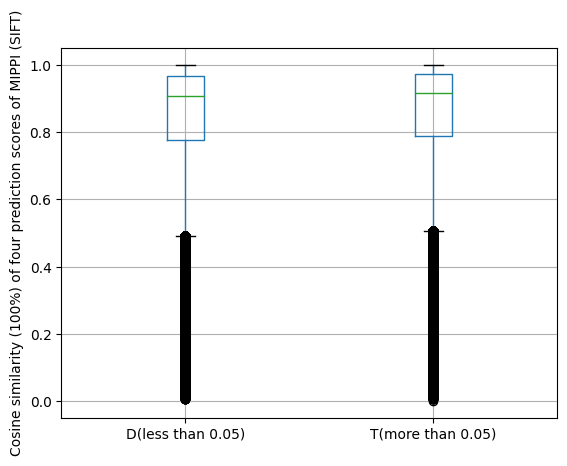

In [116]:
import pandas as pd
list_lessthan = np.load("Cosine_Similarity_SIFT_lessthan_0.05.npy") # less than 0.05
list_morethan = np.load("Cosine_Similarity_SIFT_morethan_0.05.npy") # more than 0.05
print(list_lessthan.shape)
print(list_morethan.shape)

from scipy import stats
from pprint import pprint
pprint(stats.mannwhitneyu(list_lessthan, list_morethan, use_continuity=False, alternative='two-sided')[1]) # P=0.0

import matplotlib.pyplot as plt
list_data = pd.DataFrame({"D(less than 0.05)": pd.Series(list_lessthan), "T(more than 0.05)": pd.Series(list_morethan)})
print(list_data)

list_data.boxplot()
plt.ylabel("Cosine similarity (100%) of four prediction scores of MIPPI (SIFT)")
plt.show()

In [111]:
df_plus

,Unnamed: 0.1,1000G_AFR,1000G_ALL,1000G_AMR,1000G_EAS,1000G_EUR,1000G_SAS,AAChange.refGene,Alt,CADD_phred,CADD_raw,CADD_raw_rankscore,CG46,COSMIC_DIS,COSMIC_ID,Chr,ClinVar_DB,ClinVar_DBID,ClinVar_DIS,ClinVar_ID,ClinVar_SIG,DANN_rankscore,DANN_score,DeepSea_Score,DisorderCategory,ESP6500si_AA,ESP6500si_ALL,ESP6500si_EA,Eigen-PC-raw,Eigen-raw,Eigen_coding_or_noncoding,End,EntrezID,ExAC_AFR,ExAC_AMR,ExAC_EAS,ExAC_FIN,ExAC_Freq,ExAC_NFE,ExAC_OTH,ExAC_SAS,ExonicFunc.refGene,FATHMM_converted_rankscore,FATHMM_pred,FATHMM_score,Func.refGene,GERP++_RS,GERP++_RS_rankscore,GTEx_V6_gene,GTEx_V6_tissue,GWAS_BETA,GWAS_DIS,GWAS_OR,GWAS_P,GWAS_PUBMED,GWAS_SNP,Gene.refGene,GeneDetail.refGene,GenoCanyon_score,GenoCanyon_score_rankscore,HI_Rank,Haploinsufficiency_Score,Interpro_domain,LRT_converted_rankscore,LRT_pred,LRT_score,M-CAP_pred,M-CAP_rankscore,M-CAP_score,MetaLR_pred,MetaLR_rankscore,MetaLR_score,MetaSVM_pred,MetaSVM_rankscore,MetaSVM_score,MutationAssessor_pred,MutationAssessor_score,MutationAssessor_score_rankscore,MutationTaster_converted_rankscore,MutationTaster_pred,MutationTaster_score,NCI60,NumControls,NumProbands,Official Symbol Interactor A,Official Symbol Interactor B,PROVEAN_converted_rankscore,PROVEAN_pred,PROVEAN_score,Polyphen2_HDIV_pred,Polyphen2_HDIV_rankscore,Polyphen2_HDIV_score,Polyphen2_HVAR_pred,Polyphen2_HVAR_rankscore,Polyphen2_HVAR_score,PrimaryPhenotype,PubmedID,Ref,SIFT_converted_rankscore,SIFT_pred,SIFT_score,SWISS-PROT Accessions Interactor A,SWISS-PROT Accessions Interactor B,SampleID,SequenceType,SiPhy_29way_logOdds,SiPhy_29way_logOdds_rankscore,Start,StudyName,Unnamed: 0,VEST3_rankscore,VEST3_score,Validation,Variant,cDNA_var,cytoBand,dbSNP,enh_chr,enh_end,enh_id,enh_start,enh_target_geneid,exon_id,fathmm-MKL_coding_pred,fathmm-MKL_coding_rankscore,fathmm-MKL_coding_score,gene_symbol,gnomAD_exome_AFR,gnomAD_exome_ALL,gnomAD_exome_AMR,gnomAD_exome_ASJ,gnomAD_exome_EAS,gnomAD_exome_FIN,gnomAD_exome_NFE,gnomAD_exome_OTH,gnomAD_exome_SAS,gnomAD_genome_AFR,gnomAD_genome_ALL,gnomAD_genome_AMR,gnomAD_genome_ASJ,gnomAD_genome_EAS,gnomAD_genome_FIN,gnomAD_genome_NFE,gnomAD_genome_OTH,integrated_confidence_value,integrated_fitCons_score,integrated_fitCons_score_rankscore,pep_len,phastCons100way_vertebrate,phastCons100way_vertebrate_rankscore,phastCons20way_mammalian,phastCons20way_mammalian_rankscore,phyloP100way_vertebrate,phyloP100way_vertebrate_rankscore,phyloP20way_mammalian,phyloP20way_mammalian_rankscore,pro_chr,pro_end,pro_gene_symbol,pro_id,pro_start,pro_target_geneid,protein_mut,protein_ori,protein_pos,protein_var,refseq_mrna,sex,source,var_abbr,uniprotAC,pred_class,score_class0,score_class1,score_class2,score_class3,pred_re_class,re_score_class0,re_score_class1,re_score_class2,re_score_class3
0,0,.,.,.,.,.,.,DYNC1H1:NM_001376:exon61:c.A11465C:p.H3822P,C,26.4,5.578,0.759,.,.,.,14,MedGen:OMIM,C3281202:614563,Mental_retardation\x2c_autosomal_dominant_13,RCV000022930.3,Pathogenic,0.432,0.986,0.0028925,psychiatric disorder,.,.,.,0.881,0.926,c,102505753,1778,.,.,.,.,.,.,.,.,nonsynonymous SNV,0.52,T,0.68,exonic,5.82,0.927,.,.,.,.,.,.,.,.,DYNC1H1,.,1.0,0.747,28.69%,0.285436253,.,0.843,D,0,D,0.864,0.195,T,0.726,0.365,T,0.783,-0.177,M,2.88,0.837,0.81,D,1,.,0,10,DYNC1H1,PAFAH1B1,0.969,D,-8.26,D,0.899,1,D,0.807,0.994,Intellectual disability (ID),21076407,A,0.721,D,0.002,Q14204,P43034,21076407_1,exome,16.173,0.816,102505753,Vissers 2010,0,0.992,0.988,validated,A>C,c.A11465C,14q32.31,rs387906739,14,102505975,GH14I102503,102503571,122416|23186|9895|51550|55778|106866981,exon61,D,0.977,0.996,DYNC1H1,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,0,0.707,0.73,4646.0,1.0,0.715,0.962,0.444,9.325,0.96,1.199,0.96,.,.,.,.,.,.,P,H,3822,p.H3822P,NM_001376,M,.,NM_001376_H3822P,P43034,0,0.546749,0.041238,0.406565,0.005448,2,0.363300,0.015069,0.534088,0.087543
1,1,.,.,.,.,.,.,DYNC1H1:NM_001376:exon61:c.A11465C:p.H3822P,C,26.4,5.578,0.759,.,.,.,14,MedGen:OMIM,C3281202:614563,Mental_retardation\x2c_autosomal_dominant_13,RCV000022930.3,Pathogenic,

CADD cos similarity

In [112]:
from sklearn.metrics.pairwise import cosine_similarity
import json
type_list = ["no effect","increasing","disrupting","decreasing"]
mutation_list = df_plus['AAChange.refGene'].unique().tolist()
print(len(mutation_list)) # 11937

cos_dis_list = []
cos_dis_dict = {}
# initial the Cosine Similarity dictionary
for i in range(101):
    if(i == 100):
        break
    #cos_dis_dict[str(round(float(i/10),1)) + " - " + str(round(float((i + 1)/10),1))] = 0
    cos_dis_dict[i] = 0

'''
new_matrix = pd.concat([df_plus[df_plus['AAChange.refGene'] == "DYNC1H1:NM_001376:exon61:c.A11465C:p.H3822P"]["score_class0"],
                        df_plus[df_plus['AAChange.refGene'] == "DYNC1H1:NM_001376:exon61:c.A11465C:p.H3822P"]["score_class1"]],axis=1).reset_index(drop=True).values
#new_matrix = np.array([[1,4,2,3],[5,2,30,6],[1,4,1,2]])
'''

# remove error value of SIFT score : '.'
new_df_plus = df_plus[~(df_plus['CADD_phred'] == '.')]
new_df_plus[['CADD_phred']] = new_df_plus[['CADD_phred']].astype(float)
new_df_plus = new_df_plus[~(new_df_plus['CADD_phred'] <= 20)]
#print(new_df_plus)

for mutation in mutation_list: # for each mutated protein
    # four scores of MIPPI of all partner proteins
    score_table = pd.concat([new_df_plus[new_df_plus['AAChange.refGene'] == mutation]["score_class0"],
                             new_df_plus[new_df_plus['AAChange.refGene'] == mutation]["score_class1"],
                             new_df_plus[new_df_plus['AAChange.refGene'] == mutation]["score_class2"],
                             new_df_plus[new_df_plus['AAChange.refGene'] == mutation]["score_class3"]], axis=1).reset_index(drop=True).values
    # Calculate the Cosine Similarity between partner protein pairs (of the same mutated protein)
    #print(score_table.shape)
    try:
        s = np.triu(cosine_similarity(score_table))
        for i in s:
            for j in i:
                similarity = round(j,15) # float16
                if(similarity != 0 and similarity != 1): 
                    cos_dis_list.append(j)
                    if(int(similarity/0.01) == 100):
                        cos_dis_dict[99] += 1
                    else:
                        cos_dis_dict[int(similarity/0.01)] += 1
    except ValueError:
        continue

print(cos_dis_dict)
#print(len(cos_dis_list)) # 8135859, 8m46s

with open('Cosine_Similarity_CADD_morethan_20.json', 'w') as fp:
    json.dump(cos_dis_dict, fp)

cos_dis = np.array(cos_dis_list)
np.save("Cosine_Similarity_CADD_morethan_20.npy", cos_dis)

11937


C:\Users\Administrator\AppData\Local\Temp\ipykernel_14144\2706752708.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df_plus[['CADD_phred']] = new_df_plus[['CADD_phred']].astype(float)


{0: 25, 1: 215, 2: 503, 3: 919, 4: 1199, 5: 1498, 6: 1550, 7: 1755, 8: 1839, 9: 2230, 10: 2430, 11: 3131, 12: 3265, 13: 3471, 14: 3477, 15: 3879, 16: 4138, 17: 4303, 18: 4462, 19: 4845, 20: 5298, 21: 5352, 22: 5918, 23: 6176, 24: 6890, 25: 6729, 26: 7479, 27: 8331, 28: 8977, 29: 8869, 30: 8915, 31: 9638, 32: 9720, 33: 10793, 34: 11440, 35: 12227, 36: 12386, 37: 13279, 38: 13380, 39: 14124, 40: 15055, 41: 15747, 42: 16270, 43: 16967, 44: 17848, 45: 18727, 46: 18646, 47: 20309, 48: 20701, 49: 22436, 50: 22467, 51: 24374, 52: 24888, 53: 26366, 54: 27659, 55: 28731, 56: 29050, 57: 31340, 58: 32448, 59: 34220, 60: 35814, 61: 37979, 62: 39205, 63: 41076, 64: 43583, 65: 45150, 66: 46539, 67: 48564, 68: 51470, 69: 54550, 70: 56796, 71: 60197, 72: 62646, 73: 65999, 74: 69665, 75: 73481, 76: 76691, 77: 80884, 78: 87370, 79: 91296, 80: 96946, 81: 102904, 82: 108393, 83: 116399, 84: 125176, 85: 133629, 86: 141661, 87: 152141, 88: 163685, 89: 174532, 90: 192610, 91: 209837, 92: 229952, 93: 253465, 

In [90]:
DDtable = df_plus[df_plus["PrimaryPhenotype"] == 'Developmental Delay (DD)'] # 52655
from sklearn.metrics.pairwise import cosine_similarity
import json
type_list = ["no effect","increasing","disrupting","decreasing"]
mutation_list = DDtable['AAChange.refGene'].unique().tolist()
print(len(mutation_list)) # 3051
#print(DDtable)

Controltable = df_plus[df_plus["PrimaryPhenotype"] == 'Sibling Control']
mutation_list = Controltable['AAChange.refGene'].unique().tolist()
print(len(mutation_list)) # 3051

cos_dis_list = []
cos_dis_dict = {}
# initial the Cosine Similarity dictionary
for i in range(11):
    if(i == 10):
        break
    #cos_dis_dict[str(round(float(i/10),1)) + " - " + str(round(float((i + 1)/10),1))] = 0
    cos_dis_dict[i] = 0

'''
new_matrix = pd.concat([df_plus[df_plus['AAChange.refGene'] == "DYNC1H1:NM_001376:exon61:c.A11465C:p.H3822P"]["score_class0"],
                        df_plus[df_plus['AAChange.refGene'] == "DYNC1H1:NM_001376:exon61:c.A11465C:p.H3822P"]["score_class1"]],axis=1).reset_index(drop=True).values
#new_matrix = np.array([[1,4,2,3],[5,2,30,6],[1,4,1,2]])
'''

# remove error value of SIFT score : '.'
new_df_plus = DDtable[~(DDtable['CADD_phred'] == '.')]
new_df_plus[['CADD_phred']] = new_df_plus[['CADD_phred']].astype(float)
new_df_plus = new_df_plus[~(new_df_plus['CADD_phred'] <= 30)] # 13237

new_df_plus = new_df_plus[~(new_df_plus['CADD_phred'] == 'T')] # 13237
# (D = probably damaging, P = possibly damaging, B = benign) 
new_df_plus = new_df_plus[~(new_df_plus['Polyphen2_HDIV_pred'] == 'B')] # 12972
#print(new_df_plus)

mutation_list = new_df_plus['AAChange.refGene'].unique().tolist()
print(len(mutation_list)) # 612
#print(new_df_plus)

per99 = 0
allsum = 0
for mutation in mutation_list: # for each mutated protein
    # four scores of MIPPI of all partner proteins
    sele_table = pd.concat([new_df_plus[new_df_plus['AAChange.refGene'] == mutation]["score_class0"],
                             new_df_plus[new_df_plus['AAChange.refGene'] == mutation]["score_class1"],
                             new_df_plus[new_df_plus['AAChange.refGene'] == mutation]["score_class2"],
                             new_df_plus[new_df_plus['AAChange.refGene'] == mutation]["score_class3"]], axis=1).reset_index(drop=True)
    score_table = sele_table.values               
    # Calculate the Cosine Similarity between partner protein pairs (of the same mutated protein)
    #print(score_table.shape)
    try:
        s = np.triu(cosine_similarity(score_table))
        idx = 0
        for i in s:
            idx += 1
            jdx = 0
            for j in i:
                jdx += 1
                similarity = round(j,15) # float16
                if(similarity != 0 and similarity != 1): 
                    allsum += 1
                    cos_dis_list.append(j)
                    if(int(similarity/0.1) == 10):
                        cos_dis_dict[9] += 1
                    else:
                        cos_dis_dict[int(similarity/0.1)] += 1

                    if(similarity < 0.5):
                        #print(mutation)
                        #print(sele_table)
                        #print(idx)
                        #print(jdx)
                        per99 += 1
                    
    except ValueError:
        continue

print(cos_dis_dict)
print(str(per99/allsum))
#print(len(cos_dis_list)) # 8135859, 8m46s

with open('DD_Cosine_Similarity_CADD_morethan_30.json', 'w') as fp:
    json.dump(cos_dis_dict, fp)

cos_dis = np.array(cos_dis_list)
np.save("DD_Cosine_Similarity_CADD_morethan_30.npy", cos_dis)

3051
1028


C:\Users\Administrator\AppData\Local\Temp\ipykernel_448\2491139672.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df_plus[['CADD_phred']] = new_df_plus[['CADD_phred']].astype(float)


612
{0: 427, 1: 1772, 2: 4395, 3: 7233, 4: 11810, 5: 17356, 6: 29493, 7: 47079, 8: 81323, 9: 188818}
0.06578548957419182


In [78]:
case_df = pd.concat([new_df_plus[new_df_plus['AAChange.refGene'] == 'HDAC3:NM_003883:exon3:c.G277A:p.D93N']['Gene.refGene'],
                    new_df_plus[new_df_plus['AAChange.refGene'] == 'HDAC3:NM_003883:exon3:c.G277A:p.D93N']['Official Symbol Interactor B'],
                    new_df_plus[new_df_plus['AAChange.refGene'] == 'HDAC3:NM_003883:exon3:c.G277A:p.D93N']['pred_class']
                    ], axis=1).reset_index(drop=True)
print(case_df)

    Gene.refGene Official Symbol Interactor B  pred_class
0          HDAC3                      ANKRD11           3
1          HDAC3                        NCOR1           3
2          HDAC3                       ZBTB33           0
3          HDAC3                        NCOR2           3
4          HDAC3                         TAB2           3
..           ...                          ...         ...
105        HDAC3                      CSNK2A2           3
106        HDAC3                         AKT1           3
107        HDAC3                        TRAF6           1
108        HDAC3                         MDM2           3
109        HDAC3                          ELL           3

[110 rows x 3 columns]


{'0': 427, '1': 1772, '2': 4395, '3': 7233, '4': 11810, '5': 17356, '6': 29493, '7': 47079, '8': 81323, '9': 188818}


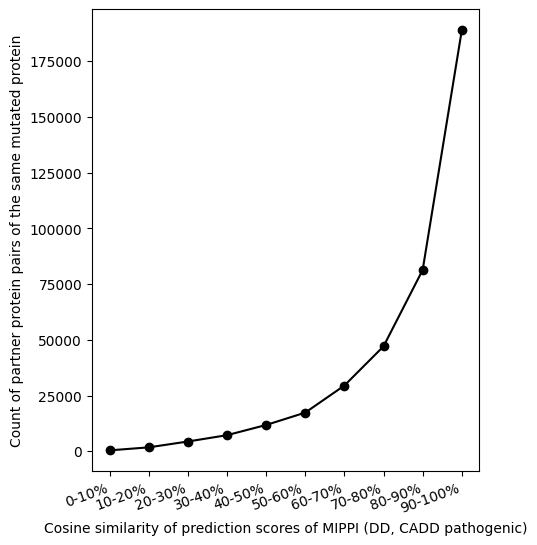

In [91]:
import json
with open('DD_Cosine_Similarity_CADD_morethan_30.json', 'r') as fp:
    cs_data = json.load(fp)
print(cs_data)

import matplotlib.pyplot as plt
x = []
y = []
for key in cs_data.keys():
    x.append(str(int(key)*10) + "-" + str((int(key)+1)*10) + "%")
    y.append(cs_data[key])
plt.figure(figsize=(5,6))
plt.plot(x, y, 'o-', color = '#000000')
plt.xlabel("Cosine similarity of prediction scores of MIPPI (DD, CADD pathogenic)")
plt.xticks(fontsize=10, rotation=20, ha='right')
plt.ylabel("Count of partner protein pairs of the same mutated protein")
plt.savefig('DD_CS_caddplot.png', dpi=300)
plt.show()

In [32]:
count_dict = {'0': 427, '1': 1781, '2': 4417, '3': 7288, '4': 11934, '5': 17649, '6': 29946, '7': 47829, '8': 82659, '9': 192674}
sum_ = 0
for key in count_dict.keys():
    sum_ += count_dict[key]
sum_

396604

In [113]:
from sklearn.metrics.pairwise import cosine_similarity
import json
type_list = ["no effect","increasing","disrupting","decreasing"]
mutation_list = df_plus['AAChange.refGene'].unique().tolist()
print(len(mutation_list)) # 11937

cos_dis_list = []
cos_dis_dict = {}
# initial the Cosine Similarity dictionary
for i in range(101):
    if(i == 100):
        break
    #cos_dis_dict[str(round(float(i/10),1)) + " - " + str(round(float((i + 1)/10),1))] = 0
    cos_dis_dict[i] = 0

'''
new_matrix = pd.concat([df_plus[df_plus['AAChange.refGene'] == "DYNC1H1:NM_001376:exon61:c.A11465C:p.H3822P"]["score_class0"],
                        df_plus[df_plus['AAChange.refGene'] == "DYNC1H1:NM_001376:exon61:c.A11465C:p.H3822P"]["score_class1"]],axis=1).reset_index(drop=True).values
#new_matrix = np.array([[1,4,2,3],[5,2,30,6],[1,4,1,2]])
'''

# remove error value of SIFT score : '.'
new_df_plus = df_plus[~(df_plus['CADD_phred'] == '.')]
new_df_plus[['CADD_phred']] = new_df_plus[['CADD_phred']].astype(float)
new_df_plus = new_df_plus[~(new_df_plus['CADD_phred'] > 20)]
#print(new_df_plus)

for mutation in mutation_list: # for each mutated protein
    # four scores of MIPPI of all partner proteins
    score_table = pd.concat([new_df_plus[new_df_plus['AAChange.refGene'] == mutation]["score_class0"],
                             new_df_plus[new_df_plus['AAChange.refGene'] == mutation]["score_class1"],
                             new_df_plus[new_df_plus['AAChange.refGene'] == mutation]["score_class2"],
                             new_df_plus[new_df_plus['AAChange.refGene'] == mutation]["score_class3"]], axis=1).reset_index(drop=True).values
    # Calculate the Cosine Similarity between partner protein pairs (of the same mutated protein)
    #print(score_table.shape)
    try:
        s = np.triu(cosine_similarity(score_table))
        for i in s:
            for j in i:
                similarity = round(j,15) # float16
                if(similarity != 0 and similarity != 1): 
                    cos_dis_list.append(j)
                    if(int(similarity/0.01) == 100):
                        cos_dis_dict[99] += 1
                    else:
                        cos_dis_dict[int(similarity/0.01)] += 1
    except ValueError:
        continue

print(cos_dis_dict)
#print(len(cos_dis_list)) # 8135859, 8m46s

with open('Cosine_Similarity_CADD_lessthan_20.json', 'w') as fp:
    json.dump(cos_dis_dict, fp)

cos_dis = np.array(cos_dis_list)
np.save("Cosine_Similarity_CADD_lessthan_20.npy", cos_dis)

11937


C:\Users\Administrator\AppData\Local\Temp\ipykernel_14144\2194874935.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df_plus[['CADD_phred']] = new_df_plus[['CADD_phred']].astype(float)


{0: 11, 1: 79, 2: 123, 3: 167, 4: 173, 5: 258, 6: 278, 7: 358, 8: 332, 9: 371, 10: 465, 11: 488, 12: 527, 13: 496, 14: 640, 15: 660, 16: 724, 17: 827, 18: 753, 19: 805, 20: 941, 21: 1010, 22: 998, 23: 1007, 24: 1123, 25: 1255, 26: 1235, 27: 1427, 28: 1361, 29: 1550, 30: 1603, 31: 1746, 32: 1920, 33: 2073, 34: 2074, 35: 2336, 36: 2257, 37: 2360, 38: 2522, 39: 2675, 40: 2987, 41: 2947, 42: 3031, 43: 3061, 44: 3433, 45: 3469, 46: 3830, 47: 3955, 48: 4261, 49: 4426, 50: 4425, 51: 4881, 52: 4963, 53: 5182, 54: 5455, 55: 5608, 56: 5817, 57: 6318, 58: 6544, 59: 7198, 60: 7409, 61: 7849, 62: 7914, 63: 8458, 64: 9001, 65: 9470, 66: 9918, 67: 10066, 68: 10999, 69: 11251, 70: 11598, 71: 12555, 72: 12741, 73: 13661, 74: 14204, 75: 14742, 76: 16178, 77: 17128, 78: 18023, 79: 19375, 80: 20514, 81: 22234, 82: 23345, 83: 24841, 84: 26725, 85: 28597, 86: 30913, 87: 33290, 88: 36352, 89: 39539, 90: 42890, 91: 48258, 92: 52746, 93: 59374, 94: 68149, 95: 78738, 96: 92850, 97: 114182, 98: 145874, 99: 23821

In [114]:
import numpy as np
cos_dis = np.load("Cosine_Similarity_CADD_lessthan_20.npy")
print(np.mean(cos_dis))
print(np.median(cos_dis))

cos_dis = np.load("Cosine_Similarity_CADD_morethan_20.npy")
print(np.mean(cos_dis))
print(np.median(cos_dis))

0.8645994320921101
0.9292155541846792
0.8392872860978579
0.9043408861605703


(1603964,)
(6529271,)
0.0
         D(more than 20)  T(less than 20)
0               0.995649         0.886788
1               0.852742         0.812944
2               0.779039         0.693880
3               0.889052         0.877577
4               0.798413         0.764436
...                  ...              ...
6529266         0.979333              NaN
6529267         0.970563              NaN
6529268         0.934978              NaN
6529269         0.809943              NaN
6529270         0.924916              NaN

[6529271 rows x 2 columns]


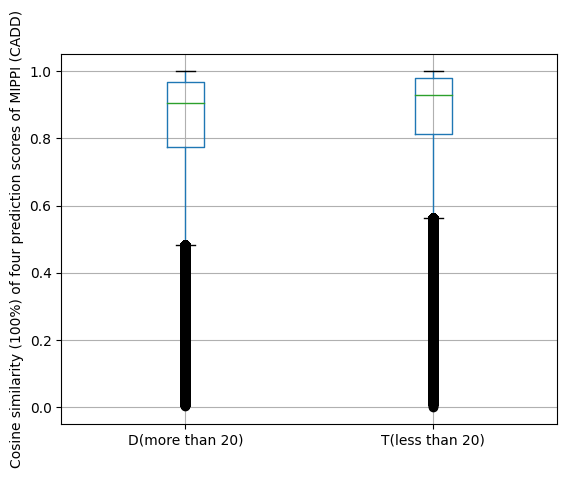

In [115]:
import pandas as pd
list_lessthan = np.load("Cosine_Similarity_CADD_lessthan_20.npy") # less than 20
list_morethan = np.load("Cosine_Similarity_CADD_morethan_20.npy") # more than 20
print(list_lessthan.shape)
print(list_morethan.shape)

from scipy import stats
from pprint import pprint
pprint(stats.mannwhitneyu(list_lessthan, list_morethan, use_continuity=False, alternative='two-sided')[1]) # P=0.0

import matplotlib.pyplot as plt
list_data = pd.DataFrame({"D(more than 20)": pd.Series(list_morethan), "T(less than 20)": pd.Series(list_lessthan)})
print(list_data)

list_data.boxplot()
plt.ylabel("Cosine similarity (100%) of four prediction scores of MIPPI (CADD)")
plt.show()

"effect" and "no effect", add the prediction scores

In [147]:
from sklearn.metrics.pairwise import cosine_similarity
import json
type_list = ["no effect","increasing","disrupting","decreasing"]
mutation_list = df_plus['AAChange.refGene'].unique().tolist()
print(len(mutation_list)) # 11937

cos_dis_list = []
cos_dis_dict = {}
# initial the Cosine Similarity dictionary
for i in range(101):
    if(i == 100):
        break
    #cos_dis_dict[str(round(float(i/10),1)) + " - " + str(round(float((i + 1)/10),1))] = 0
    cos_dis_dict[i] = 0

'''
effect_matrix = pd.concat([df_plus[df_plus['AAChange.refGene'] == "DYNC1H1:NM_001376:exon61:c.A11465C:p.H3822P"]["score_class0"],
                        df_plus[df_plus['AAChange.refGene'] == "DYNC1H1:NM_001376:exon61:c.A11465C:p.H3822P"]["score_class1"], # effect
                        df_plus[df_plus['AAChange.refGene'] == "DYNC1H1:NM_001376:exon61:c.A11465C:p.H3822P"]["score_class3"]],axis=1).reset_index(drop=True).values
no_effect_matrix = df_plus[df_plus['AAChange.refGene'] == "DYNC1H1:NM_001376:exon61:c.A11465C:p.H3822P"]["score_class2"].reset_index(drop=True).values
add_effect = effect_matrix.sum(axis=1)
no_effect_matrix = no_effect_matrix.reshape(no_effect_matrix.shape[0], 1)
add_effect = add_effect.reshape(add_effect.shape[0], 1)
new_matrix = np.concatenate([no_effect_matrix, add_effect], axis=1)
print(new_matrix.shape)
'''

# remove error value of SIFT score : '.'
new_df_plus = df_plus[~(df_plus['SIFT_score'] == '.')]
new_df_plus[['SIFT_score']] = new_df_plus[['SIFT_score']].astype(float)
new_df_plus = new_df_plus[~(new_df_plus['SIFT_score'] <= 0.05)]
#print(new_df_plus)

for mutation in mutation_list: # for each mutated protein
    # four scores of MIPPI of all partner proteins
    effect_matrix= pd.concat([new_df_plus[new_df_plus['AAChange.refGene'] == mutation]["score_class0"],
                             new_df_plus[new_df_plus['AAChange.refGene'] == mutation]["score_class1"],
                             new_df_plus[new_df_plus['AAChange.refGene'] == mutation]["score_class3"]], axis=1).reset_index(drop=True).values
    no_effect_matrix = df_plus[df_plus['AAChange.refGene'] == mutation]["score_class2"].reset_index(drop=True).values 
    add_effect = effect_matrix.sum(axis=1)
    no_effect_matrix = no_effect_matrix.reshape(no_effect_matrix.shape[0], 1)
    add_effect = add_effect.reshape(add_effect.shape[0], 1)
    try:
        new_matrix = np.concatenate([no_effect_matrix, add_effect], axis=1)              
    
        # Calculate the Cosine Similarity between partner protein pairs (of the same mutated protein)    
        s = np.triu(cosine_similarity(new_matrix))
        for i in s:
            for j in i:
                similarity = round(j,15) # float16
                if(similarity != 0 and similarity != 1): 
                    cos_dis_list.append(j)
                    if(int(similarity/0.01) == 100):
                        cos_dis_dict[99] += 1
                    else:
                        cos_dis_dict[int(similarity/0.01)] += 1
    except ValueError:
        continue

print(cos_dis_dict)
#print(len(cos_dis_list)) # 8135859, 8m46s

with open('Cosine_Similarity_SIFT_morethan_0.05_effectsplit.json', 'w') as fp:
    json.dump(cos_dis_dict, fp)

cos_dis = np.array(cos_dis_list)
np.save("Cosine_Similarity_SIFT_morethan_0.05_effectsplit.npy", cos_dis)



11937


C:\Users\Administrator\AppData\Local\Temp\ipykernel_14144\4281827044.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df_plus[['SIFT_score']] = new_df_plus[['SIFT_score']].astype(float)


{0: 0, 1: 0, 2: 12, 3: 13, 4: 42, 5: 57, 6: 67, 7: 100, 8: 106, 9: 100, 10: 99, 11: 175, 12: 211, 13: 230, 14: 259, 15: 281, 16: 381, 17: 448, 18: 570, 19: 597, 20: 589, 21: 708, 22: 792, 23: 790, 24: 906, 25: 1058, 26: 1133, 27: 1181, 28: 1307, 29: 1505, 30: 1477, 31: 1559, 32: 1776, 33: 1877, 34: 2084, 35: 2269, 36: 2312, 37: 2377, 38: 2580, 39: 2700, 40: 2902, 41: 3117, 42: 3225, 43: 3317, 44: 3516, 45: 3704, 46: 3750, 47: 4146, 48: 4283, 49: 4471, 50: 4966, 51: 5100, 52: 5291, 53: 5353, 54: 5799, 55: 5981, 56: 6349, 57: 6701, 58: 7073, 59: 7277, 60: 7641, 61: 8135, 62: 8532, 63: 9056, 64: 9234, 65: 10004, 66: 10217, 67: 10605, 68: 11353, 69: 12082, 70: 12707, 71: 13267, 72: 13950, 73: 14537, 74: 15222, 75: 16355, 76: 17351, 77: 18205, 78: 19416, 79: 20666, 80: 21920, 81: 23210, 82: 24869, 83: 26110, 84: 28786, 85: 30659, 86: 33349, 87: 36098, 88: 39210, 89: 42527, 90: 47287, 91: 52418, 92: 59503, 93: 66685, 94: 77614, 95: 91345, 96: 111739, 97: 145629, 98: 209928, 99: 643139}


In [148]:
from sklearn.metrics.pairwise import cosine_similarity
import json
type_list = ["no effect","increasing","disrupting","decreasing"]
mutation_list = df_plus['AAChange.refGene'].unique().tolist()
print(len(mutation_list)) # 11937

cos_dis_list = []
cos_dis_dict = {}
# initial the Cosine Similarity dictionary
for i in range(101):
    if(i == 100):
        break
    #cos_dis_dict[str(round(float(i/10),1)) + " - " + str(round(float((i + 1)/10),1))] = 0
    cos_dis_dict[i] = 0

'''
effect_matrix = pd.concat([df_plus[df_plus['AAChange.refGene'] == "DYNC1H1:NM_001376:exon61:c.A11465C:p.H3822P"]["score_class0"],
                        df_plus[df_plus['AAChange.refGene'] == "DYNC1H1:NM_001376:exon61:c.A11465C:p.H3822P"]["score_class1"], # effect
                        df_plus[df_plus['AAChange.refGene'] == "DYNC1H1:NM_001376:exon61:c.A11465C:p.H3822P"]["score_class3"]],axis=1).reset_index(drop=True).values
no_effect_matrix = df_plus[df_plus['AAChange.refGene'] == "DYNC1H1:NM_001376:exon61:c.A11465C:p.H3822P"]["score_class2"].reset_index(drop=True).values
add_effect = effect_matrix.sum(axis=1)
no_effect_matrix = no_effect_matrix.reshape(no_effect_matrix.shape[0], 1)
add_effect = add_effect.reshape(add_effect.shape[0], 1)
new_matrix = np.concatenate([no_effect_matrix, add_effect], axis=1)
print(new_matrix.shape)
'''

# remove error value of SIFT score : '.'
new_df_plus = df_plus[~(df_plus['SIFT_score'] == '.')]
new_df_plus[['SIFT_score']] = new_df_plus[['SIFT_score']].astype(float)
new_df_plus = new_df_plus[~(new_df_plus['SIFT_score'] > 0.05)]
#print(new_df_plus)

for mutation in mutation_list: # for each mutated protein
    # four scores of MIPPI of all partner proteins
    effect_matrix= pd.concat([new_df_plus[new_df_plus['AAChange.refGene'] == mutation]["score_class0"],
                             new_df_plus[new_df_plus['AAChange.refGene'] == mutation]["score_class1"],
                             new_df_plus[new_df_plus['AAChange.refGene'] == mutation]["score_class3"]], axis=1).reset_index(drop=True).values
    no_effect_matrix = df_plus[df_plus['AAChange.refGene'] == mutation]["score_class2"].reset_index(drop=True).values 
    add_effect = effect_matrix.sum(axis=1)
    no_effect_matrix = no_effect_matrix.reshape(no_effect_matrix.shape[0], 1)
    add_effect = add_effect.reshape(add_effect.shape[0], 1)
    try:
        new_matrix = np.concatenate([no_effect_matrix, add_effect], axis=1)              
    
        # Calculate the Cosine Similarity between partner protein pairs (of the same mutated protein)    
        s = np.triu(cosine_similarity(new_matrix))
        for i in s:
            for j in i:
                similarity = round(j,15) # float16
                if(similarity != 0 and similarity != 1): 
                    cos_dis_list.append(j)
                    if(int(similarity/0.01) == 100):
                        cos_dis_dict[99] += 1
                    else:
                        cos_dis_dict[int(similarity/0.01)] += 1
    except ValueError:
        continue

print(cos_dis_dict)
#print(len(cos_dis_list)) # 8135859, 8m46s

with open('Cosine_Similarity_SIFT_lessthan_0.05_effectsplit.json', 'w') as fp:
    json.dump(cos_dis_dict, fp)

cos_dis = np.array(cos_dis_list)
np.save("Cosine_Similarity_SIFT_lessthan_0.05_effectsplit.npy", cos_dis)

11937


C:\Users\Administrator\AppData\Local\Temp\ipykernel_14144\2865383217.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df_plus[['SIFT_score']] = new_df_plus[['SIFT_score']].astype(float)


{0: 0, 1: 0, 2: 1, 3: 0, 4: 7, 5: 16, 6: 49, 7: 17, 8: 68, 9: 136, 10: 269, 11: 210, 12: 348, 13: 406, 14: 380, 15: 494, 16: 473, 17: 580, 18: 724, 19: 704, 20: 760, 21: 1091, 22: 1295, 23: 1280, 24: 1671, 25: 1802, 26: 1581, 27: 1912, 28: 2333, 29: 2549, 30: 2534, 31: 2936, 32: 2854, 33: 3001, 34: 3546, 35: 3731, 36: 3781, 37: 4043, 38: 4356, 39: 4968, 40: 4917, 41: 5508, 42: 5761, 43: 6267, 44: 7344, 45: 6560, 46: 7687, 47: 7991, 48: 8416, 49: 8635, 50: 8906, 51: 10182, 52: 10075, 53: 10716, 54: 11553, 55: 12758, 56: 12977, 57: 13841, 58: 14531, 59: 14897, 60: 16421, 61: 17408, 62: 18768, 63: 19498, 64: 20440, 65: 22694, 66: 24160, 67: 24657, 68: 25748, 69: 27095, 70: 30046, 71: 29966, 72: 32835, 73: 34619, 74: 36116, 75: 39511, 76: 40960, 77: 43396, 78: 47687, 79: 49397, 80: 53593, 81: 58349, 82: 61433, 83: 66605, 84: 71140, 85: 76172, 86: 83934, 87: 91493, 88: 99776, 89: 110204, 90: 123121, 91: 134807, 92: 149621, 93: 175044, 94: 202674, 95: 242078, 96: 297245, 97: 387803, 98: 5656

In [149]:
import numpy as np
cos_dis = np.load("Cosine_Similarity_SIFT_lessthan_0.05_effectsplit.npy")
print(np.mean(cos_dis))
print(np.median(cos_dis))

cos_dis = np.load("Cosine_Similarity_SIFT_morethan_0.05_effectsplit.npy")
print(np.mean(cos_dis))
print(np.median(cos_dis))

0.9093309067937915
0.9660950337600569
0.8970590847186051
0.9609666081932872


(5642920,)
(2201609,)
0.0
         D(less than 0.05)  T(more than 0.05)
0                 0.994016           0.974926
1                 0.910275           0.717047
2                 0.758202           0.986775
3                 0.999394           0.543960
4                 0.916224           0.998104
...                    ...                ...
5642915           0.986760                NaN
5642916           0.977502                NaN
5642917           0.978704                NaN
5642918           0.967319                NaN
5642919           0.998769                NaN

[5642920 rows x 2 columns]


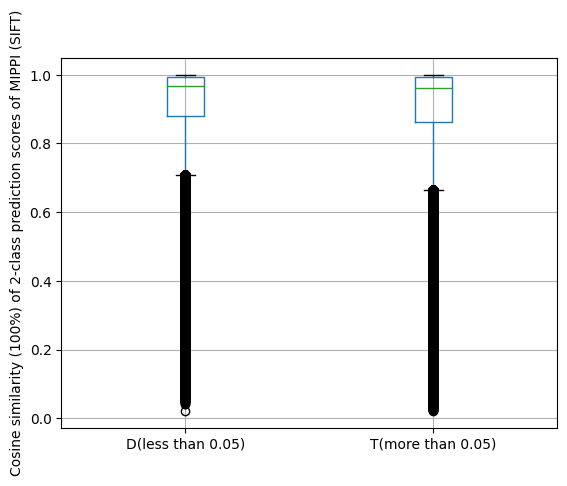

In [150]:
import pandas as pd
list_lessthan = np.load("Cosine_Similarity_SIFT_lessthan_0.05_effectsplit.npy") # less than 20
list_morethan = np.load("Cosine_Similarity_SIFT_morethan_0.05_effectsplit.npy") # more than 20
print(list_lessthan.shape)
print(list_morethan.shape)

from scipy import stats
from pprint import pprint
pprint(stats.mannwhitneyu(list_lessthan, list_morethan, use_continuity=False, alternative='two-sided')[1]) # P=0.0

import matplotlib.pyplot as plt
list_data = pd.DataFrame({"D(less than 0.05)": pd.Series(list_lessthan), "T(more than 0.05)": pd.Series(list_morethan)})
print(list_data)

list_data.boxplot()
plt.ylabel("Cosine similarity (100%) of 2-class prediction scores of MIPPI (SIFT)")
plt.show()

In [151]:
df_plus

,Unnamed: 0.1,1000G_AFR,1000G_ALL,1000G_AMR,1000G_EAS,1000G_EUR,1000G_SAS,AAChange.refGene,Alt,CADD_phred,CADD_raw,CADD_raw_rankscore,CG46,COSMIC_DIS,COSMIC_ID,Chr,ClinVar_DB,ClinVar_DBID,ClinVar_DIS,ClinVar_ID,ClinVar_SIG,DANN_rankscore,DANN_score,DeepSea_Score,DisorderCategory,ESP6500si_AA,ESP6500si_ALL,ESP6500si_EA,Eigen-PC-raw,Eigen-raw,Eigen_coding_or_noncoding,End,EntrezID,ExAC_AFR,ExAC_AMR,ExAC_EAS,ExAC_FIN,ExAC_Freq,ExAC_NFE,ExAC_OTH,ExAC_SAS,ExonicFunc.refGene,FATHMM_converted_rankscore,FATHMM_pred,FATHMM_score,Func.refGene,GERP++_RS,GERP++_RS_rankscore,GTEx_V6_gene,GTEx_V6_tissue,GWAS_BETA,GWAS_DIS,GWAS_OR,GWAS_P,GWAS_PUBMED,GWAS_SNP,Gene.refGene,GeneDetail.refGene,GenoCanyon_score,GenoCanyon_score_rankscore,HI_Rank,Haploinsufficiency_Score,Interpro_domain,LRT_converted_rankscore,LRT_pred,LRT_score,M-CAP_pred,M-CAP_rankscore,M-CAP_score,MetaLR_pred,MetaLR_rankscore,MetaLR_score,MetaSVM_pred,MetaSVM_rankscore,MetaSVM_score,MutationAssessor_pred,MutationAssessor_score,MutationAssessor_score_rankscore,MutationTaster_converted_rankscore,MutationTaster_pred,MutationTaster_score,NCI60,NumControls,NumProbands,Official Symbol Interactor A,Official Symbol Interactor B,PROVEAN_converted_rankscore,PROVEAN_pred,PROVEAN_score,Polyphen2_HDIV_pred,Polyphen2_HDIV_rankscore,Polyphen2_HDIV_score,Polyphen2_HVAR_pred,Polyphen2_HVAR_rankscore,Polyphen2_HVAR_score,PrimaryPhenotype,PubmedID,Ref,SIFT_converted_rankscore,SIFT_pred,SIFT_score,SWISS-PROT Accessions Interactor A,SWISS-PROT Accessions Interactor B,SampleID,SequenceType,SiPhy_29way_logOdds,SiPhy_29way_logOdds_rankscore,Start,StudyName,Unnamed: 0,VEST3_rankscore,VEST3_score,Validation,Variant,cDNA_var,cytoBand,dbSNP,enh_chr,enh_end,enh_id,enh_start,enh_target_geneid,exon_id,fathmm-MKL_coding_pred,fathmm-MKL_coding_rankscore,fathmm-MKL_coding_score,gene_symbol,gnomAD_exome_AFR,gnomAD_exome_ALL,gnomAD_exome_AMR,gnomAD_exome_ASJ,gnomAD_exome_EAS,gnomAD_exome_FIN,gnomAD_exome_NFE,gnomAD_exome_OTH,gnomAD_exome_SAS,gnomAD_genome_AFR,gnomAD_genome_ALL,gnomAD_genome_AMR,gnomAD_genome_ASJ,gnomAD_genome_EAS,gnomAD_genome_FIN,gnomAD_genome_NFE,gnomAD_genome_OTH,integrated_confidence_value,integrated_fitCons_score,integrated_fitCons_score_rankscore,pep_len,phastCons100way_vertebrate,phastCons100way_vertebrate_rankscore,phastCons20way_mammalian,phastCons20way_mammalian_rankscore,phyloP100way_vertebrate,phyloP100way_vertebrate_rankscore,phyloP20way_mammalian,phyloP20way_mammalian_rankscore,pro_chr,pro_end,pro_gene_symbol,pro_id,pro_start,pro_target_geneid,protein_mut,protein_ori,protein_pos,protein_var,refseq_mrna,sex,source,var_abbr,uniprotAC,pred_class,score_class0,score_class1,score_class2,score_class3,pred_re_class,re_score_class0,re_score_class1,re_score_class2,re_score_class3
0,0,.,.,.,.,.,.,DYNC1H1:NM_001376:exon61:c.A11465C:p.H3822P,C,26.4,5.578,0.759,.,.,.,14,MedGen:OMIM,C3281202:614563,Mental_retardation\x2c_autosomal_dominant_13,RCV000022930.3,Pathogenic,0.432,0.986,0.0028925,psychiatric disorder,.,.,.,0.881,0.926,c,102505753,1778,.,.,.,.,.,.,.,.,nonsynonymous SNV,0.52,T,0.68,exonic,5.82,0.927,.,.,.,.,.,.,.,.,DYNC1H1,.,1.0,0.747,28.69%,0.285436253,.,0.843,D,0,D,0.864,0.195,T,0.726,0.365,T,0.783,-0.177,M,2.88,0.837,0.81,D,1,.,0,10,DYNC1H1,PAFAH1B1,0.969,D,-8.26,D,0.899,1,D,0.807,0.994,Intellectual disability (ID),21076407,A,0.721,D,0.002,Q14204,P43034,21076407_1,exome,16.173,0.816,102505753,Vissers 2010,0,0.992,0.988,validated,A>C,c.A11465C,14q32.31,rs387906739,14,102505975,GH14I102503,102503571,122416|23186|9895|51550|55778|106866981,exon61,D,0.977,0.996,DYNC1H1,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,0,0.707,0.73,4646.0,1.0,0.715,0.962,0.444,9.325,0.96,1.199,0.96,.,.,.,.,.,.,P,H,3822,p.H3822P,NM_001376,M,.,NM_001376_H3822P,P43034,0,0.546749,0.041238,0.406565,0.005448,2,0.363300,0.015069,0.534088,0.087543
1,1,.,.,.,.,.,.,DYNC1H1:NM_001376:exon61:c.A11465C:p.H3822P,C,26.4,5.578,0.759,.,.,.,14,MedGen:OMIM,C3281202:614563,Mental_retardation\x2c_autosomal_dominant_13,RCV000022930.3,Pathogenic,

In [154]:
master_table

,Unnamed: 0,EntrezID,cytoBand,Chr,Start,End,Ref,Alt,Variant,Gene.refGene,Func.refGene,ExonicFunc.refGene,SampleID,StudyName,PubmedID,NumProbands,NumControls,SequenceType,PrimaryPhenotype,DisorderCategory,Validation,sex,source,GeneDetail.refGene,AAChange.refGene,1000G_ALL,1000G_AFR,1000G_AMR,1000G_EAS,1000G_EUR,1000G_SAS,ExAC_Freq,ExAC_AFR,ExAC_AMR,ExAC_EAS,ExAC_FIN,ExAC_NFE,ExAC_OTH,ExAC_SAS,ESP6500si_ALL,ESP6500si_AA,ESP6500si_EA,CG46,NCI60,dbSNP,COSMIC_ID,COSMIC_DIS,ClinVar_SIG,ClinVar_DIS,ClinVar_ID,ClinVar_DB,ClinVar_DBID,GWAS_DIS,GWAS_OR,GWAS_BETA,GWAS_PUBMED,GWAS_SNP,GWAS_P,SIFT_score,SIFT_converted_rankscore,SIFT_pred,Polyphen2_HDIV_score,Polyphen2_HDIV_rankscore,Polyphen2_HDIV_pred,Polyphen2_HVAR_score,Polyphen2_HVAR_rankscore,Polyphen2_HVAR_pred,LRT_score,LRT_converted_rankscore,LRT_pred,MutationTaster_score,MutationTaster_converted_rankscore,MutationTaster_pred,MutationAssessor_score,MutationAssessor_score_rankscore,MutationAssessor_pred,FATHMM_score,FATHMM_converted_rankscore,FATHMM_pred,PROVEAN_score,PROVEAN_converted_rankscore,PROVEAN_pred,VEST3_score,VEST3_rankscore,MetaSVM_score,MetaSVM_rankscore,MetaSVM_pred,MetaLR_score,MetaLR_rankscore,MetaLR_pred,M-CAP_score,M-CAP_rankscore,M-CAP_pred,CADD_raw,CADD_raw_rankscore,CADD_phred,DANN_score,DANN_rankscore,fathmm-MKL_coding_score,fathmm-MKL_coding_rankscore,fathmm-MKL_coding_pred,Eigen_coding_or_noncoding,Eigen-raw,Eigen-PC-raw,GenoCanyon_score,GenoCanyon_score_rankscore,integrated_fitCons_score,integrated_fitCons_score_rankscore,integrated_confidence_value,GERP++_RS,GERP++_RS_rankscore,phyloP100way_vertebrate,phyloP100way_vertebrate_rankscore,phyloP20way_mammalian,phyloP20way_mammalian_rankscore,phastCons100way_vertebrate,phastCons100way_vertebrate_rankscore,phastCons20way_mammalian,phastCons20way_mammalian_rankscore,SiPhy_29way_logOdds,SiPhy_29way_logOdds_rankscore,Interpro_domain,GTEx_V6_gene,GTEx_V6_tissue,gnomAD_exome_ALL,gnomAD_exome_AFR,gnomAD_exome_AMR,gnomAD_exome_ASJ,gnomAD_exome_EAS,gnomAD_exome_FIN,gnomAD_exome_NFE,gnomAD_exome_OTH,gnomAD_exome_SAS,gnomAD_genome_ALL,gnomAD_genome_AFR,gnomAD_genome_AMR,gnomAD_genome_ASJ,gnomAD_genome_EAS,gnomAD_genome_FIN,gnomAD_genome_NFE,gnomAD_genome_OTH,enh_id,enh_chr,enh_start,enh_end,enh_target_geneid,pro_id,pro_chr,pro_start,pro_end,pro_target_geneid,pro_gene_symbol,DeepSea_Score,Haploinsufficiency_Score,HI_Rank,gene_symbol,refseq_mrna,exon_id,cDNA_var,protein_var,peptide,pep_len,protein_ori,protein_mut,protein_pos,ori_win51,mut_win51,mut_peptide,var_abbr
0,0,1778,14q32.31,14,102505753,102505753,A,C,A>C,DYNC1H1,exonic,nonsynonymous SNV,21076407_1,Vissers 2010,21076407,10,0,exome,Intellectual disability (ID),psychiatric disorder,validated,M,.,.,DYNC1H1:NM_001376:exon61:c.A11465C:p.H3822P,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,rs387906739,.,.,Pathogenic,Mental_retardation\x2c_autosomal_dominant_13,RCV000022930.3,MedGen:OMIM,C3281202:614563,.,.,.,.,.,.,0.002,0.721,D,1,0.899,D,0.994,0.807,D,0,0.843,D,1,0.81,D,2.88,0.837,M,0.68,0.52,T,-8.26,0.969,D,0.988,0.992,-0.177,0.783,T,0.365,0.726,T,0.195,0.864,D,5.578,0.759,26.4,0.986,0.432,0.996,0.977,D,c,0.926,0.881,1,0.747,0.707,0.73,0,5.82,0.927,9.325,0.96,1.199,0.96,1,0.715,0.962,0.444,16.173,0.816,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,GH14I102503,14,102503571,102505975,122416|23186|9895|51550|55778|106866981,.,.,.,.,.,.,0.0028925,0.285436253,28.69%,DYNC1H1,NM_001376,exon61,c.A11465C,p.H3822P,MSEPGGGGGEDGSAGLEVSAVQNVADVSVLQKHLRKLVPLLLEDGG...,4646.0,H,P,3822,VSQQYLPLSTACSSIYFTMESLKQIHFLYQYSLQFFLDIYHNVLYE...,VSQQYLPLSTACSSIYFTMESLKQIPFLYQYSLQFFLDIYHNVLYE...,MSEPGGGGGEDGSAGLEVSAVQNVADVSVLQKHLRKLVPLLLEDGG...,NM_001376_H3822P
1,1,148103,19q13.11,19,35251174,35251174,G,A,G>A,ZNF599,exonic,nonsynonymous SNV,21076407_1,Vissers 2010,21076407,10,0,exome,Intellectual disability (ID),psychiatric disorder,validated,M,.,.,ZNF599:NM_001007248:exon4:c.C532T:p.L178F,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,0.013,0.538,D,0.318,0.312,B,0.11,0.299,B,.,.,.,1,0.09,N,1.24

In [12]:
master_table

,Unnamed: 0,EntrezID,cytoBand,Chr,Start,End,Ref,Alt,Variant,Gene.refGene,Func.refGene,ExonicFunc.refGene,SampleID,StudyName,PubmedID,NumProbands,NumControls,SequenceType,PrimaryPhenotype,DisorderCategory,Validation,sex,source,GeneDetail.refGene,AAChange.refGene,1000G_ALL,1000G_AFR,1000G_AMR,1000G_EAS,1000G_EUR,1000G_SAS,ExAC_Freq,ExAC_AFR,ExAC_AMR,ExAC_EAS,ExAC_FIN,ExAC_NFE,ExAC_OTH,ExAC_SAS,ESP6500si_ALL,ESP6500si_AA,ESP6500si_EA,CG46,NCI60,dbSNP,COSMIC_ID,COSMIC_DIS,ClinVar_SIG,ClinVar_DIS,ClinVar_ID,ClinVar_DB,ClinVar_DBID,GWAS_DIS,GWAS_OR,GWAS_BETA,GWAS_PUBMED,GWAS_SNP,GWAS_P,SIFT_score,SIFT_converted_rankscore,SIFT_pred,Polyphen2_HDIV_score,Polyphen2_HDIV_rankscore,Polyphen2_HDIV_pred,Polyphen2_HVAR_score,Polyphen2_HVAR_rankscore,Polyphen2_HVAR_pred,LRT_score,LRT_converted_rankscore,LRT_pred,MutationTaster_score,MutationTaster_converted_rankscore,MutationTaster_pred,MutationAssessor_score,MutationAssessor_score_rankscore,MutationAssessor_pred,FATHMM_score,FATHMM_converted_rankscore,FATHMM_pred,PROVEAN_score,PROVEAN_converted_rankscore,PROVEAN_pred,VEST3_score,VEST3_rankscore,MetaSVM_score,MetaSVM_rankscore,MetaSVM_pred,MetaLR_score,MetaLR_rankscore,MetaLR_pred,M-CAP_score,M-CAP_rankscore,M-CAP_pred,CADD_raw,CADD_raw_rankscore,CADD_phred,DANN_score,DANN_rankscore,fathmm-MKL_coding_score,fathmm-MKL_coding_rankscore,fathmm-MKL_coding_pred,Eigen_coding_or_noncoding,Eigen-raw,Eigen-PC-raw,GenoCanyon_score,GenoCanyon_score_rankscore,integrated_fitCons_score,integrated_fitCons_score_rankscore,integrated_confidence_value,GERP++_RS,GERP++_RS_rankscore,phyloP100way_vertebrate,phyloP100way_vertebrate_rankscore,phyloP20way_mammalian,phyloP20way_mammalian_rankscore,phastCons100way_vertebrate,phastCons100way_vertebrate_rankscore,phastCons20way_mammalian,phastCons20way_mammalian_rankscore,SiPhy_29way_logOdds,SiPhy_29way_logOdds_rankscore,Interpro_domain,GTEx_V6_gene,GTEx_V6_tissue,gnomAD_exome_ALL,gnomAD_exome_AFR,gnomAD_exome_AMR,gnomAD_exome_ASJ,gnomAD_exome_EAS,gnomAD_exome_FIN,gnomAD_exome_NFE,gnomAD_exome_OTH,gnomAD_exome_SAS,gnomAD_genome_ALL,gnomAD_genome_AFR,gnomAD_genome_AMR,gnomAD_genome_ASJ,gnomAD_genome_EAS,gnomAD_genome_FIN,gnomAD_genome_NFE,gnomAD_genome_OTH,enh_id,enh_chr,enh_start,enh_end,enh_target_geneid,pro_id,pro_chr,pro_start,pro_end,pro_target_geneid,pro_gene_symbol,DeepSea_Score,Haploinsufficiency_Score,HI_Rank,gene_symbol,refseq_mrna,exon_id,cDNA_var,protein_var,peptide,pep_len,protein_ori,protein_mut,protein_pos,ori_win51,mut_win51,mut_peptide,var_abbr
0,0,1778,14q32.31,14,102505753,102505753,A,C,A>C,DYNC1H1,exonic,nonsynonymous SNV,21076407_1,Vissers 2010,21076407,10,0,exome,Intellectual disability (ID),psychiatric disorder,validated,M,.,.,DYNC1H1:NM_001376:exon61:c.A11465C:p.H3822P,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,rs387906739,.,.,Pathogenic,Mental_retardation\x2c_autosomal_dominant_13,RCV000022930.3,MedGen:OMIM,C3281202:614563,.,.,.,.,.,.,0.002,0.721,D,1,0.899,D,0.994,0.807,D,0,0.843,D,1,0.81,D,2.88,0.837,M,0.68,0.52,T,-8.26,0.969,D,0.988,0.992,-0.177,0.783,T,0.365,0.726,T,0.195,0.864,D,5.578,0.759,26.4,0.986,0.432,0.996,0.977,D,c,0.926,0.881,1,0.747,0.707,0.73,0,5.82,0.927,9.325,0.96,1.199,0.96,1,0.715,0.962,0.444,16.173,0.816,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,GH14I102503,14,102503571,102505975,122416|23186|9895|51550|55778|106866981,.,.,.,.,.,.,0.0028925,0.285436253,28.69%,DYNC1H1,NM_001376,exon61,c.A11465C,p.H3822P,MSEPGGGGGEDGSAGLEVSAVQNVADVSVLQKHLRKLVPLLLEDGG...,4646.0,H,P,3822,VSQQYLPLSTACSSIYFTMESLKQIHFLYQYSLQFFLDIYHNVLYE...,VSQQYLPLSTACSSIYFTMESLKQIPFLYQYSLQFFLDIYHNVLYE...,MSEPGGGGGEDGSAGLEVSAVQNVADVSVLQKHLRKLVPLLLEDGG...,NM_001376_H3822P
1,1,148103,19q13.11,19,35251174,35251174,G,A,G>A,ZNF599,exonic,nonsynonymous SNV,21076407_1,Vissers 2010,21076407,10,0,exome,Intellectual disability (ID),psychiatric disorder,validated,M,.,.,ZNF599:NM_001007248:exon4:c.C532T:p.L178F,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,0.013,0.538,D,0.318,0.312,B,0.11,0.299,B,.,.,.,1,0.09,N,1.24

In [15]:
type_list = ["no effect","increasing","disrupting","decreasing"]
disease_list = master_table['PrimaryPhenotype'].unique().tolist()
disease_list

['Intellectual disability (ID)',
 'Schizophrenia (SCZ)',
 'Sibling Control',
 'Epileptic Encephalopathies (EE)',
 'Autism (ASD)',
 'Cantu Syndrome (CS)',
 'Mix (Autism or Schizophrenia)',
 'Intellectual Disability (ID)',
 'Congenital Heart Disease (CHD)',
 'Amyotrophic Lateral Sclerosis (ALS)',
 'Bipolar Disorder (BP)',
 'Sotos-like syndrome',
 'Uncharacterized (Mixed healthy control)',
 'Acromelic Frontonasal Dysostosis (AFND)',
 'Infantile Spasms (IS)',
 'Lennox Gastaut Syndrome (LGS)',
 'Anophthalmia and Microphthalmia (A/M)',
 'Cerebral Palsy (CP)',
 'Neural Tube Defects (NTD)',
 'Congenital Diaphragmatic Hernia (CDH)',
 'Sporadic Infantile Spasm Syndrome (IS)',
 'Early-onset Alzheimer Disorder (eoAD)',
 'Early-onset Parkinson Disorder (eoPD)',
 'Obsessive-Compulsive Disorder (OCD)',
 'Developmental Delay (DD)',
 'Attention Deficit Hyperactivity Disorder (ADHD)',
 'Early-onset High Myopia (eoHM)',
 'Fetal non-Preterm birth (non-PTB)',
 'Fetal preterm birth (PTB)',
 'Tourette Disord

In [66]:
# temp PPI unit try
group1 = [53958, 16907, 81257, 12792]
group2 = [4184, 1337, 7844, 1278]
group_name = ['disrupting', 'decreasing', 'no effect', 'increasing']
adjust_cof = len(group1) * (len(group1) - 1) / 2
for i in range(len(group1) - 1):
    for j in range(i + 1, len(group1)):
        odds, p = stats.fisher_exact([[group1[i], group2[i]], [group1[j], group2[j]]])
        print('{} and {}, OR: {:.3f}, p-value: {:.9f}'.format(group_name[i], group_name[j], odds, p * adjust_cof))

disrupting and decreasing, OR: 1.020, p-value: 3.266256715
disrupting and no effect, OR: 1.245, p-value: 0.000000000
disrupting and increasing, OR: 1.288, p-value: 0.000000000
decreasing and no effect, OR: 1.221, p-value: 0.000000000
decreasing and increasing, OR: 1.263, p-value: 0.000000071
no effect and increasing, OR: 1.035, p-value: 1.663766895


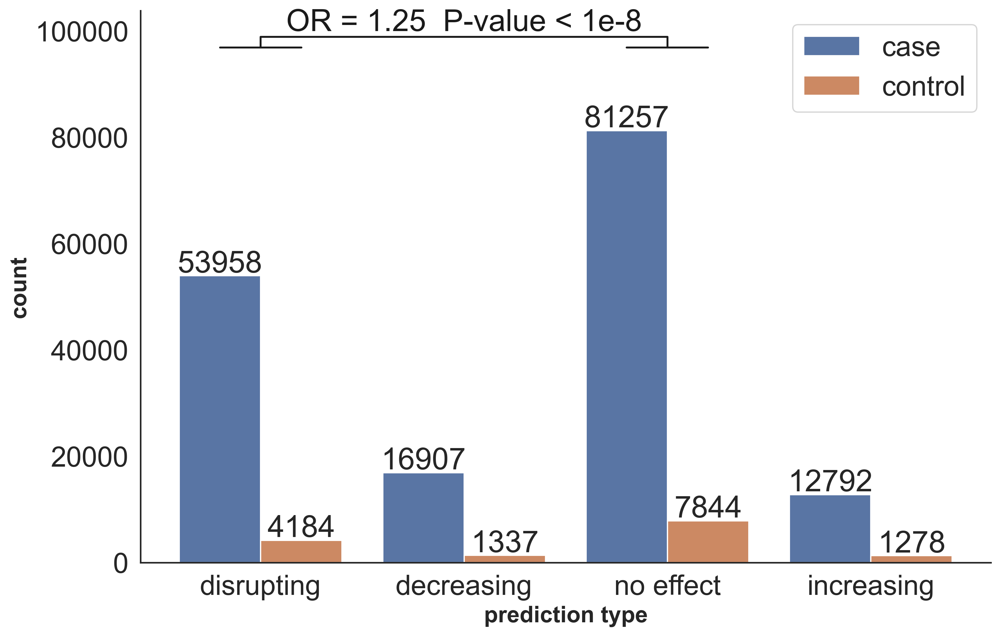

In [67]:
# temp PPI unit try
df_plus = df_plus[~(df_plus['PrimaryPhenotype'] == 'Uncharacterized (Mixed healthy control)')]
df_plus['sample_type'] = 'case'
# df_plus.loc[df_plus[df_plus['PrimaryPhenotype'] == 'Uncharacterized (Mixed healthy control)'].index, 'sample_type'] = 'control'
df_plus.loc[df_plus[df_plus['PrimaryPhenotype'] == 'Sibling Control'].index, 'sample_type'] = 'control'

df_plus['pred_class'] = df_plus['pred_class'].replace(0, 'disrupting')
df_plus['pred_class'] = df_plus['pred_class'].replace(1, 'decreasing')
df_plus['pred_class'] = df_plus['pred_class'].replace(2, 'no effect')
df_plus['pred_class'] = df_plus['pred_class'].replace(3, 'increasing')

fig, ax = plt.subplots(figsize=(12, 8), dpi=300)
sns.set(font_scale=2, style='white')
my_order = ['disrupting', 'decreasing', 'no effect', 'increasing']
plot = sns.countplot(data=df_plus, x='pred_class', ax=ax, order=my_order, hue='sample_type')
# plt.rcParams["axes.labelsize"] = 12

for p in plot.patches:
    plot.annotate(p.get_height(), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')

ax.set_xlabel('prediction type', fontsize=18, fontweight='bold')
ax.set_ylabel('count', fontsize=18, fontweight='bold')

# statistical annotation
x1, x2 = 0, 2   # columns 'Sat' and 'Sun' (first column: 0, see plt.xticks())
y, h, col = 86898 + 10000, 2000, 'k'
plt.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1.5, c=col)
plt.plot([x1 - 0.2, x1 + 0.2], [y, y], lw=1.5, c=col)
plt.plot([x2 - 0.2, x2 + 0.2], [y, y], lw=1.5, c=col)
plt.text((x1+x2)*.5, y+h, "OR = 1.25  P-value < 1e-8", ha='center', va='bottom', color=col)


ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.legend().set_title('')

png1 = io.BytesIO()
plt.savefig(png1, format="png")
# Load this image into PIL
png2 = Image.open(png1)
# Save as TIFF
png2.save("./psymukb_via_att_plots/PPIunit_case_control_count_nomixhealthy.tiff", dpi=png2.info['dpi'])
png1.close()

In [156]:
pred_arr = np.zeros((master_table.shape[0], 4))
pred_re_arr = np.zeros((master_table.shape[0], 4))
for i in tqdm(master_table.index):
    df_tmp = df_plus[df_plus['var_abbr'] == master_table.loc[i, 'var_abbr']]
    pred_arr[i, 0] += sum(df_tmp['pred_class'] == 0)
    pred_arr[i, 1] += sum(df_tmp['pred_class'] == 1)
    pred_arr[i, 2] += sum(df_tmp['pred_class'] == 2)
    pred_arr[i, 3] += sum(df_tmp['pred_class'] == 3)
    pred_re_arr[i, 0] += sum(df_tmp['pred_re_class'] == 0)
    pred_re_arr[i, 1] += sum(df_tmp['pred_re_class'] == 1)
    pred_re_arr[i, 2] += sum(df_tmp['pred_re_class'] == 2)
    pred_re_arr[i, 3] += sum(df_tmp['pred_re_class'] == 3)

100%|██████████| 19228/19228 [03:00<00:00, 106.42it/s]


In [157]:
pred_arr = pred_arr.astype(int)
pred_re_arr = pred_re_arr.astype(int)

In [158]:
master_table['pred_most_common'] = pred_arr.argmax(axis=-1)
master_table['pred_disrupting'] = pred_arr[:, 0]
master_table['pred_decreasing'] = pred_arr[:, 1]
master_table['pred_noeffect'] = pred_arr[:, 2]
master_table['pred_increasing'] = pred_arr[:, 3]
master_table['pred_sum'] = pred_arr.sum(axis=-1)

master_table['pred_re_most_common'] = pred_re_arr.argmax(axis=-1)
master_table['pred_re_disrupting'] = pred_re_arr[:, 0]
master_table['pred_re_decreasing'] = pred_re_arr[:, 1]
master_table['pred_re_noeffect'] = pred_re_arr[:, 2]
master_table['pred_re_increasing'] = pred_re_arr[:, 3]

In [159]:
master_table.head()

,Unnamed: 0,EntrezID,cytoBand,Chr,Start,End,Ref,Alt,Variant,Gene.refGene,Func.refGene,ExonicFunc.refGene,SampleID,StudyName,PubmedID,NumProbands,NumControls,SequenceType,PrimaryPhenotype,DisorderCategory,Validation,sex,source,GeneDetail.refGene,AAChange.refGene,1000G_ALL,1000G_AFR,1000G_AMR,1000G_EAS,1000G_EUR,1000G_SAS,ExAC_Freq,ExAC_AFR,ExAC_AMR,ExAC_EAS,ExAC_FIN,ExAC_NFE,ExAC_OTH,ExAC_SAS,ESP6500si_ALL,ESP6500si_AA,ESP6500si_EA,CG46,NCI60,dbSNP,COSMIC_ID,COSMIC_DIS,ClinVar_SIG,ClinVar_DIS,ClinVar_ID,ClinVar_DB,ClinVar_DBID,GWAS_DIS,GWAS_OR,GWAS_BETA,GWAS_PUBMED,GWAS_SNP,GWAS_P,SIFT_score,SIFT_converted_rankscore,SIFT_pred,Polyphen2_HDIV_score,Polyphen2_HDIV_rankscore,Polyphen2_HDIV_pred,Polyphen2_HVAR_score,Polyphen2_HVAR_rankscore,Polyphen2_HVAR_pred,LRT_score,LRT_converted_rankscore,LRT_pred,MutationTaster_score,MutationTaster_converted_rankscore,MutationTaster_pred,MutationAssessor_score,MutationAssessor_score_rankscore,MutationAssessor_pred,FATHMM_score,FATHMM_converted_rankscore,FATHMM_pred,PROVEAN_score,PROVEAN_converted_rankscore,PROVEAN_pred,VEST3_score,VEST3_rankscore,MetaSVM_score,MetaSVM_rankscore,MetaSVM_pred,MetaLR_score,MetaLR_rankscore,MetaLR_pred,M-CAP_score,M-CAP_rankscore,M-CAP_pred,CADD_raw,CADD_raw_rankscore,CADD_phred,DANN_score,DANN_rankscore,fathmm-MKL_coding_score,fathmm-MKL_coding_rankscore,fathmm-MKL_coding_pred,Eigen_coding_or_noncoding,Eigen-raw,Eigen-PC-raw,GenoCanyon_score,GenoCanyon_score_rankscore,integrated_fitCons_score,integrated_fitCons_score_rankscore,integrated_confidence_value,GERP++_RS,GERP++_RS_rankscore,phyloP100way_vertebrate,phyloP100way_vertebrate_rankscore,phyloP20way_mammalian,phyloP20way_mammalian_rankscore,phastCons100way_vertebrate,phastCons100way_vertebrate_rankscore,phastCons20way_mammalian,phastCons20way_mammalian_rankscore,SiPhy_29way_logOdds,SiPhy_29way_logOdds_rankscore,Interpro_domain,GTEx_V6_gene,GTEx_V6_tissue,gnomAD_exome_ALL,gnomAD_exome_AFR,gnomAD_exome_AMR,gnomAD_exome_ASJ,gnomAD_exome_EAS,gnomAD_exome_FIN,gnomAD_exome_NFE,gnomAD_exome_OTH,gnomAD_exome_SAS,gnomAD_genome_ALL,gnomAD_genome_AFR,gnomAD_genome_AMR,gnomAD_genome_ASJ,gnomAD_genome_EAS,gnomAD_genome_FIN,gnomAD_genome_NFE,gnomAD_genome_OTH,enh_id,enh_chr,enh_start,enh_end,enh_target_geneid,pro_id,pro_chr,pro_start,pro_end,pro_target_geneid,pro_gene_symbol,DeepSea_Score,Haploinsufficiency_Score,HI_Rank,gene_symbol,refseq_mrna,exon_id,cDNA_var,protein_var,peptide,pep_len,protein_ori,protein_mut,protein_pos,ori_win51,mut_win51,mut_peptide,var_abbr,pred_most_common,pred_disrupting,pred_decreasing,pred_noeffect,pred_increasing,pred_sum,pred_re_most_common,pred_re_disrupting,pred_re_decreasing,pred_re_noeffect,pred_re_increasing
0,0,1778,14q32.31,14,102505753,102505753,A,C,A>C,DYNC1H1,exonic,nonsynonymous SNV,21076407_1,Vissers 2010,21076407,10,0,exome,Intellectual disability (ID),psychiatric disorder,validated,M,.,.,DYNC1H1:NM_001376:exon61:c.A11465C:p.H3822P,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,rs387906739,.,.,Pathogenic,Mental_retardation\x2c_autosomal_dominant_13,RCV000022930.3,MedGen:OMIM,C3281202:614563,.,.,.,.,.,.,0.002,0.721,D,1,0.899,D,0.994,0.807,D,0,0.843,D,1,0.81,D,2.88,0.837,M,0.68,0.52,T,-8.26,0.969,D,0.988,0.992,-0.177,0.783,T,0.365,0.726,T,0.195,0.864,D,5.578,0.759,26.4,0.986,0.432,0.996,0.977,D,c,0.926,0.881,1,0.747,0.707,0.73,0,5.82,0.927,9.325,0.96,1.199,0.96,1,0.715,0.962,0.444,16.173,0.816,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,GH14I102503,14,102503571,102505975,122416|23186|9895|51550|55778|106866981,.,.,.,.,.,.,0.0028925,0.285436253,28.69%,DYNC1H1,NM_001376,exon61,c.A11465C,p.H3822P,MSEPGGGGGEDGSAGLEVSAVQNVADVSVLQKHLRKLVPLLLEDGG...,4646.0,H,P,3822,VSQQYLPLSTACSSIYFTMESLKQIHFLYQYSLQFFLDIYHNVLYE...,VSQQYLPLSTACSSIYFTMESLKQIPFLYQYSLQFFLDIYHNVLYE...,MSEPGGGGGEDGSAGLEVSAVQNVADVSVLQKHLRKLVPLLLEDGG...,NM_001376_H3822P,2,11,2,18,0,31,2,1,0,27,3
1,1,148103,19q13.11,19,35251174,35251174,G,A,G>A,ZNF599,exonic,nonsynonymous SNV,21076407_1,Vissers 2010,21076407,10,0,exome,Intellectual disability (I

In [160]:
master_table[-10:]

,Unnamed: 0,EntrezID,cytoBand,Chr,Start,End,Ref,Alt,Variant,Gene.refGene,Func.refGene,ExonicFunc.refGene,SampleID,StudyName,PubmedID,NumProbands,NumControls,SequenceType,PrimaryPhenotype,DisorderCategory,Validation,sex,source,GeneDetail.refGene,AAChange.refGene,1000G_ALL,1000G_AFR,1000G_AMR,1000G_EAS,1000G_EUR,1000G_SAS,ExAC_Freq,ExAC_AFR,ExAC_AMR,ExAC_EAS,ExAC_FIN,ExAC_NFE,ExAC_OTH,ExAC_SAS,ESP6500si_ALL,ESP6500si_AA,ESP6500si_EA,CG46,NCI60,dbSNP,COSMIC_ID,COSMIC_DIS,ClinVar_SIG,ClinVar_DIS,ClinVar_ID,ClinVar_DB,ClinVar_DBID,GWAS_DIS,GWAS_OR,GWAS_BETA,GWAS_PUBMED,GWAS_SNP,GWAS_P,SIFT_score,SIFT_converted_rankscore,SIFT_pred,Polyphen2_HDIV_score,Polyphen2_HDIV_rankscore,Polyphen2_HDIV_pred,Polyphen2_HVAR_score,Polyphen2_HVAR_rankscore,Polyphen2_HVAR_pred,LRT_score,LRT_converted_rankscore,LRT_pred,MutationTaster_score,MutationTaster_converted_rankscore,MutationTaster_pred,MutationAssessor_score,MutationAssessor_score_rankscore,MutationAssessor_pred,FATHMM_score,FATHMM_converted_rankscore,FATHMM_pred,PROVEAN_score,PROVEAN_converted_rankscore,PROVEAN_pred,VEST3_score,VEST3_rankscore,MetaSVM_score,MetaSVM_rankscore,MetaSVM_pred,MetaLR_score,MetaLR_rankscore,MetaLR_pred,M-CAP_score,M-CAP_rankscore,M-CAP_pred,CADD_raw,CADD_raw_rankscore,CADD_phred,DANN_score,DANN_rankscore,fathmm-MKL_coding_score,fathmm-MKL_coding_rankscore,fathmm-MKL_coding_pred,Eigen_coding_or_noncoding,Eigen-raw,Eigen-PC-raw,GenoCanyon_score,GenoCanyon_score_rankscore,integrated_fitCons_score,integrated_fitCons_score_rankscore,integrated_confidence_value,GERP++_RS,GERP++_RS_rankscore,phyloP100way_vertebrate,phyloP100way_vertebrate_rankscore,phyloP20way_mammalian,phyloP20way_mammalian_rankscore,phastCons100way_vertebrate,phastCons100way_vertebrate_rankscore,phastCons20way_mammalian,phastCons20way_mammalian_rankscore,SiPhy_29way_logOdds,SiPhy_29way_logOdds_rankscore,Interpro_domain,GTEx_V6_gene,GTEx_V6_tissue,gnomAD_exome_ALL,gnomAD_exome_AFR,gnomAD_exome_AMR,gnomAD_exome_ASJ,gnomAD_exome_EAS,gnomAD_exome_FIN,gnomAD_exome_NFE,gnomAD_exome_OTH,gnomAD_exome_SAS,gnomAD_genome_ALL,gnomAD_genome_AFR,gnomAD_genome_AMR,gnomAD_genome_ASJ,gnomAD_genome_EAS,gnomAD_genome_FIN,gnomAD_genome_NFE,gnomAD_genome_OTH,enh_id,enh_chr,enh_start,enh_end,enh_target_geneid,pro_id,pro_chr,pro_start,pro_end,pro_target_geneid,pro_gene_symbol,DeepSea_Score,Haploinsufficiency_Score,HI_Rank,gene_symbol,refseq_mrna,exon_id,cDNA_var,protein_var,peptide,pep_len,protein_ori,protein_mut,protein_pos,ori_win51,mut_win51,mut_peptide,var_abbr,pred_most_common,pred_disrupting,pred_decreasing,pred_noeffect,pred_increasing,pred_sum,pred_re_most_common,pred_re_disrupting,pred_re_decreasing,pred_re_noeffect,pred_re_increasing
19218,20892,140893,20q13.33,20,60987790,60987790,G,A,G>A,RBBP8NL,exonic,nonsynonymous SNV,.,Rees 2019,doi.org/10.1101/607549,613,0,exome,Schizophrenia (SCZ),psychiatric disorder,not_available,.,.,.,RBBP8NL:NM_080833:exon13:c.C1766T:p.A589V,0.0002,.,.,.,.,0.001,0.0002,0,0.0002,0,0,0.0002,0,0.0004,.,.,.,.,.,rs564079274,.,.,.,.,.,.,.,.,.,.,.,.,.,0.104,0.299,T,0.013,0.154,B,0.002,0.063,B,0.754,0.065,N,1,0.09,N,0.975,0.246,L,1.87,0.241,T,-0.68,0.195,N,0.019,0.004,-0.994,0.315,T,0.032,0.136,T,0.012,0.309,T,0.636,0.155,8.4,0.611,0.065,0.043,0.097,N,c,-1.137,-1.182,1,0.747,0.581,0.326,0,-0.021,0.132,-0.103,0.108,-0.002,0.135,0,0.063,0.001,0.043,3.83,0.083,.,.,.,0.0001,0,0.0003,0,0,0,0.0002,0.0002,0.0002,3.23E-05,0,0,0,0,0,6.67E-05,0,.,.,.,.,.,.,.,.,.,.,.,0.020846,0.002687582,89.27%,RBBP8NL,NM_080833,exon13,c.C1766T,p.A589V,MESFMESLNRLKEIHEKEVLGLQNKLLELNSERCRDAQRIEELFSK...,664.0,A,V,589,EVLRPESDELDETDTPGSEVGLSSQAEATTSTTGEGPECICTQEHG...,EVLRPESDELDETDTPGSEVGLSSQVEATTSTTGEGPECICTQEHG...,MESFMESLNRLKEIHEKEVLGLQNKLLELNSERCRDAQRIEELFSK...,NM_080833_A589V,0,0,0,0,0,0,0,0,0,0,0
19219,20893,7113,21q22.3,21,42839740,42839740,G,C,G>C,TMPRSS2,exonic,nonsynonymous SNV,.,Rees 2019,doi.org/10.1101/607549,613,0,exome,Schizophrenia (SCZ),psychiatric disorder,not_available,.,.,.,"TMPRSS2:NM_001135099:exon13:c.C

In [161]:
master_table['pred_sum']

0        31
1         1
2         4
3        62
4         0
         ..
19223     6
19224     6
19225     0
19226     1
19227    65
Name: pred_sum, Length: 19228, dtype: int32

In [162]:
master_table = master_table[~(master_table['pred_sum'] == 0)]

In [163]:
master_table.shape

(13721, 180)

In [164]:
master_table.to_csv('./psymukb_via_att_plots/psymukb_mippi_done_att.tsv', sep='\t')

In [3]:
# # reload start part point
master_table = pd.read_csv('./psymukb_via_att_plots/psymukb_mippi_done_att.tsv', sep='\t')

C:\Users\Administrator\AppData\Local\Temp\ipykernel_448\4283037933.py:2: DtypeWarning: Columns (15,17,153) have mixed types. Specify dtype option on import or set low_memory=False.
  master_table = pd.read_csv('./psymukb_via_att_plots/psymukb_mippi_done_att.tsv', sep='\t')


In [4]:
master_table.head()

,Unnamed: 0.1,Unnamed: 0,EntrezID,cytoBand,Chr,Start,End,Ref,Alt,Variant,...,pred_disrupting,pred_decreasing,pred_noeffect,pred_increasing,pred_sum,pred_re_most_common,pred_re_disrupting,pred_re_decreasing,pred_re_noeffect,pred_re_increasing
0,0,0,1778,14q32.31,14,102505753,102505753,A,C,A>C,...,11,2,18,0,31,2,1,0,27,3
1,1,1,148103,19q13.11,19,35251174,35251174,G,A,G>A,...,0,0,1,0,1,2,0,0,1,0
2,2,2,116442,Xq28,X,154490173,154490173,G,A,G>A,...,0,2,1,1,4,3,0,1,1,2
3,3,3,7528,14q32.2,14,100743830,100743830,G,T,G>T,...,22,4,36,0,62,2,16,6,40,0
4,6,6,10522,11p15.5,11,686979,686979,A,C,A>C,...,2,3,0,0,5,3,1,0,0,4


In [5]:
master_table['pred_most_common'].value_counts()

2    7471
0    4605
1     826
3     819
Name: pred_most_common, dtype: int64

In [6]:
master_table['pred_most_common_type'] = master_table['pred_most_common']
master_table['pred_most_common_type'] = master_table['pred_most_common_type'].replace(0, 'disrupting')
master_table['pred_most_common_type'] = master_table['pred_most_common_type'].replace(1, 'decreasing')
master_table['pred_most_common_type'] = master_table['pred_most_common_type'].replace(2, 'no effect')
master_table['pred_most_common_type'] = master_table['pred_most_common_type'].replace(3, 'increasing')

In [7]:
master_table['sample_type'] = 'case'
master_table.loc[master_table[master_table['PrimaryPhenotype'] == 'Uncharacterized (Mixed healthy control)'].index, 'sample_type'] = 'control'
master_table.loc[master_table[master_table['PrimaryPhenotype'] == 'Sibling Control'].index, 'sample_type'] = 'control'

In [8]:
master_table['pred_most_common_type'].value_counts()

no effect     7471
disrupting    4605
decreasing     826
increasing     819
Name: pred_most_common_type, dtype: int64

In [9]:
master_table

,Unnamed: 0.1,Unnamed: 0,EntrezID,cytoBand,Chr,Start,End,Ref,Alt,Variant,...,pred_noeffect,pred_increasing,pred_sum,pred_re_most_common,pred_re_disrupting,pred_re_decreasing,pred_re_noeffect,pred_re_increasing,pred_most_common_type,sample_type
0,0,0,1778,14q32.31,14,102505753,102505753,A,C,A>C,...,18,0,31,2,1,0,27,3,no effect,case
1,1,1,148103,19q13.11,19,35251174,35251174,G,A,G>A,...,1,0,1,2,0,0,1,0,no effect,case
2,2,2,116442,Xq28,X,154490173,154490173,G,A,G>A,...,1,1,4,3,0,1,1,2,decreasing,case
3,3,3,7528,14q32.2,14,100743830,100743830,G,T,G>T,...,36,0,62,2,16,6,40,0,no effect,case
4,6,6,10522,11p15.5,11,686979,686979,A,C,A>C,...,0,0,5,3,1,0,0,4,decreasing,case
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13716,19221,20895,5211,21q22.3,21,45726603,45726603,T,C,T>C,...,1,0,5,2,1,0,3,1,disrupting,case
13717,19223,20898,3761,22q13.1,22,38822895,38822895,G,A,G>A,...,3,0,6,0,4,0,2,0,disrupting,case
13718,19224,20899,158,22q13.1,22,40760337,40760337,A,G,A>G,...,2,0,6,0,3,0,2,1,disrupting,case
13719,19226,20901,23096,Xp11.22,X,53279605,53279605,C,T,C>T,...,1,0,1,2,0,0,1,0,no effect,case


In [14]:
DDtable = master_table[master_table["PrimaryPhenotype"] == 'Developmental Delay (DD)']
print(DDtable[DDtable["pred_most_common_type"] == 'increasing'].shape[0])
print(DDtable[DDtable["pred_most_common_type"] == 'decreasing'].shape[0])
print(DDtable[DDtable["pred_most_common_type"] == 'disrupting'].shape[0])
print(DDtable[DDtable["pred_most_common_type"] == 'no effect'].shape[0])

DDtable = master_table[master_table["PrimaryPhenotype"] == 'Sibling Control']
print(DDtable[DDtable["pred_most_common_type"] == 'increasing'].shape[0])
print(DDtable[DDtable["pred_most_common_type"] == 'decreasing'].shape[0])
print(DDtable[DDtable["pred_most_common_type"] == 'disrupting'].shape[0])
print(DDtable[DDtable["pred_most_common_type"] == 'no effect'].shape[0])

200
193
1148
1647
60
60
315
605


In [192]:
#disease_list = master_table["PrimaryPhenotype"].unique().tolist()
DDtable = master_table[master_table["PrimaryPhenotype"] == 'Developmental Delay (DD)']
DD_increasing = DDtable[DDtable["pred_most_common_type"] == 'increasing']
gene_list = DD_increasing["gene_symbol"].reset_index(drop=True).values
#print(gene_list)
#print(np.unique(gene_list).shape)
#print(gene_list.shape)
unique_list = np.unique(gene_list)
print(unique_list)
print(unique_list.shape)

['AATK' 'ABCA2' 'ABCA3' 'ABCC6' 'ABLIM1' 'ACADSB' 'AGAP2' 'AK3' 'AKAP13'
 'ALDH1A2' 'ALK' 'ALOX12' 'ALPL' 'ANK1' 'AP3D1' 'ARAP1' 'ARHGAP8'
 'ATP6V1B1' 'ATP6V1B2' 'BNIP3L' 'BRAF' 'C4orf3' 'CAMKMT' 'CBX6' 'CCDC71'
 'CDC14A' 'CDC14B' 'CDC42BPB' 'CDKL2' 'CELSR1' 'CENPJ' 'CHD3' 'CHD4'
 'COG8' 'COLGALT1' 'COQ3' 'CSDE1' 'CSE1L' 'DAZAP1' 'DCAF7' 'DDX3X' 'DDX53'
 'DHRS2' 'DHX37' 'DNAH11' 'DNM2' 'DNMBP' 'DOCK5' 'DUSP6' 'DYRK1A' 'EEF1A2'
 'EGF' 'EHD1' 'ELMO1' 'ELP3' 'ENTPD4' 'EPHB4' 'ETV2' 'EXOC2' 'EZR'
 'FBXL14' 'FBXL17' 'FBXL19' 'FBXO16' 'FBXO46' 'FBXW7' 'FGA' 'FGD3' 'FGFR1'
 'FGFR2' 'FGFR3' 'FREM2' 'FSD1' 'GFOD2' 'GNB1' 'GPC1' 'GPR18' 'GRM5'
 'GTF2H3' 'H2AFZ' 'HDAC3' 'HIF3A' 'HNRNPAB' 'HOXB7' 'HTR7' 'IGBP1' 'IGF2'
 'IGHMBP2' 'IL22RA1' 'IL27RA' 'IPO8' 'IQSEC2' 'ITGA7' 'ITGA9' 'ITPR1'
 'KCNQ3' 'KIAA1211' 'KIF13B' 'LARP7' 'LCMT2' 'LMF1' 'LONP1' 'LPIN2'
 'LZTR1' 'MAP2K1' 'MAP3K11' 'MAP3K4' 'MAPK9' 'MGA' 'MSH6' 'NCAPH' 'NMRAL1'
 'NOTCH2' 'NPTN' 'NSD1' 'NSFL1C' 'NYNRIN' 'OBSCN' 'ORC3' 'PAWR' 'PCDH10

In [191]:
#disease_list = master_table["PrimaryPhenotype"].unique().tolist()
DDtable = master_table[master_table["PrimaryPhenotype"] == 'Developmental Delay (DD)']
DD_increasing = DDtable[DDtable["pred_most_common_type"] == 'decreasing']
gene_list = DD_increasing["gene_symbol"].reset_index(drop=True).values
#print(gene_list)
#print(np.unique(gene_list).shape)
#print(gene_list.shape)
unique_list = np.unique(gene_list)
print(unique_list)
print(unique_list.shape)

['ABCA2' 'ABCC6' 'ACAD9' 'ADAR' 'ALDH1A3' 'ANKRD28' 'AQP4' 'ARAP3'
 'ARFGEF1' 'ARFGEF2' 'ARHGAP23' 'ARHGAP35' 'ARSB' 'ASPG' 'ATP1A2' 'ATRX'
 'BAIAP2' 'BAP1' 'BLNK' 'BRAF' 'BRD3' 'BRWD3' 'BTF3' 'CA4' 'CA9' 'CACNA1A'
 'CAMK2A' 'CAPRIN1' 'CASP7' 'CCNL2' 'CD200R1' 'CD58' 'CDH8' 'CDK13'
 'CDKL5' 'CHD4' 'CHL1' 'CHST15' 'CMIP' 'COL11A1' 'COL20A1' 'CPSF1' 'CPZ'
 'CSNK2A1' 'CTNND2' 'CTSB' 'DCAF4' 'DDX19B' 'DDX39B' 'DDX3X' 'DHX40'
 'DNAJC18' 'DOK7' 'EED' 'EGF' 'EGFLAM' 'ENO2' 'EZH2' 'F7' 'FARSA' 'FICD'
 'GGNBP2' 'GNB1' 'GOSR1' 'GPR50' 'HCN4' 'HDLBP' 'HMCES' 'IGF1R' 'IL21R'
 'ILVBL' 'IQGAP2' 'IQGAP3' 'IRF3' 'ITFG2' 'ITPRIP' 'JAZF1' 'KCNH1' 'KCNQ3'
 'KDELR1' 'KDELR3' 'KIF21A' 'KLHL17' 'KMT2A' 'LACTB2' 'LAMB1' 'LCN2'
 'LGALS12' 'LRIG2' 'LRP3' 'MADD' 'MAP2' 'MAP3K7' 'MAP4K4' 'MAST2' 'MED12'
 'MEF2C' 'MPL' 'MUC4' 'NCAPG2' 'NFKBIB' 'NFX1' 'NPHS2' 'NPR2' 'NRAS'
 'NWD2' 'PADI4' 'PAK6' 'PCDH9' 'PCLO' 'PCOLCE2' 'PEX7' 'PHRF1' 'PLCB3'
 'PLCL2' 'PLXNB2' 'PLXNB3' 'PLXND1' 'PNPLA2' 'POLA2' 'POLG' 'PPP1R12A'
 

In [190]:
#disease_list = master_table["PrimaryPhenotype"].unique().tolist()
DDtable = master_table[master_table["PrimaryPhenotype"] == 'Developmental Delay (DD)']
DD_increasing = DDtable[DDtable["pred_most_common_type"] == 'disrupting']
gene_list = DD_increasing["gene_symbol"].reset_index(drop=True).values
#print(gene_list)
#print(np.unique(gene_list).shape)
#print(gene_list.shape)
unique_list = np.unique(gene_list)
print(unique_list)
print(unique_list.shape)

['AAGAB' 'AARS2' 'AATK' 'ABCC4' 'ABCF1' 'ABCF2' 'ABHD16A' 'ACACA' 'ACOT11'
 'ACTC1' 'ACTL7A' 'ADAM17' 'ADCY6' 'ADCY9' 'ADRA1D' 'AGAP1' 'AGER' 'AGO1'
 'AGPAT2' 'AHCTF1' 'AIFM3' 'AKAP2' 'ALDH1B1' 'ALDH1L1' 'ALDH6A1' 'ALDH9A1'
 'ALK' 'ALKBH4' 'ANK1' 'ANK3' 'ANKRD11' 'ANKRD17' 'ANKRD44' 'ANKS1A'
 'ANKZF1' 'ANXA6' 'AP1M1' 'AP2B1' 'AP2M1' 'ARFGEF2' 'ARHGAP31' 'ARHGAP32'
 'ARHGAP35' 'ARHGAP36' 'ARHGAP39' 'ARHGEF1' 'ARHGEF12' 'ARHGEF17' 'ARID1B'
 'ARID4B' 'ARRB2' 'ASCC3' 'ASIC3' 'ASPSCR1' 'ASTL' 'ATG101' 'ATG2A' 'ATG7'
 'ATM' 'ATP11C' 'ATP1A1' 'ATP1A2' 'ATP2B1' 'ATP6V1B2' 'ATP8A1' 'ATRX'
 'ATXN2L' 'ATXN3' 'AVPI1' 'B4GALNT1' 'B4GALNT4' 'BAG3' 'BAZ1B' 'BBS2'
 'BCAR3' 'BCAT1' 'BCL11A' 'BIRC6' 'BOC' 'BPIFB1' 'BRAF' 'BRINP1' 'BRSK2'
 'BTF3' 'C1GALT1' 'C2CD2' 'C8orf33' 'CACNA1A' 'CACNA1C' 'CACNA1H'
 'CACNA2D2' 'CACNG3' 'CADM1' 'CALR' 'CAMK2B' 'CANT1' 'CAPZA2' 'CARHSP1'
 'CASK' 'CASKIN1' 'CBL' 'CBX5' 'CCAR1' 'CCDC59' 'CD22' 'CD244' 'CD274'
 'CD300C' 'CD40' 'CD46' 'CD59' 'CDC20B' 'CDCA7L' 'CDH2' 'CDK1

In [193]:
#disease_list = master_table["PrimaryPhenotype"].unique().tolist()
DDtable = master_table[master_table["PrimaryPhenotype"] == 'Developmental Delay (DD)']
DD_increasing = DDtable[DDtable["pred_most_common_type"] == 'no effect']
gene_list = DD_increasing["gene_symbol"].reset_index(drop=True).values
#print(gene_list)
#print(np.unique(gene_list).shape)
#print(gene_list.shape)
unique_list = np.unique(gene_list)
for item in unique_list:
    print(item)
#print(unique_list.shape)

AARS
ABCA1
ABCA3
ABCB8
ABCC2
ABL2
ABLIM2
ACACB
ACAD10
ACIN1
ACSF3
ACTA1
ACTL6B
ACTN1
ACTN4
ACVR1
ACVRL1
ADAM12
ADAP1
ADCY5
ADCYAP1
ADNP
AES
AFF3
AGO1
AGO3
AGPAT3
AGPS
AGRN
AGTPBP1
AIDA
AIMP1
AKAP1
AKAP12
AKT3
ALG13
ALG14
ALOX5
AMD1
AMIGO1
AMMECR1
AMOT
AMOTL1
AMOTL2
ANK1
ANK2
ANKHD1
ANKRD17
ANKRD50
AP1G1
AP2A2
AP4M1
APBB1IP
APOL6
APPL2
ARHGAP18
ARHGAP21
ARHGAP32
ARHGAP39
ARHGEF15
ARHGEF17
ARHGEF26
ARHGEF9
ARID1A
ARID3B
ARID4A
ARIH1
ARNT2
ASAP2
ASIC3
ASPSCR1
ATCAY
ATF7IP
ATF7IP2
ATG3
ATG4A
ATN1
ATP11A
ATP2A2
ATP2B1
ATP2B2
ATP4A
ATP6AP2
ATP6V0A1
ATP6V1A
ATP6V1C2
ATP6V1H
ATXN2L
AURKB
AXL
AZI2
B4GALNT3
BACH2
BAG3
BAG6
BARD1
BAX
BAZ2A
BBS4
BBX
BCAM
BCAR3
BCAS3
BCL11A
BCL6
BCOR
BFSP1
BID
BNC1
BOD1L1
BPIFA1
BPTF
BRCA1
BRCA2
BRD2
BRD3
BRD9
BRMS1
BRMS1L
BRWD1
BSN
BTBD9
BTN3A1
BTNL8
C10orf90
C12orf43
C17orf75
C1QTNF1
C2orf68
C3
C4BPA
CACNA1A
CACNA1B
CACNA1H
CACNB3
CALR3
CAMK2A
CAMK2B
CAMK2G
CAMKV
CAMSAP2
CAMSAP3
CAMTA2
CAND2
CAPN1
CAPN15
CARD10
CARD11
CASK
CASKIN2
CBFA2T3
CBL
CCAR1
CCDC112
CCDC11

ASD

In [196]:
#disease_list = master_table["PrimaryPhenotype"].unique().tolist()
#print(disease_list)

DDtable = master_table[master_table["PrimaryPhenotype"] == 'Autism (ASD)']
DD_increasing = DDtable[DDtable["pred_most_common_type"] == 'increasing']
gene_list = DD_increasing["gene_symbol"].reset_index(drop=True).values
#print(gene_list)
#print(np.unique(gene_list).shape)
#print(gene_list.shape)
unique_list = np.unique(gene_list)
print(unique_list)
print(unique_list.shape)


['ABCA2' 'ABCB6' 'ABHD12' 'ADCY5' 'AFAP1' 'AFP' 'AGK' 'AHNAK' 'AK1'
 'AKAP4' 'ANKRD13B' 'ANKRD17' 'ANXA1' 'APAF1' 'APEX1' 'APLF' 'ARHGEF2'
 'ASPHD2' 'ATAD1' 'BCR' 'BIRC6' 'C1orf226' 'CAMK1D' 'CANT1' 'CASP8AP2'
 'CCAR1' 'CDC23' 'CDC42' 'CDK13' 'CHL1' 'CHRND' 'CLASP1' 'CLASP2'
 'COL11A1' 'COPS2' 'CSTA' 'DAAM1' 'DCAF12L1' 'DCAF4' 'DCAF4L1' 'DENND4C'
 'DEPTOR' 'DESI1' 'DNAJB11' 'DNAJC13' 'DNAJC5' 'DNMBP' 'DNMT1' 'DOCK4'
 'DOK7' 'DSG2' 'DUSP14' 'DYNC1H1' 'DYNC2H1' 'EEF1D' 'EHD1' 'EIF3H' 'ELK1'
 'EMC3' 'ENDOG' 'EPN1' 'EZR' 'FAT4' 'FBXO30' 'FCGBP' 'FIZ1' 'FLNA' 'FLNB'
 'FN1' 'GAB2' 'GBF1' 'GH1' 'GSK3B' 'GYG2' 'HDAC1' 'HIVEP1' 'HNRNPUL2'
 'HTATIP2' 'IFIH1' 'IGF2R' 'IL7R' 'INTS10' 'ITSN1' 'KDR' 'KIF13B' 'KIF18A'
 'KIF21A' 'KLHL14' 'LEF1' 'LGALS12' 'LLGL1' 'LMTK2' 'LRRK2' 'LTBP1'
 'LZTFL1' 'MAP2K3' 'MAP2K5' 'MCAM' 'MGRN1' 'MPI' 'MSH2' 'MSH5' 'MTG2'
 'MUC4' 'MXD4' 'MYO1E' 'MYOM2' 'NLGN2' 'NOTCH3' 'NRAP' 'NTN1' 'NUAK1'
 'NUP133' 'NYNRIN' 'PAX5' 'PCLO' 'PDCL' 'PDGFRB' 'PDIK1L' 'PDP2' 'PELI1'
 'PHF3

In [197]:
#disease_list = master_table["PrimaryPhenotype"].unique().tolist()
#print(disease_list)

DDtable = master_table[master_table["PrimaryPhenotype"] == 'Autism (ASD)']
DD_increasing = DDtable[DDtable["pred_most_common_type"] == 'decreasing']
gene_list = DD_increasing["gene_symbol"].reset_index(drop=True).values
#print(gene_list)
#print(np.unique(gene_list).shape)
#print(gene_list.shape)
unique_list = np.unique(gene_list)
print(unique_list)
print(unique_list.shape)

['ABCA2' 'ABL2' 'ACE' 'ADCY5' 'AKT2' 'ALDH5A1' 'ANKRD23' 'ANKRD52' 'APAF1'
 'ARFGEF2' 'ARL6IP6' 'BCR' 'BHLHE40' 'BIRC6' 'BPTF' 'BRAF' 'BRCA2' 'BRSK1'
 'C16orf70' 'C4orf19' 'CA5A' 'CASP2' 'CD151' 'CD163' 'CDH16' 'CDHR2'
 'CFAP74' 'CHSY1' 'CLASP1' 'CMYA5' 'COLEC12' 'CP' 'CPPED1' 'CRB1' 'CRY2'
 'CSF2RB' 'DAB2IP' 'DACT1' 'DDX5' 'DENND4A' 'DNAH11' 'DNAJB5' 'DNAJC27'
 'ELSPBP1' 'EML5' 'EPHX2' 'ERCC8' 'ESYT1' 'EXT1' 'FANCA' 'FAT3' 'FBRS'
 'FBXW9' 'FCN2' 'FGGY' 'FLNB' 'GAL3ST1' 'GATA4' 'GCAT' 'GIGYF2' 'GLCCI1'
 'GNAI1' 'GNB2' 'GNB4' 'HSPA4' 'IMPACT' 'IQGAP1' 'JADE2' 'KIAA1522'
 'KIF20A' 'KIF21A' 'KIF3C' 'LAMB1' 'LRFN3' 'LRRC31' 'LRRK2' 'LTK' 'MEF2C'
 'MEGF8' 'METTL16' 'MGAT4B' 'MICAL3' 'MOGS' 'MSH3' 'MTERF4' 'MTMR8' 'MUC4'
 'MXD4' 'MYH10' 'NAV2' 'NDRG3' 'NFAM1' 'NFKBIZ' 'NISCH' 'NLRC4' 'NR3C2'
 'NUP188' 'ORMDL2' 'OSMR' 'PBX1' 'PDK2' 'PDZD8' 'PEX6' 'PHIP' 'PHRF1'
 'PLXNB2' 'PPRC1' 'PSD4' 'PTK2B' 'PTMS' 'PTPRG' 'PTPRT' 'RAB11FIP2' 'RAN'
 'RASEF' 'RETN' 'RFPL1' 'RFX7' 'RGPD8' 'RGS12' 'RPL14' 'RRA

In [199]:
#disease_list = master_table["PrimaryPhenotype"].unique().tolist()
#print(disease_list)

DDtable = master_table[master_table["PrimaryPhenotype"] == 'Autism (ASD)']
DD_increasing = DDtable[DDtable["pred_most_common_type"] == 'no effect']
gene_list = DD_increasing["gene_symbol"].reset_index(drop=True).values
#print(gene_list)
#print(np.unique(gene_list).shape)
#print(gene_list.shape)
unique_list = np.unique(gene_list)
for item in unique_list:
    print(item)
print(unique_list.shape)

ABCA2
ABCA3
ABCC4
ABCD3
ABCE1
ABCF1
ABHD16A
ABI2
ABL1
ABTB1
ACACA
ACACB
ACAD10
ACOT11
ACOT7
ACP2
ACTG1
ACTR5
ACTR6
ADAMTSL4
ADCY3
ADCY6
ADD1
ADD3
ADIPOQ
ADNP
ADNP2
ADRM1
AEBP2
AGAP1
AGAP2
AGGF1
AGPAT5
AGRN
AGTRAP
AHCTF1
AHDC1
AHNAK
AHNAK2
AKAP1
AKAP12
AKAP13
AKAP2
AKAP6
AKAP9
AKR1D1
ALDH1L1
ALS2
ALS2CR12
AMBRA1
AMIGO1
AMPH
ANGPT2
ANGPTL4
ANK2
ANK3
ANKRD11
ANKRD13D
ANKS1A
ANO6
ANTXR1
AP1S2
AP2A2
AP3B2
AP3D1
APAF1
APBA2
APOB
APOC3
AQR
AREL1
ARHGAP21
ARHGAP32
ARHGEF1
ARHGEF10
ARHGEF11
ARHGEF3
ARHGEF5
ARID5A
ARID5B
ASAP2
ASB11
ASCC3
ASGR2
ASH1L
ASL
ASPM
ASPSCR1
ASTL
ASXL1
ATAD5
ATF2
ATG2A
ATG2B
ATOH1
ATP11C
ATP12A
ATP1B1
ATP2A1
ATP2B2
ATP2B4
ATP6V1A
AUTS2
AVEN
B3GALT2
B3GNT3
B9D1
BAIAP2L1
BAP1
BAZ1A
BCAM
BCCIP
BCL6
BCORL1
BDP1
BEND3
BIRC6
BMP15
BMP7
BOD1L1
BRCA2
BRD4
BRPF3
BSN
BTBD2
BTBD6
BZW2
C18orf54
C1orf35
C3
C7orf43
CABIN1
CACNA1A
CACNA1B
CACNA1C
CACNA1H
CACNA2D1
CAMKV
CAMSAP1
CAMSAP3
CAND2
CAP2
CAPN15
CAPRIN2
CARD10
CARS
CARS2
CBL
CBLL1
CBX8
CCAR2
CCDC102A
CCDC120
CCDC126
CCDC130
CCD

In [200]:
#disease_list = master_table["PrimaryPhenotype"].unique().tolist()
#print(disease_list)

DDtable = master_table[master_table["PrimaryPhenotype"] == 'Autism (ASD)']
DD_increasing = DDtable[DDtable["pred_most_common_type"] == 'disrupting']
gene_list = DD_increasing["gene_symbol"].reset_index(drop=True).values
#print(gene_list)
#print(np.unique(gene_list).shape)
#print(gene_list.shape)
unique_list = np.unique(gene_list)
for item in unique_list:
    print(item)
print(unique_list.shape)

ABCA1
ABCF1
ABCG1
ACTB
ACTC1
ACTN4
ADAP1
ADCY3
ADO
ADSL
AGAP2
AGO1
AGO3
AGO4
AHI1
AHR
AIFM3
AKAP1
AKIRIN2
AKR1B15
AKR1C2
ALDH1A3
ALDH3A1
ALDH6A1
ALPI
ALS2
AMIGO2
ANKDD1A
ANKHD1
ANKRD13D
ANKRD17
ANKRD27
ANKRD50
AP1G1
AP2M1
AP3B2
AP4E1
AP5M1
APBA1
APBB3
APC2
APEX2
APLP2
APOB
ARAP1
ARHGAP5
ARHGAP9
ARHGEF1
ARHGEF16
ARHGEF5
ARID1B
ASAP2
ASB1
ASB16
ASH2L
ASIC3
ASPHD2
ASPM
ATIC
ATM
ATP11A
ATP1A1
ATP1A4
ATP2A1
ATP2A3
ATP4A
ATP6V0A1
ATP6V0B
ATP8A1
ATR
BAD
BAZ1B
BBS9
BCHE
BIRC5
BIRC6
BNC1
BNIPL
BRCA2
BRD3
BRF1
BRIP1
BRPF1
BTAF1
BTBD10
BTN2A1
BTN2A2
C3
C4BPB
CA10
CA9
CABIN1
CACNA1B
CACNA1H
CAD
CALU
CAMK2A
CAMK2B
CAND2
CARD10
CASK
CASKIN1
CASP1
CASR
CBL
CBLL1
CCAR2
CCDC14
CCDC184
CCDC28B
CCDC6
CCDC60
CCDC84
CCNJL
CCNT1
CCNT2
CCT4
CCT6B
CCT7
CD59
CD72
CD79A
CDC42BPA
CDC42EP4
CDC7
CDH13
CDH2
CDH5
CDK18
CDK5RAP1
CDX2
CELSR1
CELSR2
CEP295
CFDP1
CGGBP1
CHAF1B
CHD1
CHD3
CHD4
CHD5
CHD8
CHFR
CHST9
CIAO1
CIC
CIT
CLASP1
CNOT3
CNOT4
CNPY2
CNST
CNTN2
COL14A1
COPA
COPS8
CORO1C
CORO7
CPA4
CPNE2
CPSF2
CPSF3
CPT1

In [99]:
master_table.shape

(13721, 182)

In [100]:
# to save a total table copy, run only once
master_table_original = master_table

In [110]:
master_table = master_table[~(master_table['PrimaryPhenotype'] == 'Uncharacterized (Mixed healthy control)')]

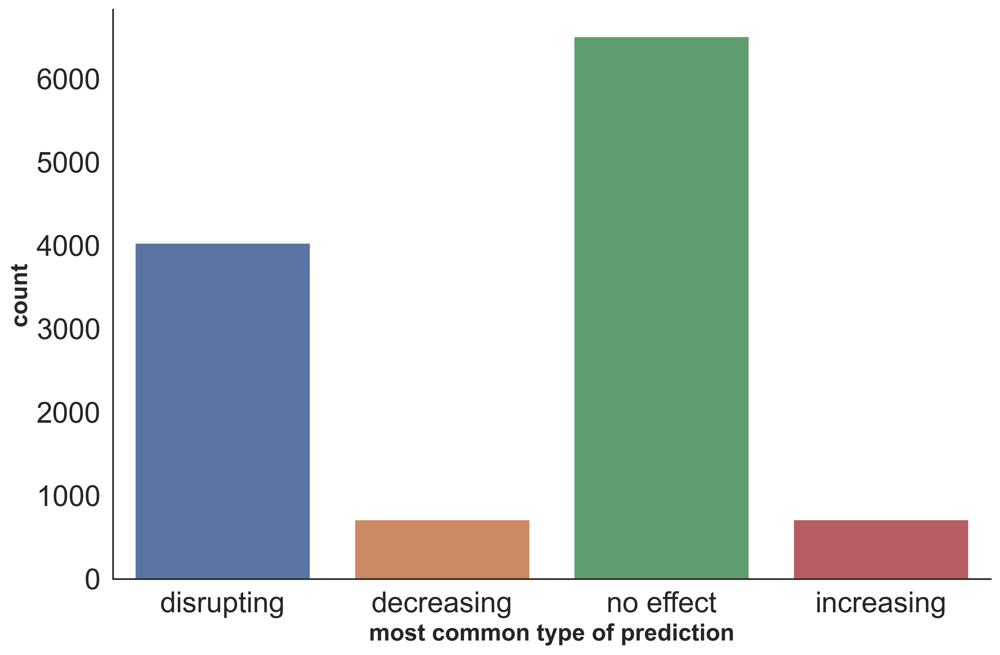

In [111]:
# 总体各类别数量统计
fig, ax = plt.subplots(figsize=(12, 8), dpi=300)
sns.set(font_scale=2, style='white')
my_order = ['disrupting', 'decreasing', 'no effect', 'increasing']
sns.countplot(data=master_table, x='pred_most_common_type', ax=ax, order=my_order)
# ax.set(xlabel='most common type of prediction', ylabel='count')
ax.set_xlabel('most common type of prediction', fontsize=18, fontweight='bold')
ax.set_ylabel('count', fontsize=18, fontweight='bold')
# plt.xticks(fontsize=18)
# plt.yticks(fontsize=18)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)


png1 = io.BytesIO()
plt.savefig(png1, format="png")

# Load this image into PIL
png2 = Image.open(png1)

# Save as TIFF
png2.save("./psymukb_via_att_plots/pred_type_count_nomixhealthy.tiff", dpi=png2.info['dpi'])
png1.close()

In [114]:
group1 = [3713, 651, 5902, 651]
group2 = [315, 60, 605, 60]
group_name = ['disrupting', 'decreasing', 'no effect', 'increasing']
adjust_cof = len(group1) * (len(group1) - 1) / 2
for i in range(len(group1) - 1):
    for j in range(i + 1, len(group1)):
        odds, p = stats.fisher_exact([[group1[i], group2[i]], [group1[j], group2[j]]])
        print('{} and {}, OR: {:.3f}, p-value: {:.5f}'.format(group_name[i], group_name[j], odds, p * adjust_cof))
# stats.fisher_exact([[3015, 235], [916, 80]])

disrupting and decreasing, OR: 1.086, p-value: 3.58629
disrupting and no effect, OR: 1.208, p-value: 0.05706
disrupting and increasing, OR: 1.086, p-value: 3.58629
decreasing and no effect, OR: 1.112, p-value: 2.96832
decreasing and increasing, OR: 1.000, p-value: 6.00000
no effect and increasing, OR: 0.899, p-value: 2.96832


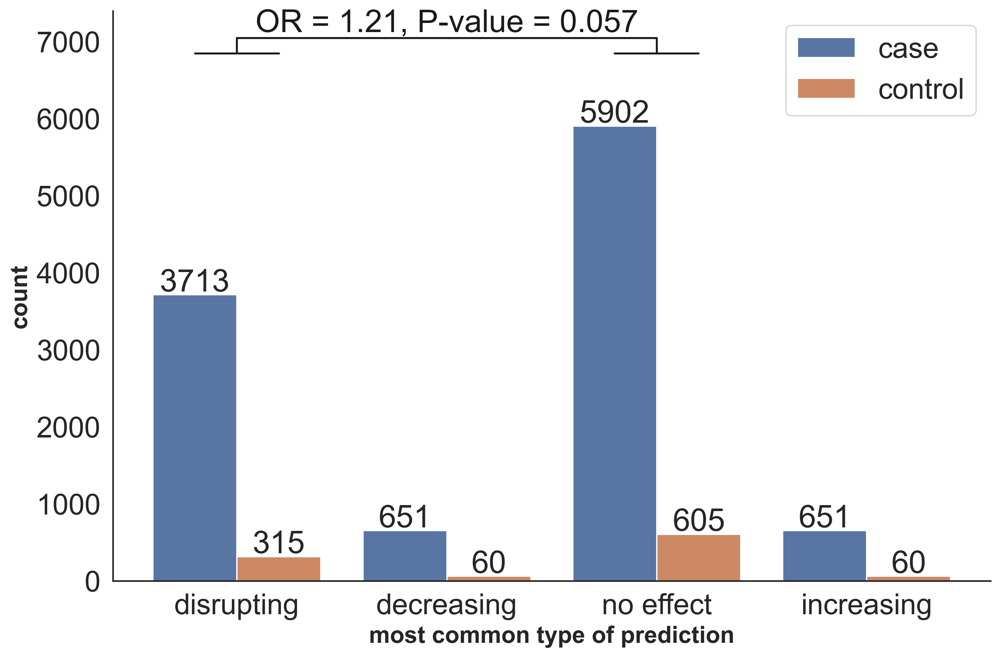

In [135]:

fig, ax = plt.subplots(figsize=(12, 8), dpi=300)
sns.set(font_scale=2, style='white')
my_order = ['disrupting', 'decreasing', 'no effect', 'increasing']
plot = sns.countplot(data=master_table, x='pred_most_common_type', ax=ax, order=my_order, hue='sample_type')
# plt.rcParams["axes.labelsize"] = 12

for p in plot.patches:
    plot.annotate(p.get_height(), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')

ax.set_xlabel('most common type of prediction', fontsize=18, fontweight='bold')
ax.set_ylabel('count', fontsize=18, fontweight='bold')

# statistical annotation
x1, x2 = 0, 2   # columns 'Sat' and 'Sun' (first column: 0, see plt.xticks())
y, h, col = 6244 + 600, 200, 'k'
plt.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1.5, c=col)
plt.plot([x1 - 0.2, x1 + 0.2], [y, y], lw=1.5, c=col)
plt.plot([x2 - 0.2, x2 + 0.2], [y, y], lw=1.5, c=col)
plt.text((x1+x2)*.5, y+h, "OR = 1.21, P-value = 0.057", ha='center', va='bottom', color=col)


ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.legend().set_title('')

png1 = io.BytesIO()
plt.savefig(png1, format="png")
# Load this image into PIL
png2 = Image.open(png1)
# Save as TIFF
png2.save("./psymukb_via_att_plots/pred_type_case_control_count_nomixhealthy.tiff", dpi=png2.info['dpi'])
png1.close()

#### distribution above didn't show difference with significance. chi-square p-value = 0.0726, fisher test p-value = 0.071 (based on 1e7 replicates)  WITHOUT mix healthy, fisher_p_value 0.002029, chi-square_p_value 0.002515

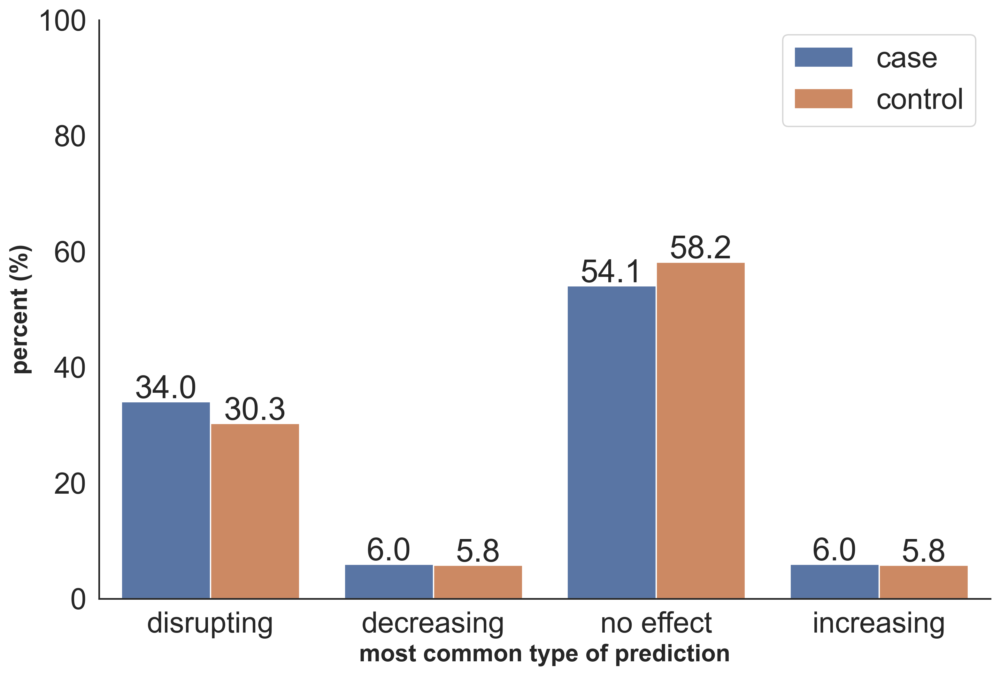

In [116]:
fig, ax = plt.subplots(figsize=(12, 8), dpi=300)
sns.set(font_scale=2, style='white')
my_order = ['disrupting', 'decreasing', 'no effect', 'increasing']
x, y = 'pred_most_common_type', 'sample_type'
df_1 = master_table.groupby(y)[x].value_counts(normalize=True)
df_1 = df_1.mul(100)
df_1 = df_1.rename('percent').reset_index()

plot = sns.barplot(x=x, y='percent', hue=y, data=df_1, order=my_order)
plot.set_ylim(0, 100)
# plot = sns.countplot(data=master_table, x='pred_most_common_type', ax=ax, order=my_order, hue='sample_type')
# plt.rcParams["axes.labelsize"] = 12

for p in plot.patches:
    plot.annotate(format(p.get_height(), '.1f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')

ax.set_xlabel('most common type of prediction', fontsize=18, fontweight='bold')
ax.set_ylabel('percent (%)', fontsize=18, fontweight='bold')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.legend().set_title('')

png1 = io.BytesIO()
plt.savefig(png1, format="png")
# Load this image into PIL
png2 = Image.open(png1)
# Save as TIFF
png2.save("./psymukb_via_att_plots/pred_type_case_control_percent_nomixhealthy.tiff", dpi=png2.info['dpi'])
png1.close()

In [117]:
df_1

,sample_type,pred_most_common_type,percent
0,case,no effect,54.062471
1,case,disrupting,34.011175
2,case,decreasing,5.963177
3,case,increasing,5.963177
4,control,no effect,58.173077
5,control,disrupting,30.288462
6,control,decreasing,5.769231
7,control,increasing,5.769231


In [118]:
# plt.figure(figsize=(20, 10))
master_table.groupby(by=['PrimaryPhenotype'])['pred_most_common'].value_counts(sort=False)

PrimaryPhenotype                        pred_most_common
Amyotrophic Lateral Sclerosis (ALS)     0                    19
                                        1                     8
                                        2                    23
                                        3                     4
Anophthalmia and Microphthalmia (A/M)   2                     2
                                                           ... 
Sporadic Infantile Spasm Syndrome (IS)  1                     1
Tourette Disorder (TD)                  0                    87
                                        1                     8
                                        2                   138
                                        3                     7
Name: pred_most_common, Length: 97, dtype: int64

In [119]:
import seaborn as sns

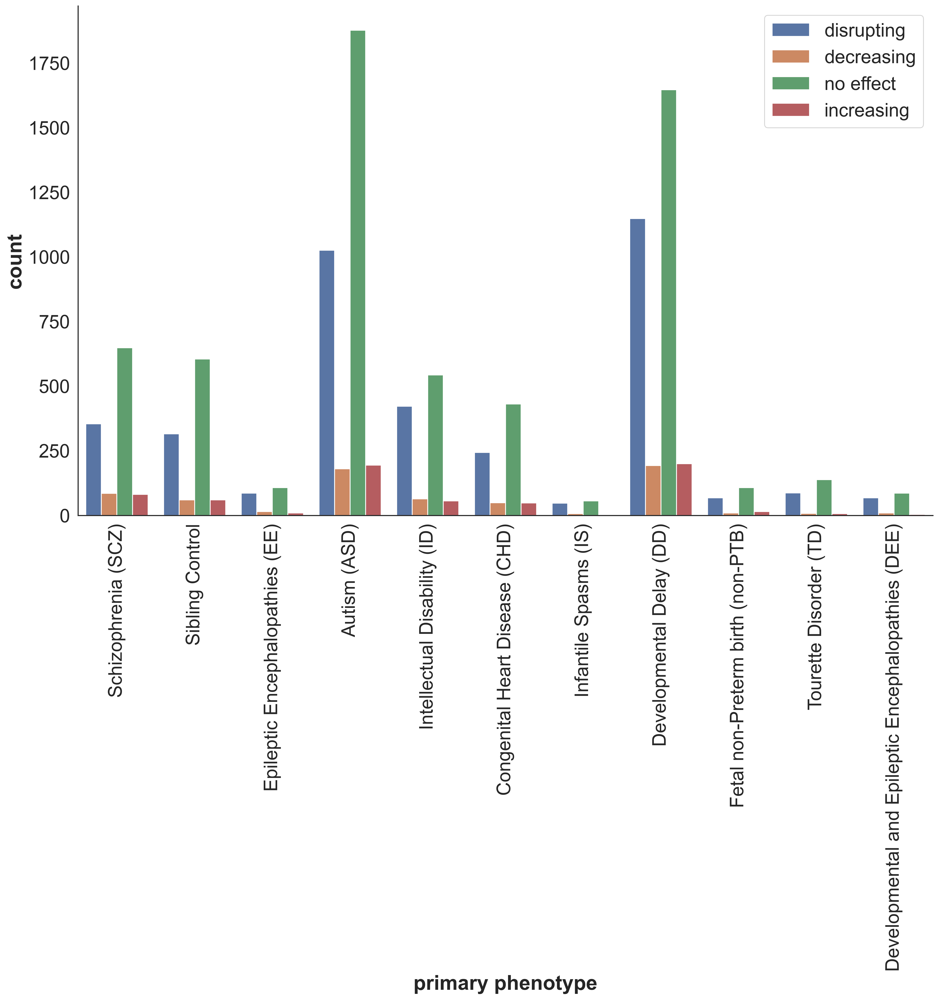

In [120]:
sns.set(font_scale=2, style='white')
fig, ax = plt.subplots(figsize=(18, 11), dpi=300)
hue_order = ['disrupting', 'decreasing', 'no effect', 'increasing']
df_1 = master_table.groupby('PrimaryPhenotype').filter(lambda x: len(x) > 100)
test_plot = sns.countplot(data=df_1, x='PrimaryPhenotype', hue='pred_most_common_type', ax=ax, hue_order=hue_order)
for item in test_plot.get_xticklabels():
    item.set_rotation(90)

ax.set_xlabel('primary phenotype', fontsize=24, fontweight='bold')
ax.set_ylabel('count', fontsize=24, fontweight='bold')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.legend().set_title('')
# plt.tight_layout()

test_plot.figure.savefig("./psymukb_via_att_plots/pred_type_disease_count100_nomixhealthy.tiff", dpi=300, bbox_inches='tight')


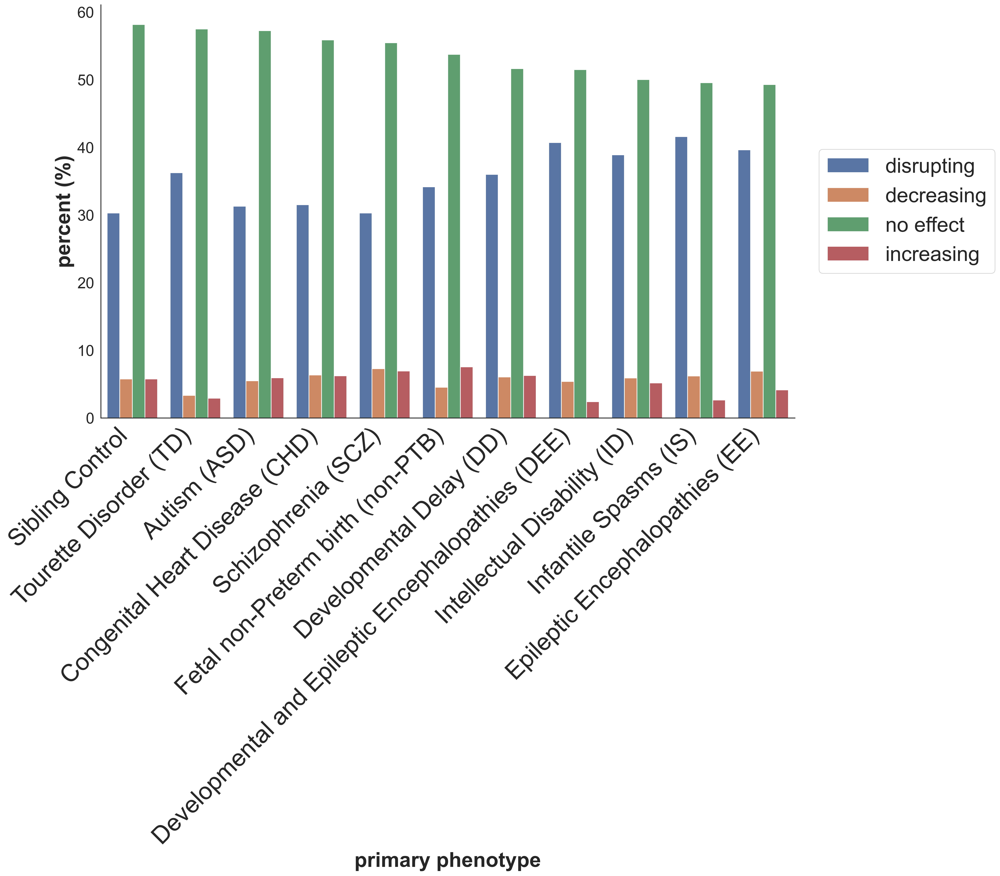

In [156]:
sns.set(font_scale=2, style='white')
fig, ax = plt.subplots(figsize=(18, 11), dpi=300)
hue_order = ['disrupting', 'decreasing', 'no effect', 'increasing']
x, y = 'PrimaryPhenotype', 'pred_most_common_type'
df_2 = master_table.groupby('PrimaryPhenotype').filter(lambda x: len(x) > 100)
df_1 = df_2.groupby(x)[y].value_counts(normalize=True)
df_1 = df_1.mul(100)
df_1 = df_1.rename('percent').reset_index()
df_1 = df_1.sort_values(['percent'], ascending=False).reset_index(drop=True)

test_plot = sns.barplot(data=df_1, x=x, y='percent', hue=y, ax=ax, hue_order=hue_order)
# for item in test_plot.get_xticklabels():
#     item.set_rotation(90)

ax.set_xlabel('primary phenotype', fontsize=30, fontweight='bold')
ax.set_ylabel('percent (%)', fontsize=30, fontweight='bold')
plt.xticks(fontsize=35, rotation=45, ha='right')
# ax.set_xticks(fontsize=30)
# ax.set_xticklabels(ax.xticklabels, rotation=40, ha='right')
# plt.legend(fontsize=30)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.legend(loc='center left', bbox_to_anchor=(1.02, 0.5), ncol=1, fontsize=30).set_title('')
# plt.legend(loc='upper right')
# plt.tight_layout()

test_plot.figure.savefig("./psymukb_via_att_plots/pred_type_disease_percent100_nomixhealthy.tiff", dpi=300, bbox_inches='tight')

# png1 = io.BytesIO()
# plt.savefig(png1, format="png")
# # Load this image into PIL
# png2 = Image.open(png1)
# # Save as TIFF
# png2.save("../data/psymukb/after_predict/pred_type_disease_count.tiff", dpi=png2.info['dpi'])
# png1.close()


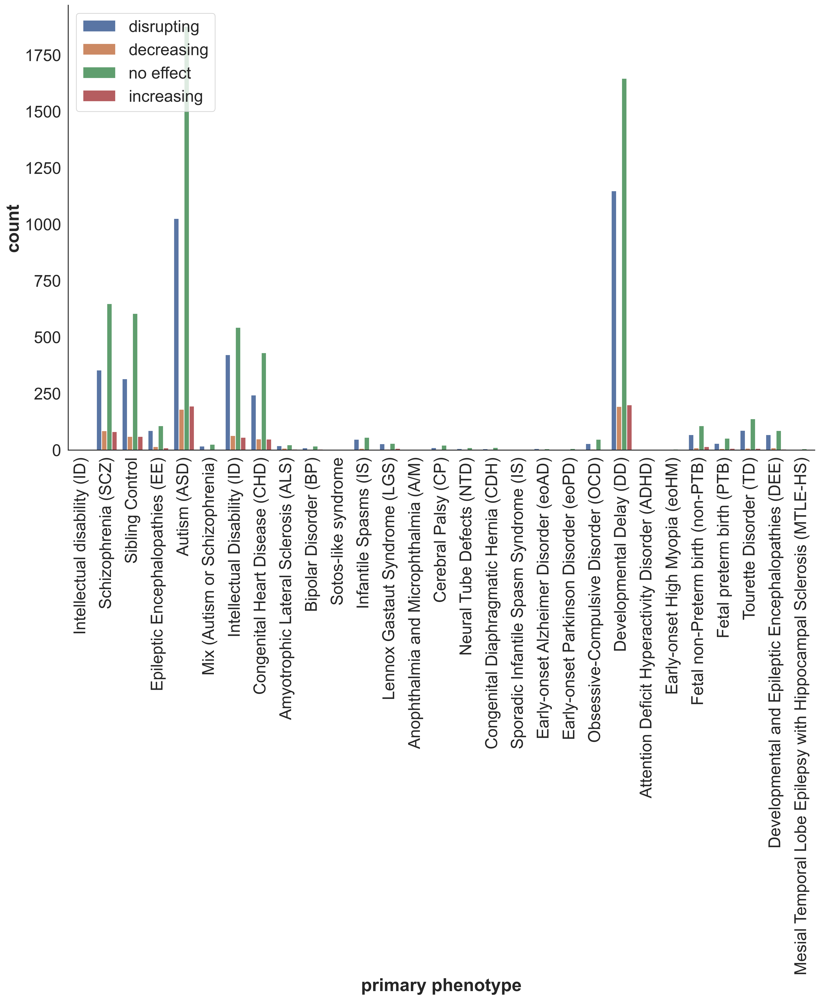

In [122]:
sns.set(font_scale=2, style='white')
fig, ax = plt.subplots(figsize=(18, 11), dpi=300)
hue_order = ['disrupting', 'decreasing', 'no effect', 'increasing']
test_plot = sns.countplot(data=master_table, x='PrimaryPhenotype', hue='pred_most_common_type', ax=ax, hue_order=hue_order)
for item in test_plot.get_xticklabels():
    item.set_rotation(90)

ax.set_xlabel('primary phenotype', fontsize=24, fontweight='bold')
ax.set_ylabel('count', fontsize=24, fontweight='bold')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.legend().set_title('')
# plt.tight_layout()

test_plot.figure.savefig("./psymukb_via_att_plots/pred_type_disease_count_nomixhealthy.tiff", dpi=300, bbox_inches='tight')

# png1 = io.BytesIO()
# plt.savefig(png1, format="png")
# # Load this image into PIL
# png2 = Image.open(png1)
# # Save as TIFF
# png2.save("../data/psymukb/after_predict/pred_type_disease_count.tiff", dpi=png2.info['dpi'])
# png1.close()


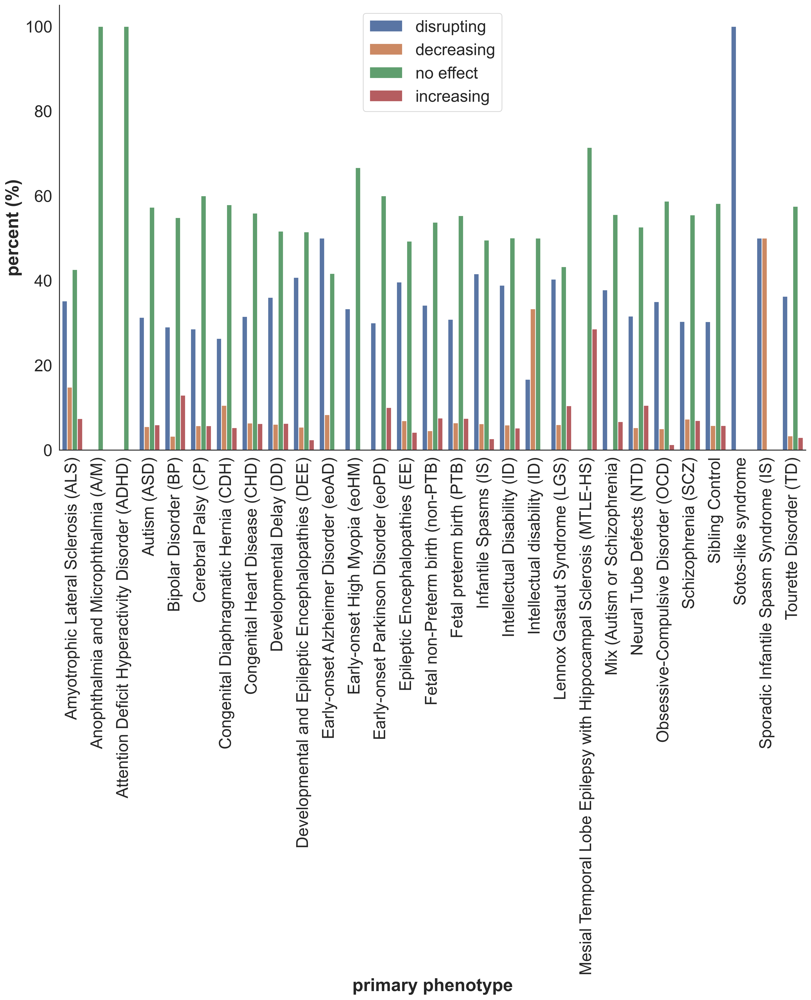

In [123]:
sns.set(font_scale=2, style='white')
fig, ax = plt.subplots(figsize=(18, 11), dpi=300)
hue_order = ['disrupting', 'decreasing', 'no effect', 'increasing']
x, y = 'PrimaryPhenotype', 'pred_most_common_type'
df_1 = master_table.groupby(x)[y].value_counts(normalize=True)
df_1 = df_1.mul(100)
df_1 = df_1.rename('percent').reset_index()

test_plot = sns.barplot(data=df_1, x=x, y='percent', hue=y, ax=ax, hue_order=hue_order)
for item in test_plot.get_xticklabels():
    item.set_rotation(90)

ax.set_xlabel('primary phenotype', fontsize=24, fontweight='bold')
ax.set_ylabel('percent (%)', fontsize=24, fontweight='bold')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.legend().set_title('')
# plt.tight_layout()

test_plot.figure.savefig("./psymukb_via_att_plots/pred_type_disease_percent_nomixhealthy.tiff", dpi=300, bbox_inches='tight')

# png1 = io.BytesIO()
# plt.savefig(png1, format="png")
# # Load this image into PIL
# png2 = Image.open(png1)
# # Save as TIFF
# png2.save("../data/psymukb/after_predict/pred_type_disease_count.tiff", dpi=png2.info['dpi'])
# png1.close()


In [126]:
group1 = [2894, 453, 3484, 346]
group2 = [1029, 235, 2884, 349]
group_name = ['disrupting', 'decreasing', 'no effect', 'increasing']
adjust_cof = len(group1) * (len(group1) - 1) / 2
for i in range(len(group1) - 1):
    for j in range(i + 1, len(group1)):
        odds, p = stats.fisher_exact([[group1[i], group1[j]], [group2[i], group2[j]]])
#         print([[group1[i], group2[i]], [group1[j], group2[j]]])
        print('{} and {}, OR: {:.3f}, p-value: {:.9f}'.format(group_name[i], group_name[j], odds, p * adjust_cof))

disrupting and decreasing, OR: 1.459, p-value: 0.000145220
disrupting and no effect, OR: 2.328, p-value: 0.000000000
disrupting and increasing, OR: 2.837, p-value: 0.000000000
decreasing and no effect, OR: 1.596, p-value: 0.000000108
decreasing and increasing, OR: 1.944, p-value: 0.000000009
no effect and increasing, OR: 1.219, p-value: 0.086523022


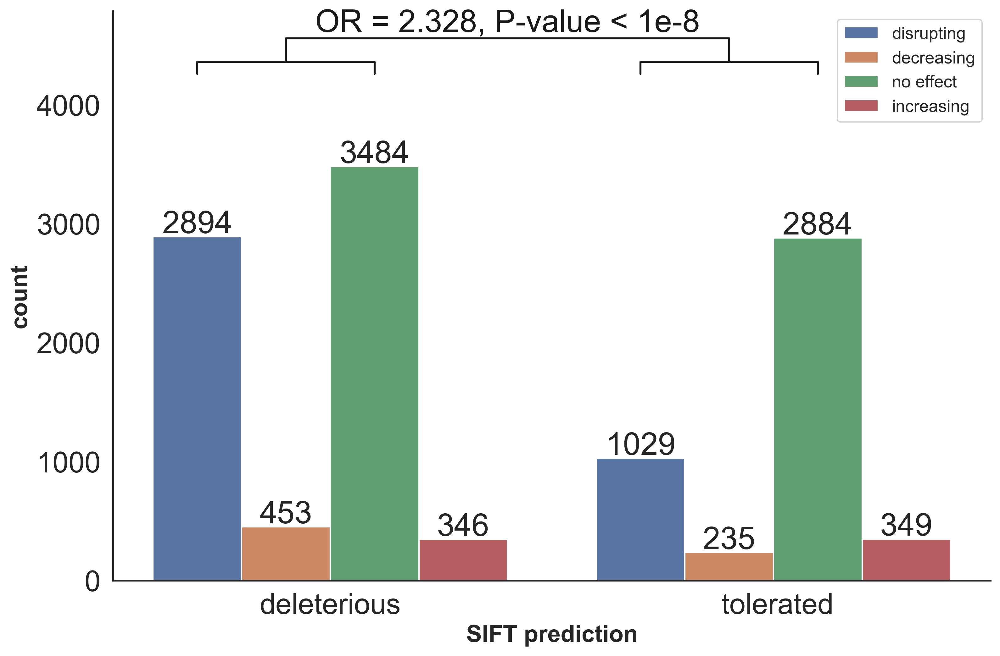

In [127]:
fig, ax = plt.subplots(figsize=(12, 8), dpi=300)
sns.set(font_scale=2, style='white')
hue_order = ['disrupting', 'decreasing', 'no effect', 'increasing']
test_plot = sns.countplot(data=master_table[~(master_table['SIFT_pred'] == '.')], x='SIFT_pred', hue='pred_most_common_type', ax=ax, hue_order=hue_order)

for p in test_plot.patches:
    test_plot.annotate(p.get_height(), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')
ax.legend().set_title('')
ax.legend(fontsize='13')
# plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

ax.set_xlabel('SIFT prediction', fontsize=18, fontweight='bold')
ax.set_ylabel('count', fontsize=18, fontweight='bold')
test_plot.set(xticklabels=['deleterious', ' tolerated'])


x1, x2 = -0.1, 0.9   # columns 'Sat' and 'Sun' (first column: 0, see plt.xticks())
y, h, col = 3764 + 600, 200, 'k'
plt.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1.5, c=col)
plt.plot([x1 - 0.2, x1 - 0.2, x1 + 0.2, x1 + 0.2], [y - h * 0.5, y, y, y - h * 0.5], lw=1.5, c=col)
plt.plot([x2 - 0.2, x2 - 0.2, x2 + 0.2, x2 + 0.2], [y - h * 0.5, y, y, y - h * 0.5], lw=1.5, c=col)
plt.text((x1+x2)*.5, y+h, "OR = 2.328, P-value < 1e-8", ha='center', va='bottom', color=col)


ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)





# plt.legend(loc='upper right')

png1 = io.BytesIO()
plt.savefig(png1, format="png")
# Load this image into PIL
png2 = Image.open(png1)
# Save as TIFF
png2.save("./psymukb_via_att_plots/pred_type_SIFT_count_nomixhealthy.tiff", dpi=png2.info['dpi'])
png1.close()

### tested in R language, based on more than 1e+07 replicates used in the Monte Carlo test, the two distribution above is different with p-value < 1e-07, chi-square test with p-value < 2.2e-16. Variants predicted DISRUPTING in MIPPI tend to DELETERIOUS in SIFT prediction more.

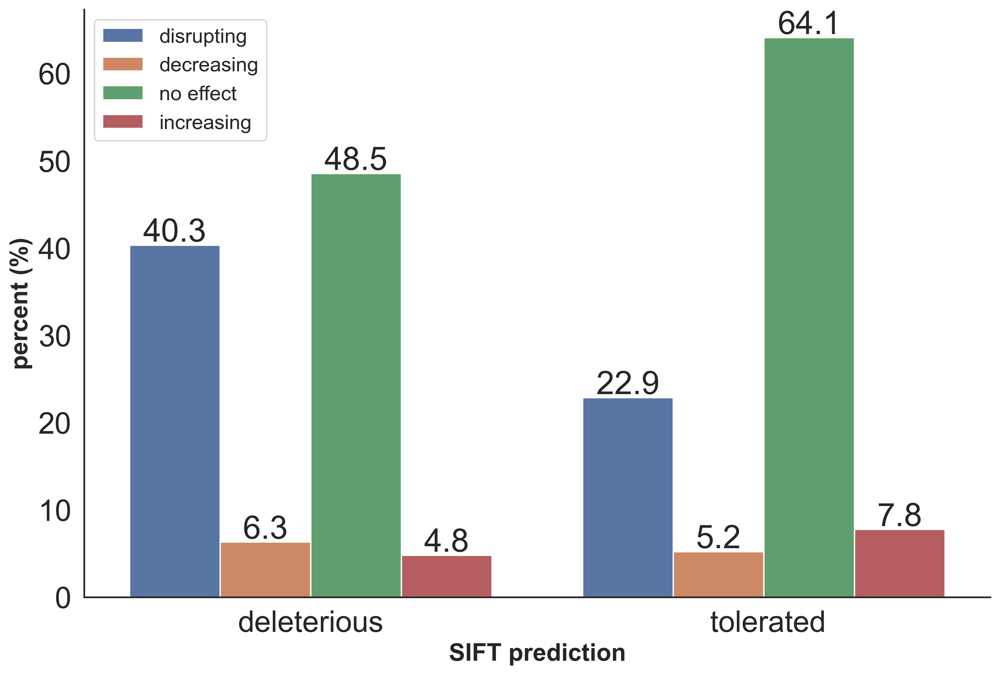

In [128]:
fig, ax = plt.subplots(figsize=(12, 8), dpi=300)
sns.set(font_scale=2, style='white')
hue_order = ['disrupting', 'decreasing', 'no effect', 'increasing']

x, y = 'SIFT_pred', 'pred_most_common_type'
df_1 = master_table[~(master_table['SIFT_pred'] == '.')]
df_1 = df_1.groupby(x)[y].value_counts(normalize=True)
df_1 = df_1.mul(100)
df_1 = df_1.rename('percent').reset_index()
test_plot = sns.barplot(data=df_1, x=x, y='percent', hue=y, ax=ax, hue_order=hue_order)

for p in test_plot.patches:
    test_plot.annotate(format(p.get_height(), '.1f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')
ax.legend().set_title('')
ax.legend(fontsize='15')
# plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

ax.set_xlabel('SIFT prediction', fontsize=18, fontweight='bold')
ax.set_ylabel('percent (%)', fontsize=18, fontweight='bold')
test_plot.set(xticklabels=['deleterious', ' tolerated'])

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)



# # plt.legend(loc='upper right')

png1 = io.BytesIO()
plt.savefig(png1, format="png")
# Load this image into PIL
png2 = Image.open(png1)
# Save as TIFF
png2.save("./psymukb_via_att_plots/pred_type_SIFT_percent_nomixhealthy.tiff", dpi=png2.info['dpi'])
png1.close()

In [131]:
group1 = [1023, 175, 1230, 145]
group2 = [2781, 495, 4871, 529]
group_name = ['disrupting', 'decreasing', 'no effect', 'increasing']
adjust_cof = len(group1) * (len(group1) - 1) / 2
for i in range(len(group1) - 1):
    for j in range(i + 1, len(group1)):
        odds, p = stats.fisher_exact([[group1[i], group1[j]], [group2[i], group2[j]]])
#         print([[group1[i], group2[i]], [group1[j], group2[j]]])
        print('{} and {}, OR: {:.3f}, p-value: {:.9f}'.format(group_name[i], group_name[j], odds, p * adjust_cof))

disrupting and decreasing, OR: 1.040, p-value: 4.230927261
disrupting and no effect, OR: 1.457, p-value: 0.000000000
disrupting and increasing, OR: 1.342, p-value: 0.018957537
decreasing and no effect, OR: 1.400, p-value: 0.002602808
decreasing and increasing, OR: 1.290, p-value: 0.327552193
no effect and increasing, OR: 0.921, p-value: 2.516384243


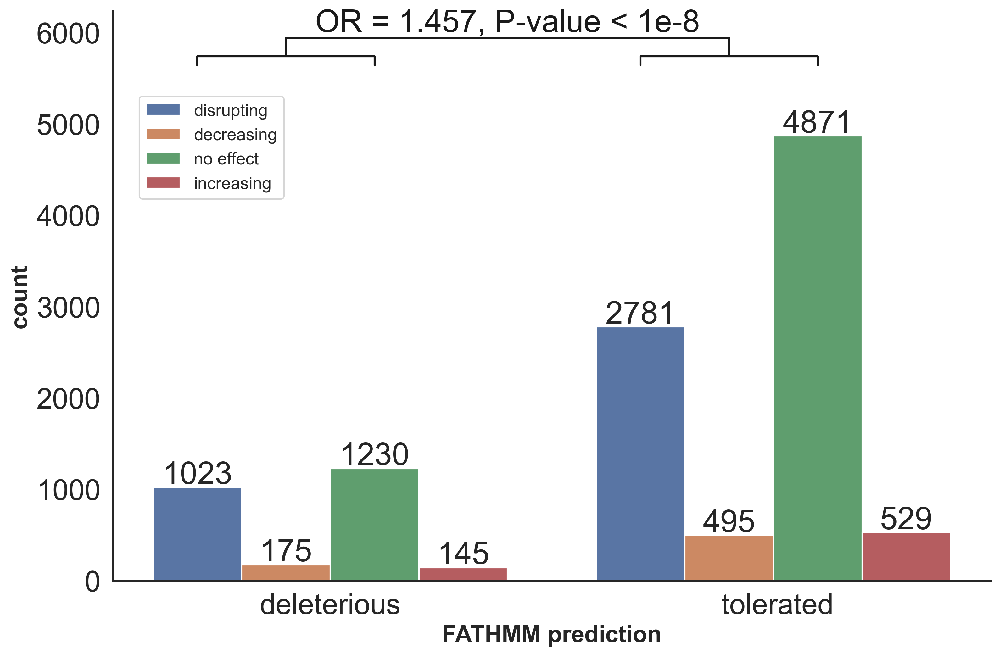

In [132]:
fig, ax = plt.subplots(figsize=(12, 8), dpi=300)
sns.set(font_scale=2, style='white')
hue_order = ['disrupting', 'decreasing', 'no effect', 'increasing']
test_plot = sns.countplot(data=master_table[~(master_table['FATHMM_pred'] == '.')], x='FATHMM_pred', hue='pred_most_common_type', ax=ax, hue_order=hue_order, order=['D', 'T'])

for p in test_plot.patches:
    test_plot.annotate(p.get_height(), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')
ax.legend().set_title('')
ax.legend(fontsize='13', bbox_to_anchor=(.03, .85), loc=2, borderaxespad=0.)


ax.set_xlabel('FATHMM prediction', fontsize=18, fontweight='bold')
ax.set_ylabel('count', fontsize=18, fontweight='bold')
# test_plot.set(xticklabels=['deleterious', ' tolerated'])
test_plot.set(xticklabels=['deleterious', ' tolerated'])

x1, x2 = -0.1, 0.9   # columns 'Sat' and 'Sun' (first column: 0, see plt.xticks())
y, h, col = 5143 + 600, 200, 'k'
plt.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1.5, c=col)
plt.plot([x1 - 0.2, x1 - 0.2, x1 + 0.2, x1 + 0.2], [y - h * 0.5, y, y, y - h * 0.5], lw=1.5, c=col)
plt.plot([x2 - 0.2, x2 - 0.2, x2 + 0.2, x2 + 0.2], [y - h * 0.5, y, y, y - h * 0.5], lw=1.5, c=col)
plt.text((x1+x2)*.5, y+h, "OR = 1.457, P-value < 1e-8", ha='center', va='bottom', color=col)


ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)





# plt.legend(loc='upper right')

png1 = io.BytesIO()
plt.savefig(png1, format="png")
# Load this image into PIL
png2 = Image.open(png1)
# Save as TIFF
png2.save("./psymukb_via_att_plots/pred_type_FATHMM_count_nomixhealthy.tiff", dpi=png2.info['dpi'])
png1.close()

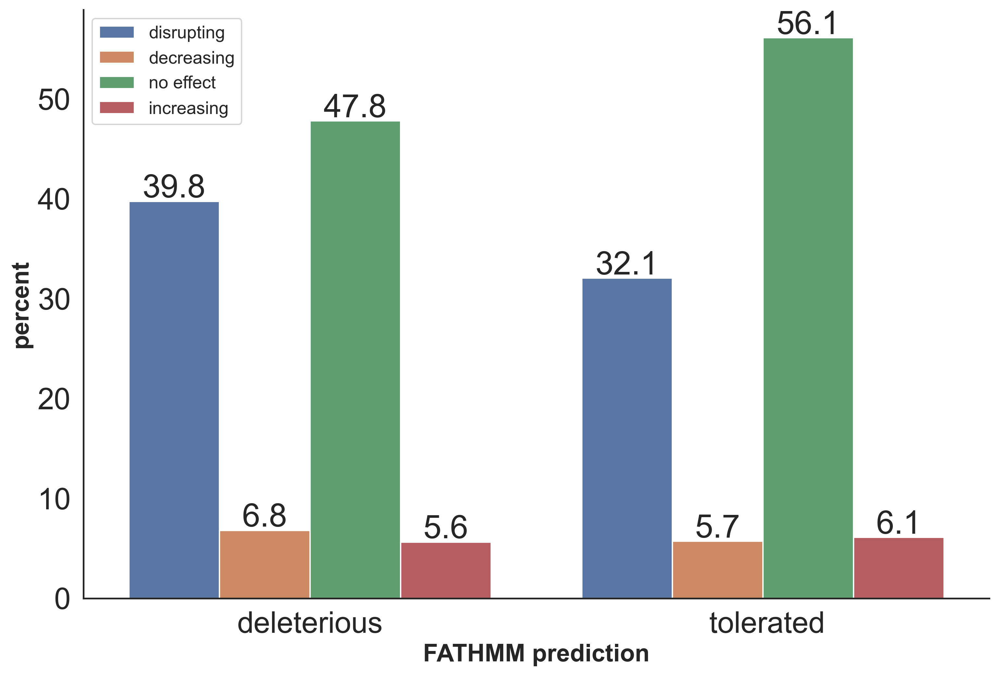

In [133]:
fig, ax = plt.subplots(figsize=(12, 8), dpi=300)
sns.set(font_scale=2, style='white')
hue_order = ['disrupting', 'decreasing', 'no effect', 'increasing']


x, y = 'FATHMM_pred', 'pred_most_common_type'
df_1 = master_table[~(master_table['FATHMM_pred'] == '.')]
df_1 = df_1.groupby(x)[y].value_counts(normalize=True)
df_1 = df_1.mul(100)
df_1 = df_1.rename('percent').reset_index()
test_plot = sns.barplot(data=df_1, x=x, y='percent', hue=y, ax=ax, hue_order=hue_order, order=['D', 'T'])


# test_plot = sns.countplot(data=master_table[~(master_table['FATHMM_pred'] == '.')], x='FATHMM_pred', hue='pred_most_common_type', ax=ax, hue_order=hue_order)

for p in test_plot.patches:
    test_plot.annotate(format(p.get_height(), '.1f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')
ax.legend().set_title('')
ax.legend(fontsize='13')
# plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

ax.set_xlabel('FATHMM prediction', fontsize=18, fontweight='bold')
ax.set_ylabel('percent', fontsize=18, fontweight='bold')
test_plot.set(xticklabels=['deleterious', ' tolerated'])

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)





# plt.legend(loc='upper right')

png1 = io.BytesIO()
plt.savefig(png1, format="png")
# Load this image into PIL
png2 = Image.open(png1)
# Save as TIFF
png2.save("./psymukb_via_att_plots/pred_type_FATHMM_percent_nomixhealthy.tiff", dpi=png2.info['dpi'])
png1.close()

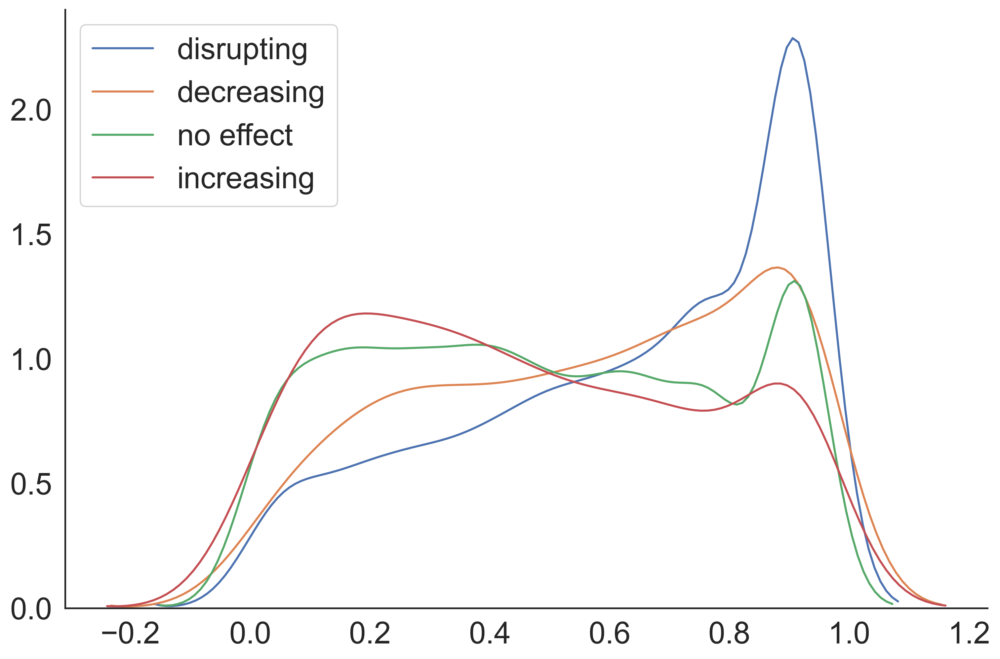

In [134]:
tmp_table = master_table[~(master_table['SIFT_score'] == '.')]

fig, ax = plt.subplots(figsize=(12, 8), dpi=300)
sns.set(font_scale=2, style='white')
hue_order = ['disrupting', 'decreasing', 'no effect', 'increasing']
a = tmp_table[tmp_table['pred_most_common_type'] == 'disrupting']
b = tmp_table[tmp_table['pred_most_common_type'] == 'decreasing']
c = tmp_table[tmp_table['pred_most_common_type'] == 'no effect']
d = tmp_table[tmp_table['pred_most_common_type'] == 'increasing']
sns.kdeplot(a['SIFT_converted_rankscore'], label='disrupting', ax=ax)
sns.kdeplot(b['SIFT_converted_rankscore'], label='decreasing', ax=ax)
sns.kdeplot(c['SIFT_converted_rankscore'], label='no effect', ax=ax)
sns.kdeplot(d['SIFT_converted_rankscore'], label='increasing', ax=ax)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

png1 = io.BytesIO()
plt.savefig(png1, format="png")
# Load this image into PIL
png2 = Image.open(png1)
# Save as TIFF
png2.save("./psymukb_via_att_plots/pred_type_distribution_kde_nomixhealthy.tiff", dpi=png2.info['dpi'])
png1.close()

In [230]:
master_table.groupby('pred_most_common')['SIFT_converted_rankscore']

In [228]:
master_table.groupby('pred_most_common')['fathmm-MKL_coding_pred'].value_counts()

pred_most_common  fathmm-MKL_coding_pred
0                 D                         3295
                  N                          420
                  .                            5
1                 D                          779
                  N                          157
                  .                            3
2                 D                         6020
                  N                         1861
                  .                           23
3                 D                          901
                  N                          245
Name: fathmm-MKL_coding_pred, dtype: int64

In [ ]:
master_table.SIFT_converted_rankscore

In [172]:
sns.__version__

'0.10.1'

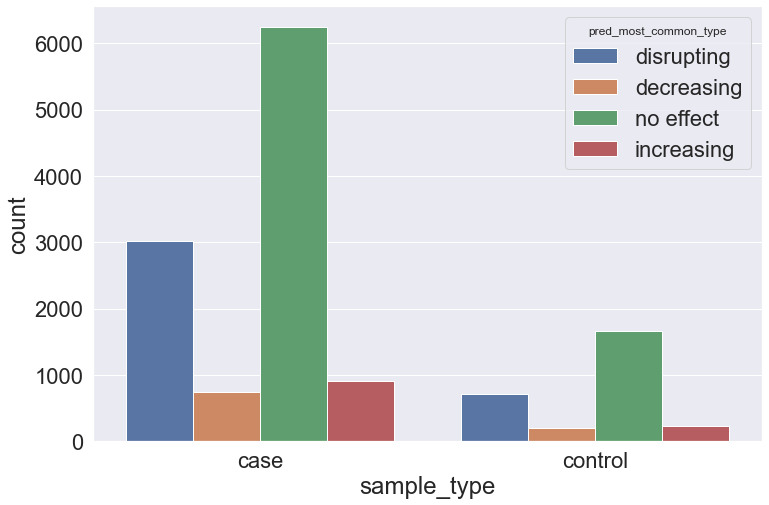

In [221]:
fig, ax = plt.subplots(figsize=(12, 8))
sns.set(font_scale=2)
hue_order = ['disrupting', 'decreasing', 'no effect', 'increasing']
test_plot = sns.countplot(data=master_table, x='sample_type', hue='pred_most_common_type', ax=ax, hue_order=hue_order)

In [215]:
master_table.groupby('sample_type')['pred_most_common'].value_counts(sort=False)

sample_type  pred_most_common
case         0                   3015
             1                    742
             2                   6244
             3                    916
control      0                    708
             1                    200
             2                   1666
             3                    230
Name: pred_most_common, dtype: int64

In [199]:
master_table['SIFT_pred'].value_counts()

D    8212
T    5188
.     309
Name: SIFT_pred, dtype: int64

In [200]:
master_table['Polyphen2_HDIV_pred'].value_counts()

D    6958
B    4513
P    2138
.     100
Name: Polyphen2_HDIV_pred, dtype: int64

In [201]:
master_table['pred_most_common'].value_counts()

2    7910
0    3723
3    1146
1     942
Name: pred_most_common, dtype: int64

In [202]:
master_table['FATHMM_pred'].value_counts()

T    9982
D    2938
.     789
Name: FATHMM_pred, dtype: int64

In [134]:
master_table.groupby(['FATHMM_pred', 'sample_type']).size()

FATHMM_pred  sample_type
.            case            635
             control         154
D            case           2406
             control         532
T            case           7868
             control        2114
dtype: int64

In [135]:
master_table.groupby(['pred_most_common', 'sample_type']).size()

pred_most_common  sample_type
0                 case           3015
                  control         708
1                 case            742
                  control         200
2                 case           6244
                  control        1666
3                 case            916
                  control         230
dtype: int64

In [137]:
master_table['sample_type'].value_counts()

case       10917
control     2804
Name: sample_type, dtype: int64

In [209]:
master_table.groupby(['pred_most_common', 'SIFT_pred'])['SIFT_pred'].count()

pred_most_common  SIFT_pred
0                 .              82
                  D            2725
                  T             913
1                 .              35
                  D             583
                  T             321
2                 .             167
                  D            4324
                  T            3413
3                 .              25
                  D             580
                  T             541
Name: SIFT_pred, dtype: int64

In [222]:
master_table['pred_disrupting'].sum()

77943

In [223]:
master_table['pred_decreasing'].sum()

27268

In [224]:
master_table['pred_noeffect'].sum()

144443

In [225]:
master_table['pred_increasing'].sum()

24704

In [229]:
master_table.shape

(13721, 182)

In [15]:
from  scipy.stats import chi2_contingency
from scipy import stats
import numpy as np
kf_data = np.array([[200,193,1148,1647], 
                    [60,60,315,605]])
print(stats.chi2_contingency(kf_data)[0:3])

(14.089992925133673, 0.00278518122846815, 3)


In [53]:
import scipy.stats as stats
data = np.array([[1647,3188], 
                [605,1040]])
odd_ratio, p_value = stats.fisher_exact(data)
print('odd ratio is : ' + str(odd_ratio))
print('p_value is : ' + str(p_value))

odd ratio is : 0.8880823750220351
p_value is : 0.04791271957719764


In [54]:
import scipy.stats as stats
data = np.array([[1148,3188], 
                [315,1040]])
odd_ratio, p_value = stats.fisher_exact(data)
print('odd ratio is : ' + str(odd_ratio))
print('p_value is : ' + str(p_value))

odd ratio is : 1.1889028300571587
p_value is : 0.018731959937285825


In [55]:
import scipy.stats as stats
data = np.array([[193,3188], 
                [60,1040]])
odd_ratio, p_value = stats.fisher_exact(data)
print('odd ratio is : ' + str(odd_ratio))
print('p_value is : ' + str(p_value))

odd ratio is : 1.0493517356754496
p_value is : 0.8215379371183986


In [56]:
import scipy.stats as stats
data = np.array([[200,3188], 
                [60,1040]])
odd_ratio, p_value = stats.fisher_exact(data)
print('odd ratio is : ' + str(odd_ratio))
print('p_value is : ' + str(p_value))

odd ratio is : 1.0874111250522793
p_value is : 0.6039895063103238
